<a href="https://colab.research.google.com/github/hantablack9/Market-Lead-Scoring-Propensity-Modeling/blob/main/Copy_of_Another_copy_of_Final_Market_Lead_scoring.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#LEAD SCORING USING ML ALGORITHMS

> Problem Statement: In this capstone project, you are going to analyze the given data set and build a machine learning algorithm to predict the propensity of buying the course
- Dataset: Purchase_Fraud_Data.csv

---

**Dataset Description:**

Every row in this dataset contains information about the lead. Along with lead details, we also have other details like number of calls made by salesperson, how long it has been since the lead has been generated etc.

- **`Funnel_category`**: created from `stagename` to decrease the number of levels in target column (Target)
- **`stagename`** The stage at which the lead is
- **`opportunity_id`** Lead unique id

- **`subsource`** The subsource from which the lead has been obtained
- **`unanswered_call_counter`** Number of calls that went unanswered
- **`unserviced age`** - No. of days since no action taken on that lead
- **`ageing`** - Days the lead has aged since created
- **`source`**: The source from which the lead has been obtained

- **`Opportunity_created_date`**: Date on which lead was generated
- **`time_taken_for_allocation`**: Time taken to allocate the lead to a salesperson
- **`no_of_calls`**: Number of calls
- **`calldurationinseconds`**: Duration the call from salesperson to the lead lasted
- **`City`**: City the lead belongs to
- **`City Type`**: Whether the city belong to Tier-1, Tier-2 or Tier-3

- **`Laststagechangedate`**- The date when the stage of the lead changes
- **`Sales_end_date`**-Date at which sales end
- **`Sales_start_date`**- Date at which sales start
- **`Program_number`**: The number of the program
- **`Program Code -Renewed`**: The code of the program
- **`total_program_fee.1`**: The fees of the program
- **`Category`**: Category the program belongs to
- **`Is_serviced_c`**: Whether action is taken on the lead
- **`Business_vertical`**: The business vertical that the program belongs to
- **`Budget`**: Budget allocated for the specific program
- **`Lastactivitydate`**: Last date of activity with the lead
- **`Institute`**: The institute which is offering the program
- **`Year`**: The year in which the lead was generated
- **`Month`**: The month in which the lead was generated
- **`Month_name`**: The name of the month in which the lead was generated
- **`Week of Year`**: The week of the year in which the lead was generated
- **`Week of Month`**: The week of the month in which the lead was generated
- **`Day of Year`**: The day of the year the lead was generated
- **`Day of Week`**: The day of the week the lead was generated
- **`Day Name`**: The name of the day the lead was generated
- **`Age`**: The age range of the lead
- **`Session_Start_day_inweek`**: The day which session starts
- **`Weekly_sessionsdays_count`**: How many sessions in a week

- **`is_session_Working_day`**: Does the session fall on a working day
- **`Workexp`**- The work experience the lead has
- **`workex_reqd`**: work exp required to take the course

- **`sales_Working_day`**: Whether it’s a working day for sales
- **`Time`**: The time at which the lead is generated
- **`Hour`**: The hour at which the lead is generated
- **`IscreatedinWorking_hour`**: Whether the lead is created in working hour of sales




**SHAP and ELI5 Model explanations**

An additional feature of this notebook, for improving client confidence in the best performing models has also been provided, along with a guide for interpreting the force plots.

**Note:** The dataset used for this project is the full, untruncated and original version.


# 1. Importing Dependencies

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/My Drive/Colab Notebooks/PGCP IIT Roorkee Capstone Files

#https://drive.google.com/drive/folders/1LFKP9ncSSDggD2yNDdNKstdfGQcx5lLQ?usp=drive_link
# /content/drive/MyDrive/Colab Notebooks/PGCP IIT Roorkee Capstone Files/dataset.csv

Mounted at /content/drive
/content/drive/My Drive/Colab Notebooks/PGCP IIT Roorkee Capstone Files


In [ ]:
%%capture
!pip install -U causalinference hyperopt hyperas eli5 shap
!pip install -U feature_engine keras_tuner imblearn lime ipympl hyperband
!pip install icecream

In [ ]:
%%capture
import os
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn.objects as so
import scipy.stats
from scipy.stats import zscore
from icecream import ic

%matplotlib inline

In [ ]:
# Set plot style
sns.set(color_codes=True)
sns.set_style("darkgrid")
#plt.style.use("ggplot")
#sns.choose_diverging_palette()
sns.diverging_palette(h_neg = 0, h_pos=355, s=100, l=50, sep=1, n=16, center='dark', as_cmap=False)

plt.rcParams['figure.figsize']=15,8
pd.pandas.set_option('display.max_columns', None)
pd.pandas.set_option('display.max_rows', None)
pd.pandas.set_option('display.float_format', lambda x: '%.3f' % x)

import warnings
warnings.filterwarnings('ignore')

In [ ]:
df = pd.read_csv('dataset.csv')
#df.to_pickle('./df.pkl')

In [ ]:
def change_column_names(df):
    '''
    Docstring:
    This method corrects the inconsistencies in feature names, and formats them to be
    easily readable and callable.
    '''
    df.columns = df.columns.str.lower().str.replace('-',' ').str.replace(' ', '_').\
    str.replace('__', '_').str.replace('/', '_by_').str.replace('(', '').\
    str.replace(')', '').str.replace('-','').str.replace('.1', '')
    return df

df1 = change_column_names(df.copy())
df1.columns

Index(['opportunity_id', 'stagename', 'subsource', 'unanswered_call_counter',
       'unserviced_age', 'ageing', 'source', 'opportunity_created_date',
       'time_taken_for_allocation', 'no_of_calls', 'calldurationinseconds',
       'funnel_category', 'days_to_apply', 'days_to_engage', 'days_to_enroll',
       'days_to_payment', 'days_to_waste', 'city', 'city_type', 'workexp',
       'workexp_min', 'workexp_max', 'laststagechangedate', 'is_serviced_c',
       'sales_end_', 'sales_start_date', 'program_number',
       'program_code_renewed', 'total_program_fee', 'category',
       'business_vertical', 'budget', 'lastactivitydate', 'institute',
       'cal_diff', 'call2_diff', 'call3_diff', 'call4_diff', 'year', 'month',
       'month_name', 'week_of_year', 'week_of_month', 'day_of_year',
       'day_of_week', 'day_name', 'age', 'agemin', 'agemax',
       'competitor_program_feehigh', 'competitor_program_feelow',
       'program_start_date_c', 'program_end_date_c', 'sales_working_day',


In [ ]:
import copy
df = copy.deepcopy(df1)
del(df1)
display(df.info())
display(df.describe())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 495953 entries, 0 to 495952
Data columns (total 68 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   opportunity_id              495953 non-null  object 
 1   stagename                   495953 non-null  object 
 2   subsource                   494791 non-null  object 
 3   unanswered_call_counter     495953 non-null  int64  
 4   unserviced_age              495882 non-null  float64
 5   ageing                      495953 non-null  int64  
 6   source                      495620 non-null  object 
 7   opportunity_created_date    495953 non-null  object 
 8   time_taken_for_allocation   492232 non-null  float64
 9   no_of_calls                 495953 non-null  int64  
 10  calldurationinseconds       349747 non-null  float64
 11  funnel_category             495953 non-null  object 
 12  days_to_apply               8096 non-null    float64
 13  days_to_engage

None

,unanswered_call_counter,unserviced_age,ageing,time_taken_for_allocation,no_of_calls,calldurationinseconds,days_to_apply,days_to_engage,days_to_enroll,days_to_payment,days_to_waste,workexp_min,workexp_max,total_program_fee,budget,cal_diff,call2_diff,call3_diff,call4_diff,year,month,week_of_year,week_of_month,day_of_year,day_of_week,agemin,agemax,competitor_program_feehigh,competitor_program_feelow,sales_working_day,hour,iscreatedinworking_hour,workex_reqd,is_session_working_day,weekly_sessionsdays_count,sessions_in_week,workex_reqd_by_workexpmax,workex_reqd_by_agemax,workex_reqd_by_agemin
count,495953.000,495882.000,495953.000,492232.000,495953.000,349747.000,8096.000,89782.000,6562.000,578.000,390935.000,495953.000,495953.000,495953.000,495953.000,495953.000,495953.000,495953.000,495953.000,495953.000,495953.000,495953.000,495953.000,495953.000,495953.000,495953.000,495953.000,495953.000,495953.000,495953.000,495953.000,495953.000,495953.000,495953.000,495953.000,495953.000,495953.000,495953.000,495953.000
mean,1.076,308.082,79.625,2687.444,6.472,148.520,-36.569,-331.930,-100.853,-216.338,-2.973,5.092,9.388,355054.137,2289610.707,4.265,0.020,0.020,0.019,2021.534,5.893,24.494,3.154,163.807,2.853,27.696,32.611,532581.206,236702.758,0.750,10.214,0.496,3.631,0.128,1.242,1.242,0.701,0.113,0.134
std,2.169,1336.824,122.886,33868.689,5.918,324.608,1625.295,3865.969,2485.989,3190.496,903.727,5.015,5.719,391227.460,1788503.299,22.443,0.458,0.585,0.847,0.560,3.230,14.083,1.333,98.932,1.961,6.741,7.185,586841.191,260818.307,0.433,5.326,0.500,2.788,0.334,0.428,0.428,1.304,0.088,0.104
min,0.000,0.000,0.000,-3023.000,1.000,0.000,-44463.421,-44741.746,-43966.712,-44446.583,-43971.323,0.000,1.000,70800.000,161000.000,0.000,0.000,0.000,0.000,2020.000,1.000,1.000,1.000,1.000,0.000,21.000,23.000,106200.000,47200.000,0.000,0.000,0.000,0.000,0.000,1.000,1.000,0.000,0.000,0.000
25%,0.000,0.000,1.000,0.000,2.000,1.000,2.109,0.083,17.099,0.044,3.124,1.000,5.000,152650.000,1510000.000,0.000,0.000,0.000,0.000,2021.000,4.000,15.000,2.000,96.000,1.000,22.000,27.000,228975.000,101766.667,0.000,6.000,0.000,2.000,0.000,1.000,1.000,0.200,0.061,0.071
50%,0.000,0.000,1.000,0.000,5.000,29.000,15.284,0.594,28.582,4.637,10.451,5.000,10.000,225000.000,1797000.000,0.000,0.000,0.000,0.000,2022.000,5.000,21.000,3.000,142.000,3.000,28.000,33.000,337500.000,150000.000,1.000,10.000,0.000,3.000,0.000,1.000,1.000,0.400,0.075,0.091
75%,1.000,0.000,111.000,0.000,9.000,118.000,36.546,5.327,47.289,17.141,21.043,10.000,15.000,360000.000,2112000.000,1.000,0.000,0.000,0.000,2022.000,8.000,36.000,4.000,243.000,5.000,34.000,40.000,540000.000,240000.000,1.000,14.000,1.000,5.000,0.000,1.000,1.000,0.600,0.152,0.179
max,43.000,15922.000,767.000,887999.000,296.000,7706.000,431.760,581.719,520.934,460.937,629.827,30.000,35.000,1652000.000,8687000.000,683.000,99.000,323.000,322.000,2022.000,12.000,53.000,6.000,366.000,6.000,60.000,65.000,2478000.000,1101333.333,1.000,23.000,1.000,10.000,1.000,2.000,2.000,10.000,0.435,0.476


In [ ]:
rename_cols = {'year':'opp_year',
         'month':'opp_month',
        'month_name':'opp_month_name',
         'week_of_year':'opp_week_of_year',
         'week_of_month':'opp_week_of_month',
         'day_of_year':'opp_day_of_year',
       'day_of_week':'opp_day_of_week',
         'day_name':'opp_day_name',
                'hour' : 'opp_hour'}
df.rename(columns = rename_cols, inplace = True)

## Insights from exploring the raw excel data:
1. **`Age(min)`** and **`Age(max)`** features are the lower and upper limits of **`Age`** feature
2. The `workexp` feature is a range, whose upper and lower limits are stored in the features`workexp max` and `workexp min` respectively.
3. Some ratio features, marked by infinity symbol and NaNs in the below engineered features are a result of the denominator being the number 0. Preprocess accordingly. I will create additional features from the original features.
> `Workes-reqd/min_workex`, `workex-reqd/workexpmax`, `workex- minworkexp/reqd`, `workex-max/reqd`, `workex_reqd/Age(max)`, `workex_reqd/Age(min)`.
4. The below features measure the time it took between `laststagechangedate` and `Opportunity_created_date`. Need additional interpretation of `laststagechangedate`.
> `Days_to_apply`, `Days_to_engage`, `Days_to_enroll`, `Days_to_payment`, `Days_to_waste`
5. `Age(min)` and `Age(max)` information will be encoded in the addtional features being created as mentioned in point 3. Might drop these.

**Strategy:**
- Identify Action features (state changes), map to temporal or other features

- Program Features
- Lead Features
- Threshold features (requirements)

---
- Identify feature importances
- Categorical: Nominal, Cardinal, and Ordinal features
> Encoding strategies for Ordinal features
> Cardinal features: One-hot
- Numeric: Binary vs Ordinal, Continuous vs Discrete
- Nominal features: Dummy variables
---


# Business Questions: Customer and Business (Marketing/Sales/Operations) Facing (answered)
1. Do certain demographics have a higher propensity to buy the course?
>- Yes. Leads with 1-5 years of work experience are the top buyers, and there is a decreasing trend as the experience increases.
>- Additionally, younger (by age) leads tend to purchase more than older leads.
2. Do certain city tiers show a higher propensity to buy the course?
>- Yes. Leads from Tier-1, Tier-3 and Tier-2 cities happen to purchase the courses, in this order.
3. Do certain sales channels have a higher propensity to buy the course?
>- The answer varies. Refer SHAP model explanations and feature interactions in Sequences 5.3 and 8.2 in Model Building (section 5) of this notebook.
4. Are there any time-feature dependencies on lead's propensity to buy the course? For eg, do leads generated during certain months show a higher propensity to buy?
>- Yes. There is are demand spikes and increased lead generation during weeks 20-27.
5. What is the enrollment trend for different target classes from the time of lead generation? Ignore cold/wasted leads.
>- There is nearly a 22 day lead time for a lead to convert for the Sales Team.
>- Wasted leads have a median aging of ~12-15 days.
>- Leads are engaged with zero delays.  
    >- **Note:** A conversion for the Sales team is defined as: If a lead **Initiates Payment** and completes **Application** for a program. Consequently, **Enrolled** category also counts as converted leads.
6. Are there hidden clusters in the data? (K-Means + 3D PCA wiz in [TensorFlow projector](https://projector.tensorflow.org) ?)
>- There are clusters observed in the data, as observed in the 3D Truncated SVD plots, but it is not easily noticeable due to the dimensionality of data.
7. Lag-times dependencies on funnel category.
>- Answered in Q5.
8. Impact of price considerations on lead propensity and funnel stage.
>- Price has little impact on conversion. An example being that, IIM Kozhikode is not only the most popular institute, but also has the highest program median price among all institutes.
>- To cross-verify whether price adversely affects lead conversion, we need to use techniques based on Bayesian Inference and Causal Inference, which is beyond the project scope and client needs, as understood during various rounds of stakeholder discussions.
9. Who is the intended model user? And what would be their keystone metrics? This is useful for EDA, Model Architecture, and Feature Engineering.
>- Based on discussions with the Business, the Sales team in the intended model user. Their keystone metric is the number of engaged leads Initiating Payment and completing Applications for a program.
10. Class Imbalance present? Effects on model performance?
>- The dataset is highly imbalanced. Various undersampling techniques have been used and over multiple iterations, model performance has been increased from 37% recall to a 93% recall.

**Project Outcome:** The best model successfully captures 93% of revenue-generating leads (recall) in Positive (82%) and Neutral (11%)  Classes. Additional Analyses cn be inferred from the plots in EDA.

# 2. Data Preprocessing
>- Missing Values Handling
>- Duplication
>- Feature Engineering
>>- Feature Extraction
>>- Data Accuracy
>>- Data Consistency


In [ ]:
df.head()

,opportunity_id,stagename,subsource,unanswered_call_counter,unserviced_age,ageing,source,opportunity_created_date,time_taken_for_allocation,no_of_calls,calldurationinseconds,funnel_category,days_to_apply,days_to_engage,days_to_enroll,days_to_payment,days_to_waste,city,city_type,workexp,workexp_min,workexp_max,laststagechangedate,is_serviced_c,sales_end_,sales_start_date,program_number,program_code_renewed,total_program_fee,category,business_vertical,budget,lastactivitydate,institute,cal_diff,call2_diff,call3_diff,call4_diff,opp_year,opp_month,opp_month_name,opp_week_of_year,opp_week_of_month,opp_day_of_year,opp_day_of_week,opp_day_name,age,agemin,agemax,competitor_program_feehigh,competitor_program_feelow,program_start_date_c,program_end_date_c,sales_working_day,time_of_lead,opp_hour,iscreatedinworking_hour,workex_reqd,is_session_working_day,session_start_day_inweek,weekly_sessionsdays_count,sessions_in_week,workes_reqd_by_min_workex,workex_reqd_by_workexpmax,workex_minworkexp_by_reqd,workex_max_by_reqd,workex_reqd_by_agemax,workex_reqd_by_agemin
0,0060o00001WJbrYAAT,Cold,facebook,0,0.000,252,facebook,02-06-2021 01:23,0.000,2,NaN,Wasted_leads,NaN,NaN,NaN,NaN,0.342,Delhi NCR,Tier-1,5-10 years,5,10,02-06-2021 09:35,True,12-Jun-21,23-Feb-21,P-00114,IIMI-CPDMS,203550,Digital Marketing,MDP,1450000,02-06-2021 00:00,IIM Indore,0,0,0,0,2021,6,June,23,1,153,2,Wednesday,28-33 years,28,33,305325.000,135700.000,19-Jun-21,30-May-22,1,01:23:52,1,0,2,0,Saturday,1,1,0.4,0.200,2.5,5,0.061,0.071
1,0060o00001WJcpKAAT,Cold,facebook,0,0.000,241,facebook,02-06-2021 05:47,0.000,8,NaN,Wasted_leads,NaN,NaN,NaN,NaN,11.252,Delhi NCR,Tier-1,5-10 years,5,10,13-06-2021 11:50,True,12-Jun-21,12-Apr-21,P-00103,IITR-PGCAIDL,250000,Data Science- AIML,Tech,1433000,13-06-2021 00:00,IIT Ropar,0,0,0,0,2021,6,June,23,1,153,2,Wednesday,28-33 years,28,33,375000.000,166666.667,19-Jun-21,26-Dec-21,1,05:47:06,5,0,2,0,Saturday,1,1,0.4,0.200,2.5,5,0.061,0.071
2,0060o00001WJhn0AAD,Cold,facebook,0,0.000,245,facebook,03-06-2021 07:47,0.000,2,NaN,Wasted_leads,NaN,NaN,NaN,NaN,6.037,Delhi NCR,Tier-1,5-10 years,5,10,09-06-2021 08:40,True,12-Jun-21,23-Feb-21,P-00114,IIMI-CPDMS,203550,Digital Marketing,MDP,1450000,09-06-2021 00:00,IIM Indore,0,0,0,0,2021,6,June,23,1,154,3,Thursday,28-33 years,28,33,305325.000,135700.000,19-Jun-21,30-May-22,1,07:47:19,7,0,2,0,Saturday,1,1,0.4,0.200,2.5,5,0.061,0.071
3,0060o00001WJlgqAAD,Cold,facebook,0,0.000,127,facebook,04-06-2021 05:12,0.000,3,NaN,Wasted_leads,NaN,NaN,NaN,NaN,123.355,Delhi NCR,Tier-1,5-10 years,5,10,05-10-2021 13:44,True,12-Jun-21,23-Feb-21,P-00114,IIMI-CPDMS,203550,Digital Marketing,MDP,1450000,05-10-2021 00:00,IIM Indore,0,0,0,0,2021,6,June,23,1,155,4,Friday,28-33 years,28,33,305325.000,135700.000,19-Jun-21,30-May-22,1,05:12:54,5,0,2,0,Saturday,1,1,0.4,0.200,2.5,5,0.061,0.071
4,0060o00001WJlmtAAD,Cold,facebook,0,0.000,244,facebook,04-06-2021 05:51,0.000,3,NaN,Wasted_leads,NaN,NaN,NaN,NaN,6.067,Delhi NCR,Tier-1,5-10 years,5,10,10-06-2021 07:28,True,12-Jun-21,23-Feb-21,P-00114,IIMI-CPDMS,203550,Digital Marketing,MDP,1450000,10-06-2021 00:00,IIM Indore,0,0,0,0,2021,6,June,23,1,155,4,Friday,28-33 years,28,33,305325.000,135700.000,19-Jun-21,30-May-22,1,05:51:58,5,0,2,0,Saturday,1,1,0.4,0.200,2.5,5,0.061,0.071


In [ ]:
display(df[df['weekly_sessionsdays_count'] != df['sessions_in_week']].shape)
#df.drop('weekly_sessionsdays_count', axis =1 , inplace = True)
#df.drop('opp_year', axis =1, inplace = True)

(0, 68)

In [ ]:
# Change temporal features to a pandas datetime format
datetme = ['opportunity_created_date', 'laststagechangedate', 'lastactivitydate',
           'program_start_date_c', 'program_end_date_c', 'sales_end_','sales_start_date']

for feature in datetme:
    df[feature] = pd.to_datetime(df[feature], dayfirst = True, infer_datetime_format = True)

In [ ]:
categorical_features = df.drop('opportunity_id',axis=1).select_dtypes(include = 'O').columns.tolist()

numeric_features = df.select_dtypes(include = ['int', 'float', 'bool']).columns.tolist()

temporal_features = df.select_dtypes(include = ['datetime']).columns.tolist()

display(temporal_features)
print()
display(categorical_features)
print()
display(numeric_features)

['opportunity_created_date',
 'laststagechangedate',
 'sales_end_',
 'sales_start_date',
 'lastactivitydate',
 'program_start_date_c',
 'program_end_date_c']

['stagename',
 'subsource',
 'source',
 'funnel_category',
 'city',
 'city_type',
 'workexp',
 'program_number',
 'program_code_renewed',
 'category',
 'business_vertical',
 'institute',
 'opp_month_name',
 'opp_day_name',
 'age',
 'time_of_lead',
 'session_start_day_inweek',
 'workes_reqd_by_min_workex',
 'workex_minworkexp_by_reqd',
 'workex_max_by_reqd']

['unanswered_call_counter',
 'unserviced_age',
 'ageing',
 'time_taken_for_allocation',
 'no_of_calls',
 'calldurationinseconds',
 'days_to_apply',
 'days_to_engage',
 'days_to_enroll',
 'days_to_payment',
 'days_to_waste',
 'workexp_min',
 'workexp_max',
 'is_serviced_c',
 'total_program_fee',
 'budget',
 'cal_diff',
 'call2_diff',
 'call3_diff',
 'call4_diff',
 'opp_year',
 'opp_month',
 'opp_week_of_year',
 'opp_week_of_month',
 'opp_day_of_year',
 'opp_day_of_week',
 'agemin',
 'agemax',
 'competitor_program_feehigh',
 'competitor_program_feelow',
 'sales_working_day',
 'opp_hour',
 'iscreatedinworking_hour',
 'workex_reqd',
 'is_session_working_day',
 'weekly_sessionsdays_count',
 'sessions_in_week',
 'workex_reqd_by_workexpmax',
 'workex_reqd_by_agemax',
 'workex_reqd_by_agemin']

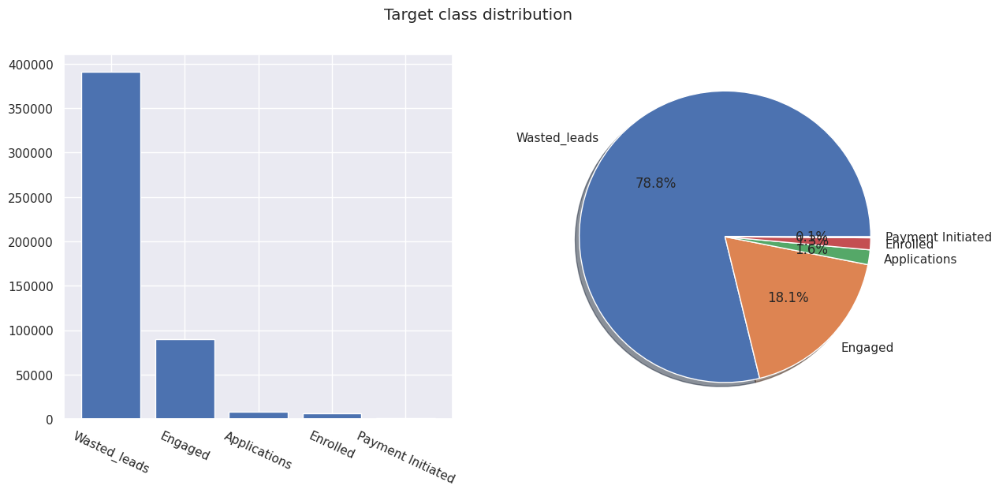

In [ ]:
'''
Lets Understand the target class distribution
Plot target variable distribution
'''

# Create figure object
plt.figure(figsize=(14, 6))

# Create bar plot
plt.subplot(1, 2, 1)
plt.bar(df['funnel_category'].value_counts().index, df['funnel_category'].value_counts().values)
plt.xticks(rotation = 335)

# Create pie plot
plt.subplot(1, 2, 2)
plt.pie(
    x = df['funnel_category'].value_counts(),
    labels=df['funnel_category'].value_counts().index,
    autopct='%1.1f%%',
    shadow=True)

# Add title and display plot
plt.suptitle(f'Target class distribution' , fontdict={'size': 10})
plt.savefig('Target class distribution.jpg')
plt.show;

Firstly, there are 5 classes in the target variable. We will use this to check for missing values across features.
The purpose of this exercise is to identify if the distribution of Null values is correlated with the classes of the target variable.


As per the latest inputs received, the model end-user will be the sales leads. So we can ignore the source and subsource columns, which are related to marketing channel inputs.

Additionally, the keystone metrics for sales team would be how many engaged leads convert to applications and paying customers. Accordingly, I shall re-encode my target variable as below. EDA would also be driven by this decision.

In [ ]:
# Define the target and secondary target variables
target = 'funnel_category'
subtarget = 'stagename'

**Choose different class bucketing to develop models for different end users**

In [ ]:
# Sales team uses successful conversion from engaged to applications as the keystone metric
target_replace_dict = {'Wasted_leads':'0', 'Engaged':'1','Payment Initiated':'2', 'Applications':'2', 'Enrolled':'2' }
df['target_sales'] = df[target].replace(target_replace_dict)
target_labels = list(target_replace_dict.keys())
target_labels

['Wasted_leads', 'Engaged', 'Payment Initiated', 'Applications', 'Enrolled']

In [ ]:
# Operations uses bottomline as the keystone metric
target_replace_dict_2 = {'Wasted_leads':'0', 'Engaged':'1', 'Applications':'2','Payment Initiated':'3', 'Enrolled':'3' }
df['target_operations'] = df[target].replace(target_replace_dict_2)

In [ ]:
# Marketing Team, uses number of customers engaged per marketing strategy as a metric
target_replace_dict_3 = {'Wasted_leads':'0', 'Engaged':'1', 'Applications':'1','Payment Initiated':'1', 'Enrolled':'1' }
df['target_marketing'] = df[target].replace(target_replace_dict_3)

In [ ]:
df[temporal_features].describe()

,opportunity_created_date,laststagechangedate,sales_end_,sales_start_date,lastactivitydate,program_start_date_c,program_end_date_c
count,495953,495065,495953,495953,495880,467590,467590
unique,284578,217750,100,102,679,88,58
top,2021-09-26 14:36:00,2022-06-27 06:55:00,2022-10-01 00:00:00,2022-05-02 00:00:00,2022-06-29 00:00:00,2022-07-09 00:00:00,2022-12-31 00:00:00
freq,249,117,25747,27094,12682,19294,65437
first,2020-05-13 15:01:00,2020-05-16 10:33:00,2019-12-31 00:00:00,2019-01-01 00:00:00,2020-06-10 00:00:00,2020-01-08 00:00:00,2021-01-07 00:00:00
last,2022-06-29 17:54:00,2022-06-29 23:45:00,2022-10-01 00:00:00,2022-05-30 00:00:00,2023-03-15 00:00:00,2022-09-24 00:00:00,2024-04-30 00:00:00


In [ ]:
# Check for duplicate rows
df.duplicated().sum()

0

## 2.1. Missing Values and Duplicates


In [ ]:
# Check for missing values
df.isna().sum()[df.isna().sum()>0]

subsource                      1162
unserviced_age                   71
source                          333
time_taken_for_allocation      3721
calldurationinseconds        146206
days_to_apply                487857
days_to_engage               406171
days_to_enroll               489391
days_to_payment              495375
days_to_waste                105018
city                             24
laststagechangedate             888
lastactivitydate                 73
program_start_date_c          28363
program_end_date_c            28363
workes_reqd_by_min_workex      1379
workex_minworkexp_by_reqd      1379
dtype: int64

There is a heavy class imbalance. In order to make it more balanced, I have chosen to drop all rows for class 0 (majority class) where missing values exist.

There are 5 features whose values are mutually exclusive, and are dependent on the value of the funnel category. The numeric values are a simple difference between two features, as observed in the raw data file. We will be replacing these five features with a single feature, in the subsequent cells.

In [ ]:
exc = ['days_to_apply', 'days_to_engage', 'days_to_enroll', 'days_to_payment', 'days_to_waste']
df1 = df[df['funnel_category']=='Wasted_leads']
df2 = df[df['funnel_category']!='Wasted_leads']

incl = [col for col in df1.columns if col not in exc]

# Drop missing values in majority class
for col in incl:
    #df1.loc[:, col].dropna(inplace=True)
    df1 = df1.dropna(subset=[col])

In [ ]:
df1.shape, df1.isna().sum().sum()

((263472, 71), 1053888)

In [ ]:
df = pd.concat((df1, df2), axis = 0)
df.shape

del(df1)
del(df2)

In [ ]:
df['target_sales'].value_counts()/df.shape[0]*100

0   71.500
1   24.365
2    4.135
Name: target_sales, dtype: float64

In [ ]:
# Based on the median values (decision based on the df.describe() results)
df['calldurationinseconds'] = df['calldurationinseconds'].fillna(df['calldurationinseconds'].median())
df['unserviced_age'] = df['unserviced_age'].fillna(df['unserviced_age'].median())

'''
There is a value with -3023 in the 'time_taken_for_allocation' feature.
Deep neural networks are robust to random outliers, but other algorithms might not be. Will be dropping this row.
'''
display(df[df['time_taken_for_allocation']<0]['time_taken_for_allocation'])
df['time_taken_for_allocation'] = df['time_taken_for_allocation'].fillna(df['time_taken_for_allocation'].median())
idx = df[df['time_taken_for_allocation']<0].index
df = df.drop(idx,axis = 0)


392619   -3023.000
Name: time_taken_for_allocation, dtype: float64

Based on researching the dataset randomly, it can be understood that `program_number`
indicates the unique batch or cohort-identifier, while `program_code_renewed` is the
commercially marketed program name.

As such, we can use the cohort-identifier, i.e. the `program_number` feature
to impute missing values in `program_start_date_c` and `program_end_date_c`.

In [ ]:
'''
Based on researching the dataset randomly, it can be understood that 'program_number'
indicates the unique batch or cohort-identifier, while 'program_code_renewed' is the
commercially marketed program name.

As such, we can use the cohort-identifier, i.e. the 'program_number' feature
to impute missing values in 'program_start_date_c' and 'program_end_date_c'.
'''
display(df['program_number'].nunique(), df['program_code_renewed'].nunique())

# Confirming that program_number corresponds to cohort-identifier
display(df[['program_number',  'program_start_date_c', 'program_end_date_c']].drop_duplicates().shape)

# Check if the index of missing values in both features match
display(df[df['program_start_date_c'].isna()].index.tolist() == df[df['program_end_date_c'].isna()].index.tolist())

144

110

(144, 3)

True

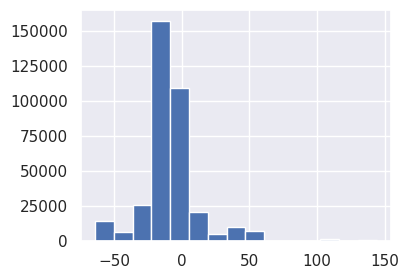

In [ ]:
# Lets check the distribution of time difference between sales end day and program start day
plt.figure(figsize=(4,3))
(df['sales_end_']-df['program_start_date_c']).dt.days.hist(bins=15);

In [ ]:
'''
Define a cohort_df which stores the information about the programs.
We will use this to conduct analysis and impute missing values
for program duration, isead of program start and end dates.
'''

cohort_features = ['business_vertical', 'program_code_renewed','category',\
                'institute', 'program_number', 'program_start_date_c', \
                 'program_end_date_c', 'is_session_working_day', \
                 'sessions_in_week', 'business_vertical', 'institute', \
                'total_program_fee', 'budget', 'competitor_program_feehigh',\
                'competitor_program_feelow','is_session_working_day',\
                'workex_reqd']

cohort_df = df[cohort_features].drop_duplicates().reset_index(drop = True)

cohort_df['index'] = cohort_df['program_number']
cohort_df = cohort_df.set_index('index')

In [ ]:
display(cohort_df.shape, cohort_df.head())
program_features = cohort_df.columns.tolist()

(144, 17)

,business_vertical,program_code_renewed,category,institute,program_number,program_start_date_c,program_end_date_c,is_session_working_day,sessions_in_week,business_vertical,institute,total_program_fee,budget,competitor_program_feehigh,competitor_program_feelow,is_session_working_day,workex_reqd
index,,,,,,,,,,,,,,,,,
P-00282,LDP,IITD-EMPSM,Strategic Management,IIT Delhi,P-00282,2022-08-07,2023-08-06,0,1,LDP,IIT Delhi,195000,1972000,292500.000,130000.000,0,5
P-00263,LDP,IIMKashipur-EPSL,Leadership & Strategy,IIM Kashipur,P-00263,2022-08-27,2023-07-31,0,1,LDP,IIM Kashipur,225000,2160000,337500.000,150000.000,0,5
P-00236,LDP,IIMN-CSM,Strategic Management,IIM Nagpur,P-00236,2022-07-16,2023-06-30,0,1,LDP,IIM Nagpur,200000,2217000,300000.000,133333.333,0,3
P-00235,MDP,IIMC-SURGE,Entrepreneurship,IIM Kolkata,P-00235,2022-06-05,2023-03-30,0,1,MDP,IIM Kolkata,304440,1457000,456660.000,202960.000,0,1
P-00208,MDP,IIMKashipur-ECPPM,Project Management,IIM Kashipur,P-00208,2022-05-22,2022-10-22,0,1,MDP,IIM Kashipur,75000,1802000,112500.000,50000.000,0,2


In [ ]:
cohort_df.isna().sum()

business_vertical              0
program_code_renewed           0
category                       0
institute                      0
program_number                 0
program_start_date_c          14
program_end_date_c            14
is_session_working_day         0
sessions_in_week               0
business_vertical              0
institute                      0
total_program_fee              0
budget                         0
competitor_program_feehigh     0
competitor_program_feelow      0
is_session_working_day         0
workex_reqd                    0
dtype: int64

14 cohorts have missing program start and end dates.

In [ ]:
df.funnel_category.value_counts()/df.shape[0]*100

Wasted_leads        71.501
Engaged             24.365
Applications         2.197
Enrolled             1.781
Payment Initiated    0.157
Name: funnel_category, dtype: float64

In [ ]:
# Get the most frequent lead times to program start date and to sale end date
# We will use funnel categories including only Applications and Enrolled, for imputing the
# program start date, as they are more reliable datapoints for guessing when the program might start

df_subset = df[(df['funnel_category']=='Applications') | (df['funnel_category']=='Enrolled')]

sale2program_start = (df_subset['program_start_date_c'] - df_subset['sales_end_']).dt.days.mode()[0]
oppty2program_start = (df_subset['program_start_date_c'] - df_subset['opportunity_created_date']).dt.days.mode()[0]


print('Most applicants purchase the course {} day before the program starts.'.format(int(sale2program_start)))
print('Most applicants generate leads {} days before the program starts.'.format(int(oppty2program_start)))

'''
Let's extract the modes of the features. We will use it for imputing missing values.
'''
sales_modes = df.groupby('program_number')['sales_end_'].apply(lambda x: x.mode().iloc[0])

del(df_subset)

Most applicants purchase the course 1 day before the program starts.
Most applicants generate leads 30 days before the program starts.


- Strategy for imputing program start date and program end date for 15 program codes. Program codes
are unique identifiers for cohorts (batches) for each program.
> 1. Get the program start year from the most frequent sales end year.
> 2. Get the program start month from the most frequent sales end month for the program.
> 3. Use the day 1 of each month and concat all for the date.
> 4. Impute the program duration in dys from other cohorts of the same program.
> 5. Add the days timedelta to impute program end date.

In [ ]:
def program_start_imputer(row):
    '''
    Docstring:
    Method for imputing program start date for 15 program codes.
    Program codes are unique identifiers for cohorts (batches) for each program.

    1. Get the most frequent lead time (mode) in days from sales_end to program start date from sales_modes series.
    2. Adds the timedelta from (1) to sales end date.

    Returns:
    Program start date
    '''
    program_num  = row['program_number'] # Accesses the program number from the target dataframe
    sales_end_dt = sales_modes.loc[program_num] # Accesses the series value corresponding to the program number

    if pd.isna(row['program_start_date_c']):
        return sales_end_dt + pd.Timedelta(days = sale2program_start) # Returns the sum of timedelta and sales_end date
    return row['program_start_date_c']

cohort_df['program_start_date_c'] = cohort_df.apply(lambda row: program_start_imputer(row), axis=1)

# Compute course duration
cohort_df['course_duration'] = (cohort_df['program_end_date_c'] - cohort_df['program_start_date_c']).dt.days

In [ ]:
# Code to extract and store program-wise course durations.
programs = {}
c = 0
for program_code_renewed in cohort_df['program_code_renewed'].unique().tolist():

    # Extracts index of programs with a non-null course duration value
    index = ((cohort_df['program_code_renewed'] == program_code_renewed) & (~cohort_df['course_duration'].isnull()))

    # idxmax() extracts the index (largest index) which points to the most recent cohort
    result_idx = index.idxmax()

    # Locates and stores the non-null value of course duration from the cohort_df
    programs[program_code_renewed] = cohort_df.loc[result_idx, 'course_duration']
    c+=1

# Maps programs to their most recent cohort's course durations
course_duration_map = pd.DataFrame(programs, index = ['course_duration']).T

# Custom function to impute missing course duration values.
def course_duration_imputer(row):
    '''
    Docstring:
    Method for imputing program end date for 15 program codes.
    Program codes are unique identifiers for cohorts (batches) for each program.

    1. Get the most frequent lead time (mode) in days from sales_end to program start date from sales_modes series.
    2. Adds the timedelta from (1) to sales end date.

    Returns:
    Program start date
    '''

    program = row['program_code_renewed']
    duration = course_duration_map.loc[program, 'course_duration']

    # Conition checks if the course duration is a
    # null value and returns a value if True.
    if pd.isna(row['course_duration']):
        return duration
    return row['course_duration']

cohort_df['course_duration'] = cohort_df.apply(lambda row: course_duration_imputer(row), axis=1)

Let's do a little sanity check.

In [ ]:
cohort_df.isna().sum()

business_vertical              0
program_code_renewed           0
category                       0
institute                      0
program_number                 0
program_start_date_c           0
program_end_date_c            14
is_session_working_day         0
sessions_in_week               0
business_vertical              0
institute                      0
total_program_fee              0
budget                         0
competitor_program_feehigh     0
competitor_program_feelow      0
is_session_working_day         0
workex_reqd                    0
course_duration                0
dtype: int64

In [ ]:
def program_end_imputer(row):
    '''
    Docstring:
    Method for imputing course duration based on the most recent program cohort.

    1. Uses the 'course_duration_map' dictionary which stores the course duration
    of the most recent cohort with non-null program start dates.
    2. Adds the course_duration as a timedelta in days to program start date.

    Returns: 'program_end_date_c' as the imputed value.

    '''

    program = row['program_code_renewed']
    duration = course_duration_map.loc[program, 'course_duration']

    # Conition checks if the course duration is a
    # null value and returns a value if True.
    if pd.isna(row['program_end_date_c']):
        return row['program_start_date_c'] + pd.Timedelta(days = duration)
    return row['program_end_date_c']
cohort_df['program_end_date_c'] = cohort_df.apply(lambda row: program_end_imputer(row), axis=1)

In [ ]:
categorical_features = df.drop('opportunity_id',axis=1).select_dtypes(include = 'O').columns.tolist()

numeric_features = df.select_dtypes(include = ['int', 'float', 'bool'], exclude = 'O').columns.tolist()

temporal_features = df.select_dtypes(include = ['datetime'], exclude = 'O').columns.tolist()

display(temporal_features)

display(categorical_features)

display(numeric_features)

['opportunity_created_date',
 'laststagechangedate',
 'sales_end_',
 'sales_start_date',
 'lastactivitydate',
 'program_start_date_c',
 'program_end_date_c']

['stagename',
 'subsource',
 'source',
 'funnel_category',
 'city',
 'city_type',
 'workexp',
 'program_number',
 'program_code_renewed',
 'category',
 'business_vertical',
 'institute',
 'opp_month_name',
 'opp_day_name',
 'age',
 'time_of_lead',
 'session_start_day_inweek',
 'workes_reqd_by_min_workex',
 'workex_minworkexp_by_reqd',
 'workex_max_by_reqd',
 'target_sales',
 'target_operations',
 'target_marketing']

['unanswered_call_counter',
 'unserviced_age',
 'ageing',
 'time_taken_for_allocation',
 'no_of_calls',
 'calldurationinseconds',
 'days_to_apply',
 'days_to_engage',
 'days_to_enroll',
 'days_to_payment',
 'days_to_waste',
 'workexp_min',
 'workexp_max',
 'is_serviced_c',
 'total_program_fee',
 'budget',
 'cal_diff',
 'call2_diff',
 'call3_diff',
 'call4_diff',
 'opp_year',
 'opp_month',
 'opp_week_of_year',
 'opp_week_of_month',
 'opp_day_of_year',
 'opp_day_of_week',
 'agemin',
 'agemax',
 'competitor_program_feehigh',
 'competitor_program_feelow',
 'sales_working_day',
 'opp_hour',
 'iscreatedinworking_hour',
 'workex_reqd',
 'is_session_working_day',
 'weekly_sessionsdays_count',
 'sessions_in_week',
 'workex_reqd_by_workexpmax',
 'workex_reqd_by_agemax',
 'workex_reqd_by_agemin']

In [ ]:
cohort_df.isna().sum()

business_vertical             0
program_code_renewed          0
category                      0
institute                     0
program_number                0
program_start_date_c          0
program_end_date_c            0
is_session_working_day        0
sessions_in_week              0
business_vertical             0
institute                     0
total_program_fee             0
budget                        0
competitor_program_feehigh    0
competitor_program_feelow     0
is_session_working_day        0
workex_reqd                   0
course_duration               0
dtype: int64

This has worked reasonably well for imputing missing program start and end dates in the cohort_df. Let's replicate this for the entire dataset.

In [ ]:
# Impute missing program start dates
df['program_start_date_c'] = df.apply(lambda row: program_start_imputer(row), axis=1)

# Compute course duration. Impute missing values.
df['course_duration'] = (df['program_end_date_c'] - df['program_start_date_c']).dt.days
df['course_duration'] = df.apply(lambda row: course_duration_imputer(row), axis=1)

# Impute missing values in program end date
df['program_end_date_c'] = df.apply(lambda row: program_end_imputer(row), axis=1)

df[cohort_features].isna().sum()

business_vertical             0
program_code_renewed          0
category                      0
institute                     0
program_number                0
program_start_date_c          0
program_end_date_c            0
is_session_working_day        0
sessions_in_week              0
business_vertical             0
institute                     0
total_program_fee             0
budget                        0
competitor_program_feehigh    0
competitor_program_feelow     0
is_session_working_day        0
workex_reqd                   0
dtype: int64

In [ ]:
df['program_start_date_c'].dt.month.value_counts()

7     62607
8     57609
1     56301
6     41080
12    29745
5     27559
2     25586
3     20061
4     17409
10    14569
9      9245
11     6718
Name: program_start_date_c, dtype: int64

In [ ]:
# Create additional features from the cohort features

df['opp_dt_to_sale_end_dt'] = (df['sales_end_'] - df['opportunity_created_date']).dt.days
df['opp_dt_to_program_start_dt'] = (df['program_start_date_c'] - df['opportunity_created_date']).dt.days
df['program_start_dt_to_sales_end_dt'] = (df['program_start_date_c']-df['sales_end_']).dt.days

df['course_duration_in_wks'] = df['course_duration']/7
df['total_sessions'] = df['course_duration_in_wks']*df['sessions_in_week']


df['program_start_month'] = df['program_start_date_c'].dt.month
df['program_start_weekofyear'] = df['program_start_date_c'].dt.week
df['program_start_quarter'] = df['program_start_date_c'].dt.quarter
df['program_start_dayofweek'] = df['program_start_date_c'].dt.dayofweek
df['program_start_weekofmonth'] = (df['program_start_date_c'].dt.day-1) // 7 +1


df['program_end_month'] = df['program_end_date_c'].dt.month
df['program_end_weekofyear'] = df['program_end_date_c'].dt.week
df['program_end_quarter'] = df['program_end_date_c'].dt.quarter
df['program_end_dayofweek'] = df['program_end_date_c'].dt.dayofweek
df['program_end_weekofmonth'] = (df['program_end_date_c'].dt.day-1) // 7 +1


In [ ]:
# Number of leads generated *ON* the program start date
len(df[(df['opp_dt_to_program_start_dt'] ==0)].index.tolist())

434

In [ ]:
 df['opp_dt_to_program_start_dt'] = df.loc[:,'opp_dt_to_program_start_dt'].apply(lambda days: 1 if days == 0 else days)

In [ ]:
df['opp2salesend_by_opp2progstart'] = df['opp_dt_to_sale_end_dt']/df['opp_dt_to_program_start_dt']

In [ ]:
# Clear unnecessary objects from memory
del(course_duration_map)
del(programs)
del(cohort_df)

Let's create new features, based on the preliminary understanding of the raw data file provided.

In [ ]:
# We will use the classes in the target variable as facets for analysis and further preprocessing.

facets = df.target_sales.unique().tolist()
facets.sort()
facets

['0', '1', '2']

**Create a single feature to replace the features below.**
> ['days_to_apply',
    'days_to_engage',
    'days_to_enroll',
    'days_to_payment',
    'days_to_waste']

In [ ]:
# Get the median ageing to clear each stage
median_ageing = df.groupby('target_sales').median()['ageing']
median_ageing = median_ageing.astype('int')
display(median_ageing)

target_sales
0     1
1     1
2    31
Name: ageing, dtype: int64

In [ ]:
# Get the index of missing vals
idxs =  df[df['laststagechangedate'].isna()].index.tolist()

for idx in idxs:
    facet = df.loc[idx , 'target_sales']

    # Convert median aging per facet to a timedelta type in days
    days = pd.Timedelta(days = median_ageing[facet])
    #
    df.loc[idx, 'laststagechangedate'] = df.loc[idx, 'opportunity_created_date'] + days

# Finally, create the new feature to replace the 5 features mentioned above
df['days_to_stage'] = df['laststagechangedate'] - df['opportunity_created_date']
df['days_to_stage'] = df['days_to_stage'].dt.days

In [ ]:
days_to_stage_list = ['days_to_apply',
                      'days_to_engage',
                      'days_to_enroll',
                      'days_to_payment',
                      'days_to_waste']
df = df.drop(days_to_stage_list, axis = 1)

In [ ]:
# Get the index of missing vals
idxs =  df[df['lastactivitydate'].isna()].index.tolist()

for idx in idxs:
    # Last activity date would be equal to last stage change date
    df.loc[idx, 'lastactivitydate'] = df.loc[idx, 'laststagechangedate']

**Let's impute nominal features**

In [ ]:
nominal_features = ['source', 'subsource', 'city', 'stagename','program_code_renewed',\
    'category','business_vertical','institute']
df[nominal_features].isna().sum()

source                   24
subsource               103
city                      9
stagename                 0
program_code_renewed      0
category                  0
business_vertical         0
institute                 0
dtype: int64

In [ ]:
'''
Let's extract the modes of the features. We will use it for imputing missing values.
'''
modes_df = df.groupby('stagename').apply(lambda x: x.mode().iloc[0])
modes_df

,opportunity_id,stagename,subsource,unanswered_call_counter,unserviced_age,ageing,source,opportunity_created_date,time_taken_for_allocation,no_of_calls,calldurationinseconds,funnel_category,city,city_type,workexp,workexp_min,workexp_max,laststagechangedate,is_serviced_c,sales_end_,sales_start_date,program_number,program_code_renewed,total_program_fee,category,business_vertical,budget,lastactivitydate,institute,cal_diff,call2_diff,call3_diff,call4_diff,opp_year,opp_month,opp_month_name,opp_week_of_year,opp_week_of_month,opp_day_of_year,opp_day_of_week,opp_day_name,age,agemin,agemax,competitor_program_feehigh,competitor_program_feelow,program_start_date_c,program_end_date_c,sales_working_day,time_of_lead,opp_hour,iscreatedinworking_hour,workex_reqd,is_session_working_day,session_start_day_inweek,weekly_sessionsdays_count,sessions_in_week,workes_reqd_by_min_workex,workex_reqd_by_workexpmax,workex_minworkexp_by_reqd,workex_max_by_reqd,workex_reqd_by_agemax,workex_reqd_by_agemin,target_sales,target_operations,target_marketing,course_duration,opp_dt_to_sale_end_dt,opp_dt_to_program_start_dt,program_start_dt_to_sales_end_dt,course_duration_in_wks,total_sessions,program_start_month,program_start_weekofyear,program_start_quarter,program_start_dayofweek,program_start_weekofmonth,program_end_month,program_end_weekofyear,program_end_quarter,program_end_dayofweek,program_end_weekofmonth,opp2salesend_by_opp2progstart,days_to_stage
stagename,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Attempt To contact,0060o00001R0COlAAN,Attempt To contact,facebook,1.000,0.000,1.000,facebook,2022-06-20 09:26:00,0.000,1.000,0.000,Engaged,Delhi NCR,Tier-1,1-5 years,1.000,5.000,2022-06-27 06:03:00,False,2022-10-01,2022-05-02,P-00289,IIMK-EPGP,100000.000,General Management,MDP,8687000.000,2022-06-29,IIM Kozhikode,0.000,0.000,0.000,0.000,2022.000,6.000,June,26.000,4.000,176.000,1.000,Tuesday,22-27 years,22.000,27.000,150000.000,66666.667,2022-10-02,2022-12-31,1.000,14:30:07,5.000,0.000,2.000,0.000,Saturday,1.000,1.000,2,0.200,0.5,5,0.074,0.091,1,1,1,364.000,9.000,23.000,1.000,52.000,104.000,8.000,34.000,3.000,6.000,4.000,12.000,39.000,4.000,6.000,5.000,0.500,0.000
Call back,0060o00001YmbNUAAZ,Call back,database,0.000,0.000,101.000,Database,2021-09-29 05:55:00,0.000,1.000,117.000,Engaged,Chennai,Tier-1,1-5 years,1.000,5.000,2021-10-13 04:59:00,False,2021-11-25,2021-07-25,P-00140,IIMC-APMP,200000.000,Leadership & Strategy,LDP,1568000.000,2021-10-22,IIM Kashipur,0.000,0.000,0.000,0.000,2021.000,9.000,October,40.000,2.000,272.000,1.000,Tuesday,22-27 years,22.000,27.000,300000.000,133333.333,2021-12-04,2022-11-30,1.000,05:55:19,5.000,0.000,5.000,0.000,Saturday,1.000,1.000,5,1.000,0.2,1,0.185,0.227,1,1,1,346.000,50.000,59.000,5.000,49.429,49.429,12.000,48.000,4.000,5.000,1.000,11.000,48.000,4.000,2.000,5.000,0.847,13.000
Cold,0060o00001R5lBjAAJ,Cold,facebook,0.000,0.000,1.000,facebook,2021-11-07 07:58:00,0.000,2.000,1.000,Wasted_leads,Delhi NCR,Tier-1,1-5 years,1.000,5.000,2022-04-08 10:27:00,True,2022-06-25,2022-03-25,P-00251,IITRK-PGCPDSML,100000.000,Leadership & Strategy,MDP,2212000.000,2022-05-06,IIM Indore,0.000,0.000,0.000,0.000,2022.000,5.000,May,17.000,2.000,110.000,1.000,Tuesday,22-27 years,22.000,27.000,150000.000,66666.667,2022-07-09,2022-12-31,1.000,14:30:07,7.000,0.000,2.000,0.000,Saturday,1.000,1.000,2,0.200,0.5,5,0.074,0.091,0,0,0,349.000,53.000,59.000,14.000,49.857,48.000,7.000,27.000,3.000,5.000,4.000,12.000,52.000,4.000,5.000,5.000,1.000,0.000
Contacted,0060o00001R00qsAAB,Contacted,facebook,0.000,0.000,1.000,facebook,2022-06-20 09:25:00,0.000,2.000,29.000,Engaged,Delhi NCR,Tier-1,1-5 years,1.000,5.000,2022-06-28 15:55:00,True,2022-10-01,2022-05-02,P-00289,IIMK-EPGP,1652000.000,General Management,MDP,8687000.000,2022-06-29,IIM Kozhikode,0.000,0.000,0.000,0.000,2022.000,6.000,June,26.000,4.000,173.000,1.000,Tuesday,22-27 years,22.000,27.000,2478000.000,1101333.333,2022-10-02,2022-12-31,1.000,14:30:16,17.000,1.000

In [ ]:
'''
Impute missing values for nominal features with modes.
'''
c = 0 # Values getting imputed counter
for feature in nominal_features:
    for stage in df['stagename'].unique():
        df.loc[(df['stagename'] == stage) & (df[feature].isna()), feature] = modes_df.loc[stage,feature]
        c+=1


In [ ]:
df.isna().sum()

opportunity_id                        0
stagename                             0
subsource                             0
unanswered_call_counter               0
unserviced_age                        0
ageing                                0
source                                0
opportunity_created_date              0
time_taken_for_allocation             0
no_of_calls                           0
calldurationinseconds                 0
funnel_category                       0
city                                  0
city_type                             0
workexp                               0
workexp_min                           0
workexp_max                           0
laststagechangedate                   0
is_serviced_c                         0
sales_end_                            0
sales_start_date                      0
program_number                        0
program_code_renewed                  0
total_program_fee                     0
category                              0


In [ ]:
del(modes_df)

Let's create new features that can replace some non-intuitive ratios present in the dataset.

In [ ]:
df['workex_minworkexp_by_reqd'] = df['workex_minworkexp_by_reqd'].fillna(0)

In [ ]:
df['workexp_average'] = (df['workexp_max']+ df['workexp_min'])/2
df['workexp_reqd_by_avg_workexp'] = df['workex_reqd']/df['workexp_average']

df['avg_lead_age'] = (df['agemax'] + df['agemin'])/2

df['workex_reqd_by_agemin'] = df['workex_reqd'] / df['agemin']
df['workex_reqd_by_agemax'] = df['workex_reqd'] / df['agemax']

In [ ]:
#df = df.drop(['workes_reqd_by_min_workex', 'agemin', 'agemax', 'workexp_min', 'workexp_max'], axis =1)
#df.drop('weekly_sessionsdays_count', axis =1 , inplace = True)
#df.drop('opp_year', axis =1, inplace = True)

In [ ]:
df.isna().sum()[df.isna().sum()>0]

workes_reqd_by_min_workex    413
dtype: int64

All missing values of the relevant features have been handled, and new features have been engineered.
Lets perform some data transformations.

Under the suggestion of the Seventh Central Pay Commission, all the cities of India are classified into 3 categories. This classification is mainly used by the government of India to pay House Rent Allowance (HRA) to their employees.Now X, Y and Z are known as Tier 1, Tier 2 and Tier 3 cities respectively. There are eight X cities and 97 Y cities in India.

- X Cities: In this class, all the cities are A1 cities, generally known as Tier 1 cities. These cities are the best for live and work in India. The salary the government is giving is divided into various categories. One of them is House Rent Allowance. In X category of cities the HRA is 24% of the basic pay.

- Y Cities: In this class, all the cities are A, B1 and B2 cities, generally known as Tier 2 cities. If the HRA of the people's serving in Government organization is 16% of their basic pay the city falls under Y category

- Z Cities: In this class, all the C and unclassified cities are in this generally known as Tier 3 and Tier 4.In case the HRA is 8% of the basic pay the city is called as Z Category city.

In the present context, this `city_type` feature could represent the lead's financial liquidity, earning potential, employment status, work experience, affluence and many other socio-economic indicators which might influence the decision to purchase a course.

In [ ]:
display(df.city_type.unique())

city_type_dict = {
    'Tier-1':1, 'Tier-2': 2/3, 'Tier-3': 1/3
    }
city_type_dict

df['city_type_num'] = df['city_type'].apply(lambda row: city_type_dict.get(row))

array(['Tier-3', 'Tier-2', 'Tier-1'], dtype=object)

In [ ]:
'''
There are features which have the infinity as a ratio.
We will choose the upper limit of 9999 and convert them to float dtype
'''
cols = ['workex_minworkexp_by_reqd', 'workex_max_by_reqd']
df[cols] = df[cols].replace('∞', 99).astype('float')

In [ ]:
day_replacedict = {'Monday':0, 'Tuesday':1, 'Wednesday':2, 'Thursday':3, 'Friday':4, 'Saturday':5, 'Sunday':6}

df['session_start_day_inweek_num']  = df['session_start_day_inweek'].replace(day_replacedict)

In [ ]:
df['session_start_day_inweek_num'].value_counts(), df['session_start_day_inweek'].value_counts()

(5    212301
 6    121030
 3     18382
 2      7527
 4      6146
 1      3103
 Name: session_start_day_inweek_num, dtype: int64,
 Saturday     212301
 Sunday       121030
 Thursday      18382
 Wednesday      7527
 Friday         6146
 Tuesday        3103
 Name: session_start_day_inweek, dtype: int64)

In [ ]:
# program_number feature is an internal assignment and has no effect on the propensity to buy
#df = df.drop(['program_number', 'time_of_lead'], axis = 1)
#df = df.drop(['workes_reqd_by_min_workex', 'agemin', 'agemax', 'workexp_min', 'workexp_max'], axis =1)
#df.drop('weekly_sessionsdays_count', axis =1 , inplace = True)
#df.drop('opp_year', axis =1, inplace = True)

In [ ]:
# Lets redefine our feature groups
categorical_features = df.drop([target, subtarget, 'target_sales', 'target_operations', 'target_marketing'], axis = 1).select_dtypes('O').columns.tolist()
temporal_features = df.select_dtypes('datetime').columns.tolist()
numeric_features = df.select_dtypes(exclude = ['O', 'datetime']).columns.tolist()

In [ ]:
display(df.shape,
   len(categorical_features),
   len(temporal_features),
   len(numeric_features),
   len([target, subtarget, 'target_sales', 'target_operations', 'target_marketing']))

(368489, 89)

17

7

60

5

In [ ]:
df[numeric_features].select_dtypes('bool').columns

Index(['is_serviced_c'], dtype='object')

In [ ]:
df['is_serviced_c'] = df['is_serviced_c'].astype('int')

In [ ]:
# Lets further divide the categorical features into nominal and cardinal features.

nominal_features = ['subsource', 'source', 'city','program_code_renewed',
                    'category', 'business_vertical', 'institute']

freq_encode_features = ['subsource', 'source', 'city']
one_hot_features = ['program_code_renewed', 'category', 'business_vertical', 'institute']

cardinal_features = ['city_type','workexp','opp_month_name','opp_day_name',
                     'age', 'session_start_day_inweek']
numeric_exists = ['city_type', 'workexp','opp_month_name', 'opp_day_name',
                  'age', 'session_start_day_inweek']

# Data Accuracy Checks
Since features have been engineered, transformed and preprocessed, lets perform a final accuracy check on the data.

In [ ]:
df.describe()

,unanswered_call_counter,unserviced_age,ageing,time_taken_for_allocation,no_of_calls,calldurationinseconds,workexp_min,workexp_max,is_serviced_c,total_program_fee,budget,cal_diff,call2_diff,call3_diff,call4_diff,opp_year,opp_month,opp_week_of_year,opp_week_of_month,opp_day_of_year,opp_day_of_week,agemin,agemax,competitor_program_feehigh,competitor_program_feelow,sales_working_day,opp_hour,iscreatedinworking_hour,workex_reqd,is_session_working_day,weekly_sessionsdays_count,sessions_in_week,workex_reqd_by_workexpmax,workex_minworkexp_by_reqd,workex_max_by_reqd,workex_reqd_by_agemax,workex_reqd_by_agemin,course_duration,opp_dt_to_sale_end_dt,opp_dt_to_program_start_dt,program_start_dt_to_sales_end_dt,course_duration_in_wks,total_sessions,program_start_month,program_start_weekofyear,program_start_quarter,program_start_dayofweek,program_start_weekofmonth,program_end_month,program_end_weekofyear,program_end_quarter,program_end_dayofweek,program_end_weekofmonth,opp2salesend_by_opp2progstart,days_to_stage,workexp_average,workexp_reqd_by_avg_workexp,avg_lead_age,city_type_num,session_start_day_inweek_num
count,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000
mean,1.133,246.881,32.550,454.210,7.212,139.238,5.412,9.718,0.825,305250.176,2119024.917,4.249,0.021,0.020,0.021,2021.680,5.981,24.909,3.169,166.551,2.856,28.119,33.043,457875.264,203500.117,0.748,10.210,0.495,3.481,0.095,1.204,1.204,0.683,9.466,11.143,0.107,0.126,305.563,49.168,57.302,8.134,43.652,51.926,5.917,23.815,2.352,5.278,2.920,7.133,30.548,2.694,3.371,4.427,0.874,14.124,7.565,1.183,30.581,0.804,5.117
std,2.144,1090.378,70.063,13813.321,6.329,314.434,5.185,5.904,0.380,307158.898,1400007.068,19.981,0.472,0.646,0.967,0.496,3.366,14.685,1.332,103.178,1.967,6.960,7.421,460738.346,204772.598,0.434,5.330,0.500,2.790,0.294,0.403,0.403,1.353,26.036,25.826,0.086,0.100,90.664,32.912,35.983,20.343,12.952,24.259,3.270,13.933,1.029,0.971,1.224,3.642,15.665,1.116,2.089,1.143,2.210,23.950,5.529,2.719,7.178,0.276,0.922
min,0.000,0.000,0.000,0.000,1.000,0.000,0.000,1.000,0.000,70800.000,161000.000,0.000,0.000,0.000,0.000,2020.000,1.000,1.000,1.000,1.000,0.000,21.000,23.000,106200.000,47200.000,0.000,0.000,0.000,0.000,0.000,1.000,1.000,0.000,0.000,0.100,0.000,0.000,119.000,-911.000,-910.000,-144.000,17.000,17.000,1.000,1.000,1.000,0.000,1.000,1.000,1.000,1.000,0.000,1.000,-74.000,0.000,0.500,0.000,22.000,0.333,1.000
25%,0.000,0.000,1.000,0.000,3.000,1.000,1.000,5.000,1.000,150000.000,1585000.000,0.000,0.000,0.000,0.000,2021.000,4.000,15.000,2.000,96.000,1.000,22.000,27.000,225000.000,100000.000,0.000,6.000,0.000,2.000,0.000,1.000,1.000,0.200,0.500,1.667,0.061,0.071,237.000,27.000,33.000,1.000,33.857,44.143,3.000,12.000,1.000,5.000,2.000,4.000,18.000,2.000,1.000,4.000,0.682,0.000,3.000,0.240,24.500,0.667,5.000
50%,0.000,0.000,1.000,0.000,6.000,29.000,5.000,10.000,1.000,212500.000,1837000.000,0.000,0.000,0.000,0.000,2022.000,5.000,22.000,3.000,143.000,3.000,28.000,33.000,318750.000,141666.667,1.000,10.000,0.000,2.000,0.000,1.000,1.000,0.400,1.000,2.500,0.074,0.091,340.000,47.000,57.000,10.000,48.571,49.857,6.000,25.000,2.000,5.000,3.000,7.000,31.000,3.000,4.000,5.000,0.828,8.000,7.500,0.560,30.500,1.000,5.000
75%,1.000,0.000,37.000,0.000,10.000,102.000,10.000,15.000,1.000,306000.000,2112000.000,1.000,0.000,0.000,0.000,2022.000,9.000,40.000,4.000,271.000,5.000,34.000,40.000,459000.000,204000.000

## Let's gain some Business Understanding from the data
The values seem to be consistent and accurate. Lets dive into Exploratory Data Analysis.

# 3. Exploratory Data Analysis

## 3.1. Univariate Analyisis

Some of the numeric features have abnormally large upper limits. Lets examine the distributions of these features with histograms to check for outliers and discrepancies.

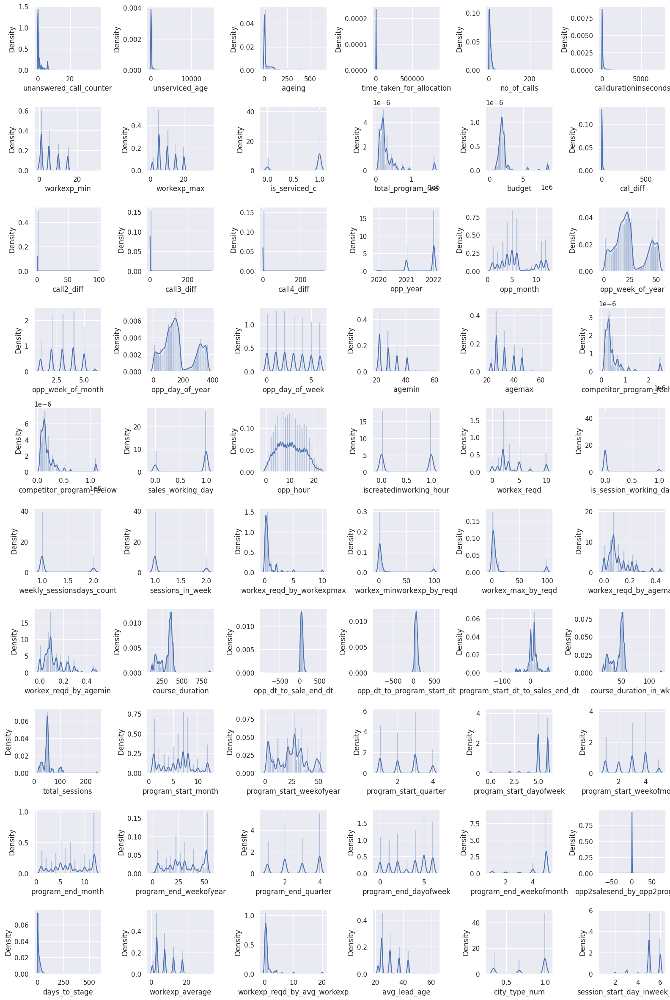

In [ ]:
# Add subplots of histograms to look for patterns

fig = plt.figure(figsize=(16, 28))

for idx, feature in enumerate(df.select_dtypes(include = ['int','float']).columns):

    sub = fig.add_subplot(12,6,idx+1)
    sub.set_xlabel(feature)
    sns.distplot(df[feature])

plt.tight_layout()

There are many features with long right-tails. We would need to explore if the presence of outliers are informative of target classes. We will explore this in feature-encoding.  

**Let's check the categorical features that require encoding.**

Intuitively speaking, the geographical location ('city' feature) of the lead shouldn't matter for predictions, since the courses are remotely delivered.

But since the** city** the lead belongs to is **indictive of income-levels, socio-economic status, and access to utilities like electricity and internet**, we will resort to using 'city_type' as a proxy for city and the corresponding encoded information.

Since the sales team has little to do with the marketing channel, I will explore the effect of source and subsource on the target later on.

In [ ]:
for value in ['0','1','2']:
    display(value)
    display(df[df['target_sales']==value][freq_encode_features + one_hot_features].describe())


'0'

,subsource,source,city,program_code_renewed,category,business_vertical,institute
count,263472,263472,263472,263472,263472,263472,263472
unique,70,17,4027,100,25,3,14
top,facebook,facebook,Delhi NCR,IITRK-PGCPDSML,Leadership & Strategy,MDP,IIM Indore
freq,141098,140644,56052,11700,56548,103002,43791


'1'

,subsource,source,city,program_code_renewed,category,business_vertical,institute
count,89782,89782,89782,89782,89782,89782,89782
unique,68,18,2048,110,26,3,14
top,facebook,facebook,Delhi NCR,IIMK-EPGP,General Management,MDP,IIM Kozhikode
freq,51018,50798,18806,10611,16792,46596,21523


'2'

,subsource,source,city,program_code_renewed,category,business_vertical,institute
count,15235,15235,15235,15235,15235,15235,15235
unique,58,18,453,108,25,3,14
top,facebook,facebook,Not Known,IIMK-EPGP,Leadership & Strategy,MDP,IIM Kozhikode
freq,4648,4587,4593,1166,2307,6491,4141


In [ ]:
'''
Missing values have been handled. Lets check the cardinality of categorical features
'''
def cardinality_counter(df, features=list(), drop_list = list()):
    cardinality_counter = {}
    vals = {}
    print('Feature count: ',len(features))
    for feature in features:

        if feature not in drop_list:
            vals[feature] = df[feature].value_counts()
            cardinality_counter[feature] = len(df[feature].unique())

    return vals, cardinality_counter

In [ ]:
cardinality_counter(df=df, features=cardinal_features )

Feature count:  6


({'city_type': Tier-1    233465
  Tier-3     81888
  Tier-2     53136
  Name: city_type, dtype: int64,
  'workexp': 1-5 years      134687
  5-10 years      90352
  10-15 years     59704
  15-20 years     51945
  0-1 years       30244
  20-25 years      1476
  25-30 years        61
  30-35 years        20
  Name: workexp, dtype: int64,
  'opp_month_name': May          68407
  June         59488
  April        55338
  December     35614
  November     34270
  March        33463
  January      27269
  February     22023
  October      21190
  September     6200
  August        3395
  July          1832
  Name: opp_month_name, dtype: int64,
  'opp_day_name': Tuesday      57616
  Wednesday    57525
  Monday       54631
  Thursday     54062
  Friday       51633
  Saturday     47074
  Sunday       45948
  Name: opp_day_name, dtype: int64,
  'age': 22-27 years    134687
  28-33 years     90352
  34-40 years     59704
  41-46 years     51945
  21-23 years     30244
  47-54 years      1476
  55-

# 3.2. Business Insights with Multivariate Analysis

{'0': ['Dead', 'Cold'],
 '2': ['Offered',
  'Registered - Form Incomplete',
  'Registration Initiated',
  'Dropout',
  'Registered - Form Complete',
  'Sent to the institute',
  'T+3',
  'T7+',
  'Enrolled',
  'T+7',
  'Rejected',
  'Offered - Document completed',
  'Offer Declined',
  'PI Scheduled',
  'Eligible for Test',
  'On Hold by the Institute'],
 '1': ['Contacted',
  'Warm',
  'Enquiry',
  'Reinquired',
  'Attempt To contact',
  'Call back']}

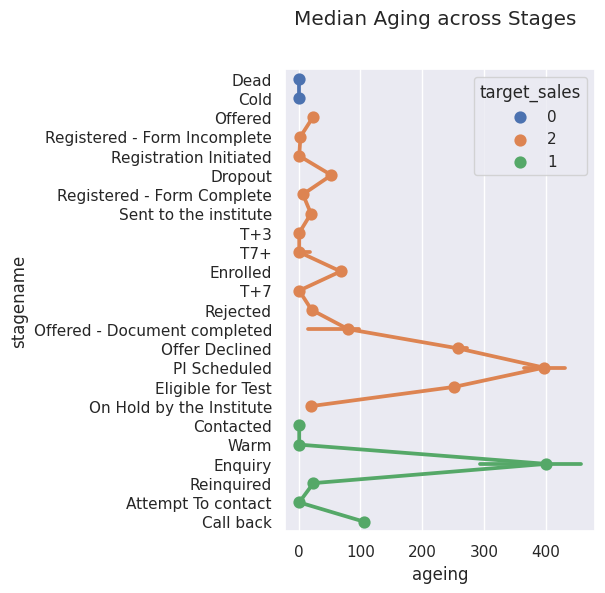

In [ ]:
target_subtarget_map = {}

for funnel in df['target_sales'].unique():
    stages = df[df['target_sales'] == funnel][subtarget].unique().tolist()

    target_subtarget_map[funnel] = stages
display(target_subtarget_map)
list_order = []

for _, f_list in target_subtarget_map.items():
    list_order.extend(f_list)
plt.figure(figsize = (4,6))
plt.suptitle('Median Aging across Stages')
sns.pointplot(estimator = 'median', data = df, y = subtarget, hue = 'target_sales', x = 'ageing', order=list_order)
plt.savefig('Median Aging across Stages.jpg');

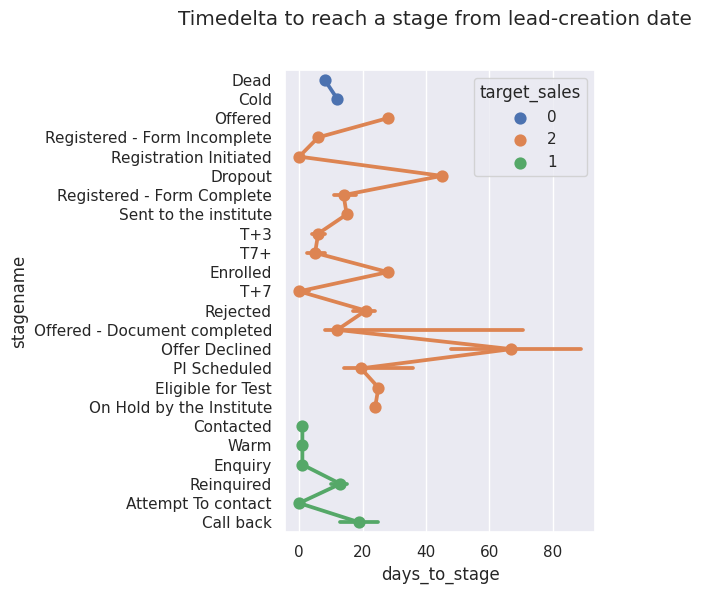

In [ ]:
plt.figure(figsize = (4,6))
plt.suptitle('Timedelta to reach a stage from lead-creation date')
sns.pointplot(estimator = 'median', data = df, y = subtarget, hue = 'target_sales', x = 'days_to_stage', order=list_order )
plt.savefig('Timedelta to reach a stage from lead-creation date.jpg');

- The long lead times across stages in funnel category 2 need to be managed better. It is not enough that leads have applied for the course, they also need to complete the purchase. Long waiting times might cause potential customers to lose interest.

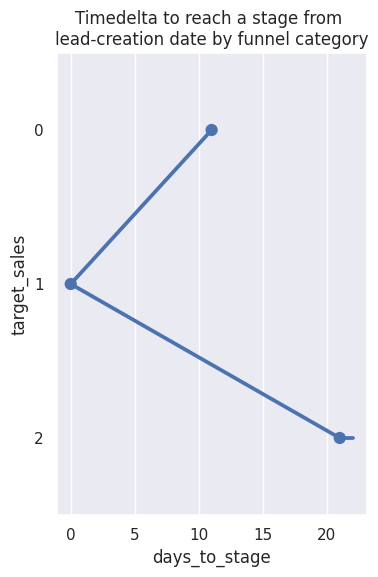

In [ ]:
plt.figure(figsize = (4,6))
plt.title(f'Timedelta to reach a stage from \nlead-creation date by funnel category')
sns.pointplot(estimator = 'median', data = df, y = df['target_sales'].astype('str'), x = 'days_to_stage', order=['0', '1', '2'])
plt.savefig('Timedelta to reach a stage from lead-creation date by funnel category.jpg');

In [ ]:
'''
Since `funnel_category` is a reduction of `stagename`,
lets check the distribution of `stagename` within each `funnel_category`
'''
display(df['funnel_category'].value_counts())
print()
display(df[['funnel_category','stagename']].groupby('funnel_category').value_counts())

Wasted_leads         263472
Engaged               89782
Applications           8095
Enrolled               6562
Payment Initiated       578
Name: funnel_category, dtype: int64

funnel_category    stagename                   
Applications       Registration Initiated            2298
                   Sent to the institute             1526
                   Dropout                           1417
                   Registered - Form Incomplete      1160
                   Offered                           1097
                   Registered - Form Complete         288
                   Rejected                           268
                   Offer Declined                      18
                   PI Scheduled                        12
                   Offered - Document completed         9
                   Eligible for Test                    1
                   On Hold by the Institute             1
Engaged            Attempt To contact               33086
                   Warm                             27337
                   Contacted                        26327
                   Reinquired                        2491
                   Enqui

There are 4 possible funnel pathways:
- Engaged -> Wasted
- Engaged -> Payment Initiated -> Wasted
- Engaged -> Payment Initiated -> Applications -> Wasted
- Engaged -> Payment Initiated -> Applications -> Enrolled

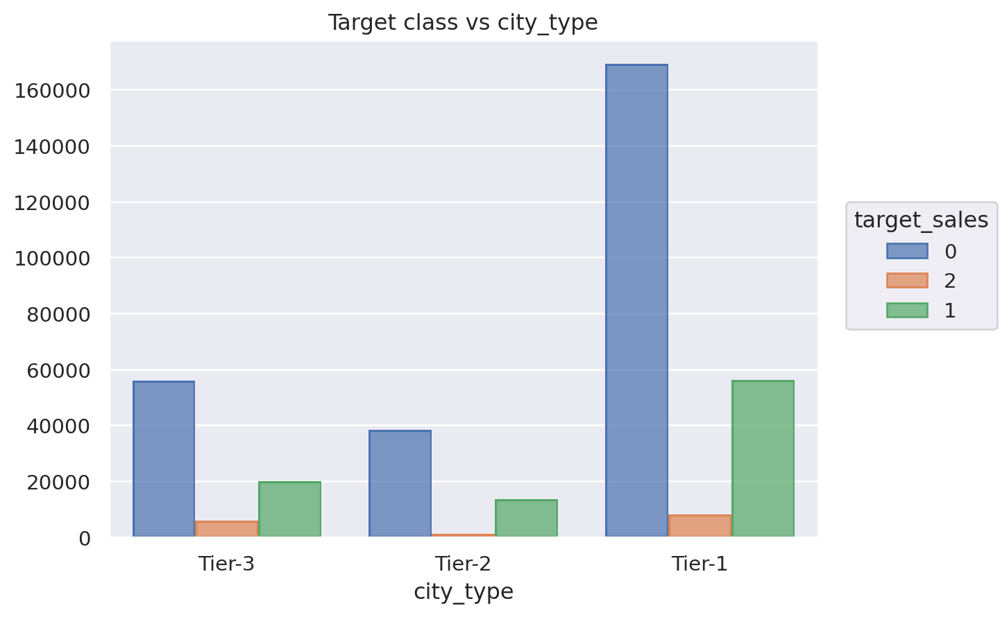

In [ ]:
title = "Target class vs city_type"
x = "city_type"
color = "target_sales"
so.Plot(df, x= x, color = color).add(so.Bar(), so.Hist(), so.Dodge()).label(title=title)


- Most Leads are generated from Tier-1 cities. Across all classes, leads from Tier-1, Tier-3 and then Tier-2 cities show interest in our programs in that order.

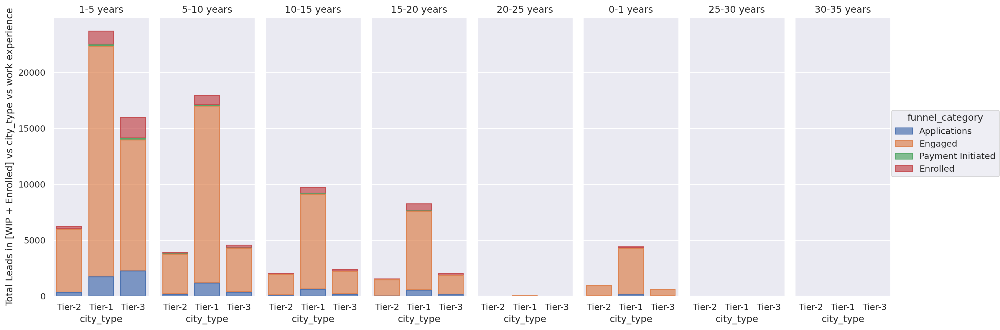

In [ ]:
## Demographics

title = 'Total Leads in [WIP + Enrolled] vs city_type vs work experience'
data = df[(df['target_sales'] == '1') | (df['target_sales'] == '2')]
x = "city_type"
color = "funnel_category"
facet = "workexp"


p = so.Plot(data, x=x, color=color).add(so.Bar(), so.Hist(), so.Stack()).label(y = title)
p.facet(facet).layout(size=(16, 6))

- Most engagement is recieved from leads ho are in early carer stages. Marketing needs to focus on these groups to maximise revenue.

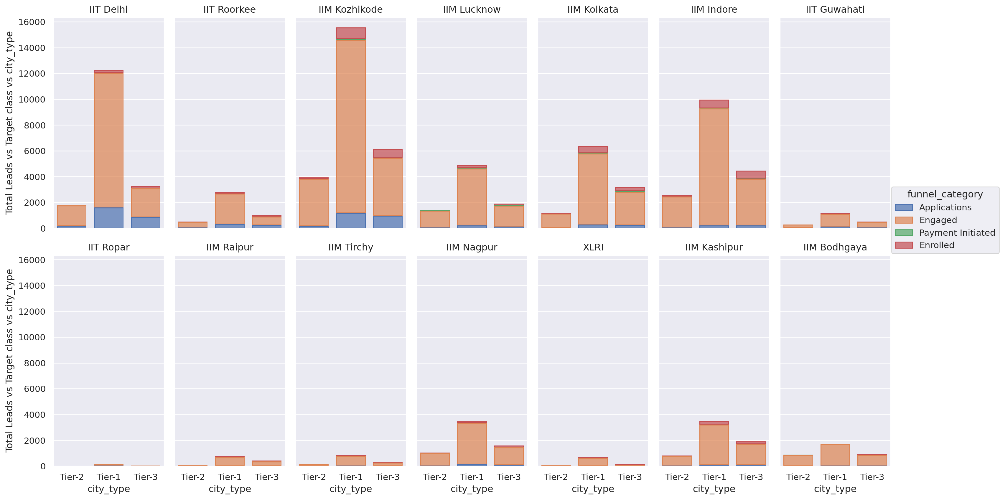

In [ ]:
title = "Total Leads vs Target class vs city_type"
p = so.Plot(df[(df['target_sales'] != '0')], x="city_type",
            color="funnel_category").add(so.Bar(), so.Hist(), so.Stack())
p.facet("institute", wrap = 7).layout(size=(16, 9)).label(y = title)

- What makes IIM Kozhikode different from others?
- Is it the perceived value of the courses? Could it be the cost?
- Does the value have anything to do with how experienced the leads are in their careers?

In [ ]:
progs = ['total_program_fee','competitor_program_feehigh','competitor_program_feelow']

price_compare = df[df['target_sales'] == '2'].groupby(['institute']).agg({'total_program_fee':'median',
                                                                    'competitor_program_feehigh':'median',
                                                                    'competitor_program_feelow':'median'})[progs] #total_program_fee
revenue_totals = df[df['funnel_category'] == 'Enrolled'].groupby(['institute']).agg({'total_program_fee':'sum',
                                                                    'competitor_program_feehigh':'sum',
                                                                    'competitor_program_feelow':'sum'})[progs] #total_program_fee
revenue_totals_workxp = df[df['funnel_category'] == 'Enrolled'].groupby(['institute', 'workexp_average']).agg({'total_program_fee':'sum',
                                                                    'competitor_program_feehigh':'sum',
                                                                    'competitor_program_feelow':'sum'})[progs] #total_program_fee

revenue_mean = df[df['funnel_category'] == 'Enrolled'].groupby(['institute']).agg({'total_program_fee':'mean',
                                                                    'competitor_program_feehigh':'mean',
                                                                    'competitor_program_feelow':'mean'})[progs] #total_program_fee


revenue_med = df[df['funnel_category'] == 'Enrolled'].groupby(['institute']).agg({'total_program_fee':'median',
                                                                    'competitor_program_feehigh':'median',
                                                                    'competitor_program_feelow':'median'})[progs] #total_program_fee

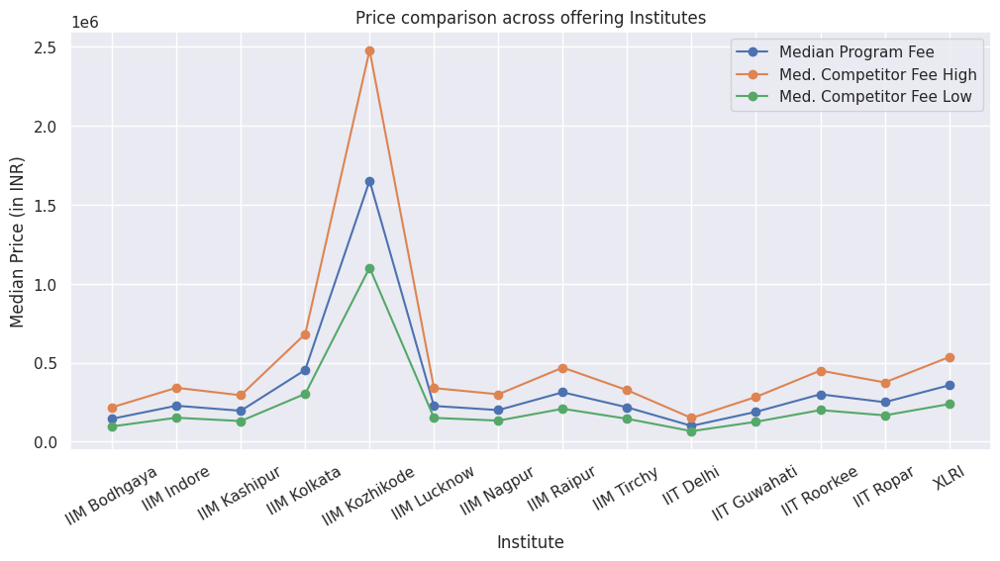

In [ ]:
plt.figure(figsize=(12,5.5))
plt.plot(price_compare, '-o')
plt.xlabel('Institute')
plt.ylabel('Median Price (in INR)')
plt.xticks(rotation=30)
plt.title('Price comparison across offering Institutes')
plt.legend(['Median Program Fee', 'Med. Competitor Fee High', 'Med. Competitor Fee Low'])
plt.savefig('program_fee_price_compare_bw_institutes.png')
plt.show();

- Program prices at IIM Kozhikode are also higher compared to other institutes. Let's see what else is different about IIM Kozhikode.

In [ ]:
revenue_totals_workxp_1 = revenue_totals_workxp.unstack(0)['total_program_fee']

revenue_totals_workxp_1 = revenue_totals_workxp_1.fillna(0)
revenue_totals_workxp_1 = revenue_totals_workxp_1.astype('int')
revenue_totals_workxp_1['revenue_sum'] = revenue_totals_workxp_1.sum(axis=1)
revenue_totals_workxp_1

institute,IIM Bodhgaya,IIM Indore,IIM Kashipur,IIM Kolkata,IIM Kozhikode,IIM Lucknow,IIM Nagpur,IIM Raipur,IIM Tirchy,IIT Delhi,IIT Guwahati,IIT Roorkee,IIT Ropar,XLRI,revenue_sum
workexp_average,,,,,,,,,,,,,,,
0.500,145000,2213145,961000,14254100,11965480,1334500,3279000,2313500,217356,3185800,188800,2100000,0,4814400,46972081
3.000,4030000,175696835,51257360,210105660,448064640,41070560,32879000,20508800,17437296,20865800,8732000,41800000,2750000,33883700,1109081651
7.500,1465000,59695315,16811680,68676300,202621220,20064670,11789000,4500000,2763126,7893400,5144800,11300000,500000,10926800,424151311
12.500,1170000,42926790,12187560,56914720,87379440,17981000,12343500,8253200,3348132,4827400,2171200,10700000,500000,6667000,267369942
17.500,1005000,41649245,10392200,95727740,82730920,15697500,14972500,14007200,8162886,5475000,2737600,5600000,0,4935350,303093141
22.500,0,763250,200000,16149200,729000,0,200000,0,0,0,0,0,0,424800,18466250
32.500,0,0,0,0,1652000,0,0,0,0,0,0,0,0,0,1652000


In [ ]:
revenue_totals_workxp_1.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 7 entries, 0.5 to 32.5
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype
---  ------         --------------  -----
 0   IIM Bodhgaya   7 non-null      int64
 1   IIM Indore     7 non-null      int64
 2   IIM Kashipur   7 non-null      int64
 3   IIM Kolkata    7 non-null      int64
 4   IIM Kozhikode  7 non-null      int64
 5   IIM Lucknow    7 non-null      int64
 6   IIM Nagpur     7 non-null      int64
 7   IIM Raipur     7 non-null      int64
 8   IIM Tirchy     7 non-null      int64
 9   IIT Delhi      7 non-null      int64
 10  IIT Guwahati   7 non-null      int64
 11  IIT Roorkee    7 non-null      int64
 12  IIT Ropar      7 non-null      int64
 13  XLRI           7 non-null      int64
 14  revenue_sum    7 non-null      int64
dtypes: int64(15)
memory usage: 896.0 bytes


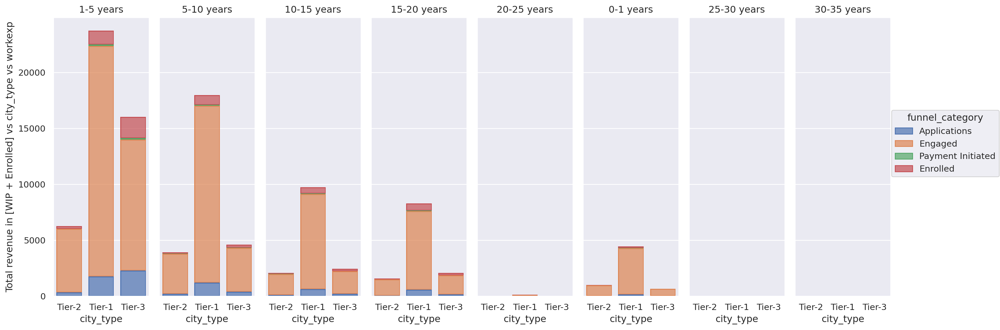

In [ ]:
## Demographics
revenue_totals_workxp
title = 'Total revenue in [WIP + Enrolled] vs city_type vs workexp'
data = df[(df['target_sales'] == '1') | (df['target_sales'] == '2')]
x = "city_type"
color = "funnel_category"
facet = "workexp"


p = so.Plot(data, x=x, color=color).add(so.Bar(), so.Hist(), so.Stack()).label(y = title)
p.facet(facet).layout(size=(16, 6))

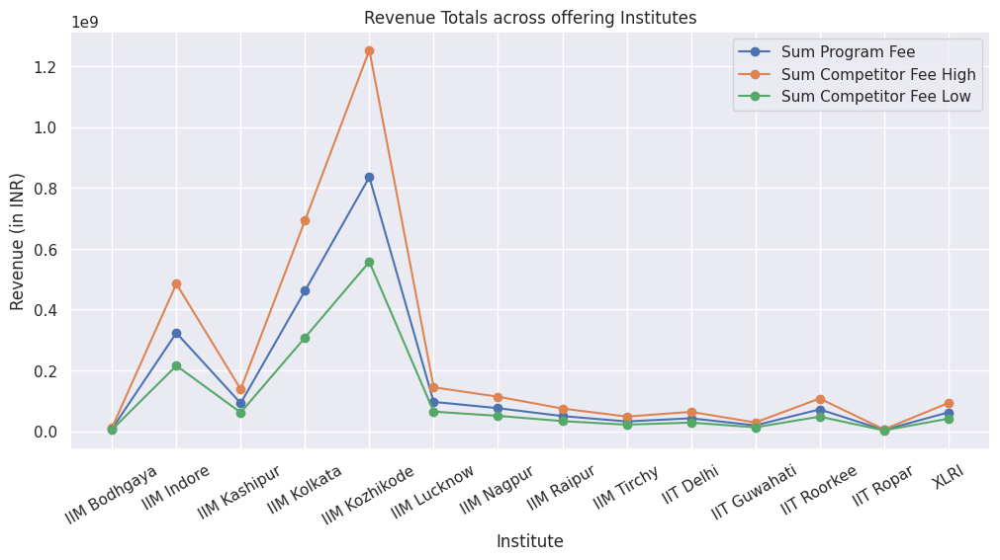

In [ ]:
plt.figure(figsize=(12,5.5))
plt.plot(revenue_totals, '-o')
plt.xlabel('Institute')
plt.ylabel('Revenue (in INR)')
plt.xticks(rotation=30)
plt.title('Revenue Totals across offering Institutes')
plt.legend(['Sum Program Fee', 'Sum Competitor Fee High', 'Sum Competitor Fee Low'])
plt.savefig('Sum_Revenue_compare_bw_institutes.png')
plt.show();

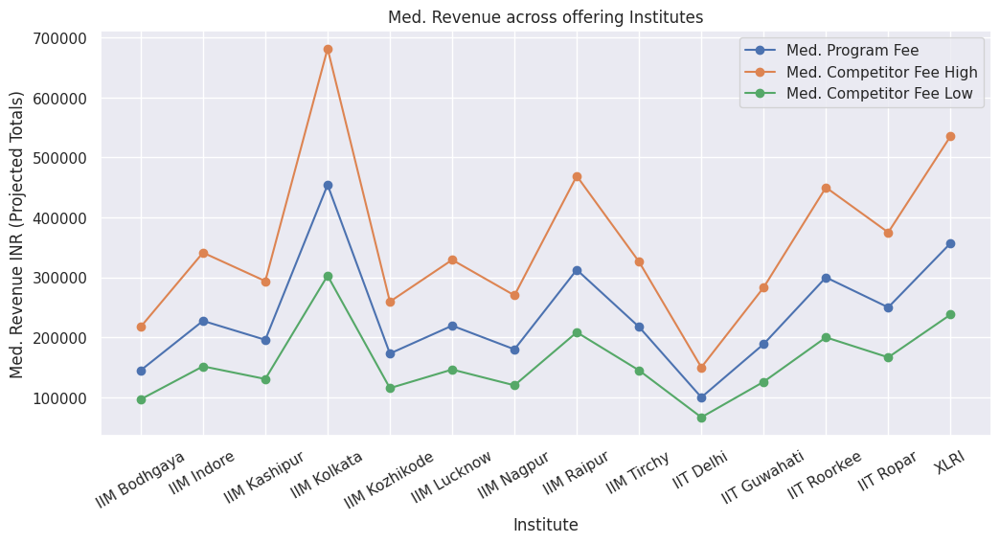

In [ ]:
plt.figure(figsize=(12,5.5))
plt.plot(revenue_med, '-o')
plt.xlabel('Institute')
plt.ylabel('Med. Revenue INR (Projected Totals)')
plt.xticks(rotation=30)
plt.title('Med. Revenue across offering Institutes')
plt.legend(['Med. Program Fee', 'Med. Competitor Fee High', 'Med. Competitor Fee Low'])
plt.savefig('Med.Revenue_compare_bw_institutes.png')
plt.show();

Total Revenue is higher for IIM Kozhikode tha IIM Kolkata, but the reverse is true for Median Revenue.

This suggests that, there are more enrollments for IIM Kolkata for highly priced courses, and more enrollments for slightly lower-priced courses at IIM Kozhikode. Lets verify this.

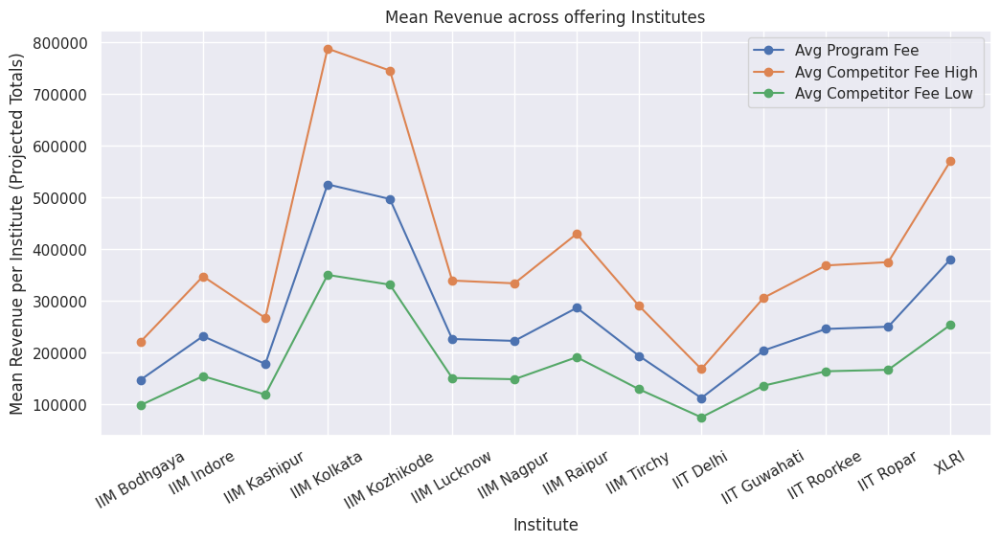

In [ ]:
plt.figure(figsize=(12,5.5))
plt.plot(revenue_mean, '-o')
plt.xlabel('Institute')
plt.ylabel('Mean Revenue per Institute (Projected Totals)')
plt.xticks(rotation=30)
plt.title('Mean Revenue across offering Institutes')
plt.legend(['Avg Program Fee', 'Avg Competitor Fee High', 'Avg Competitor Fee Low'])
plt.savefig('Avg_Revenue_compare_bw_institutes.png')
plt.show();

This confirms our initial hypothesis. While revenue is driven by enrollments (`Enrolled` funnel category) at IIM Kozhikode, there are some premium-priced courses that are highly favoured at IIM Kolkate. Potential for scaling-up capacity at IIM Kozhikode?

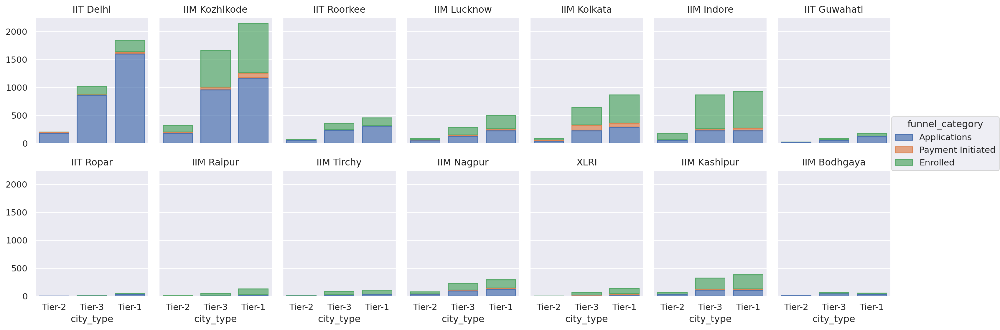

In [ ]:
p = so.Plot(df[(df['target_sales'] == '2')], x="city_type",
            color="funnel_category").add(so.Bar(), so.Hist(), so.Stack())
p.facet("institute", wrap = 7).layout(size=(16, 6))

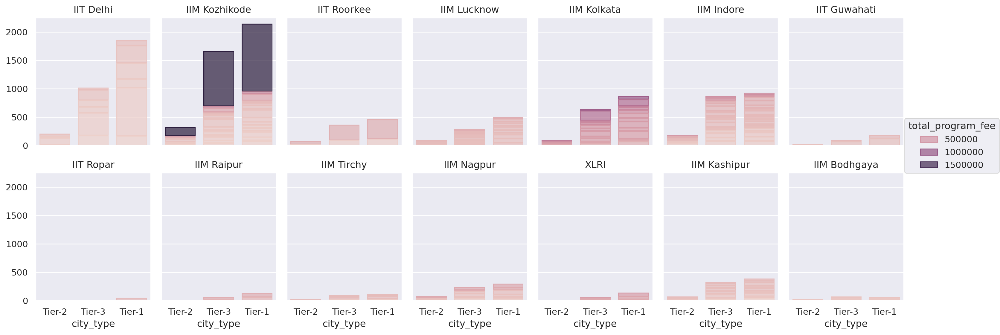

In [ ]:
p = so.Plot(df[(df['target_sales'] == '2')], x="city_type",
            color="total_program_fee").add(so.Bar(), so.Hist(), so.Stack())
p.facet("institute", wrap = 7).layout(size=(16, 6))

Sales leads can prioritize leads enquiring about IIT Delhi, IIM Kozhikode and IIM Kolkata during customer calls, contact, discount offers etc. Operations can make executive decisions on the priority based on revenue/brand-value/market-capture projections/milestones.

- Top 3 revenue generating institutes.

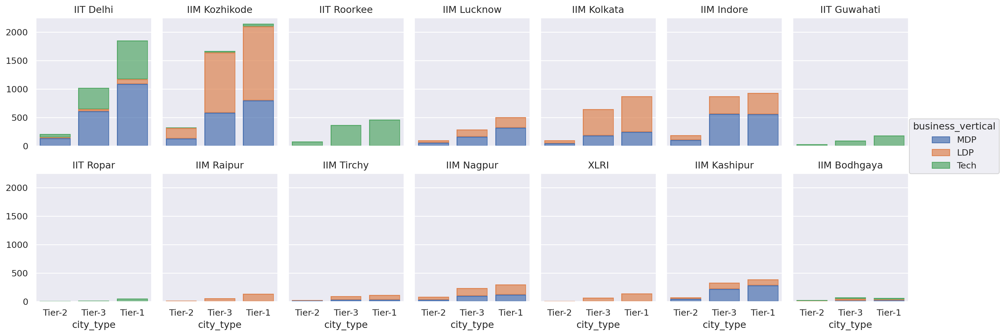

In [ ]:
p = so.Plot(df[(df['target_sales'] == '2')], x="city_type",
            color="business_vertical").add(so.Bar(), so.Hist(), so.Stack())
p.facet("institute", wrap = 7).layout(size=(16, 6))

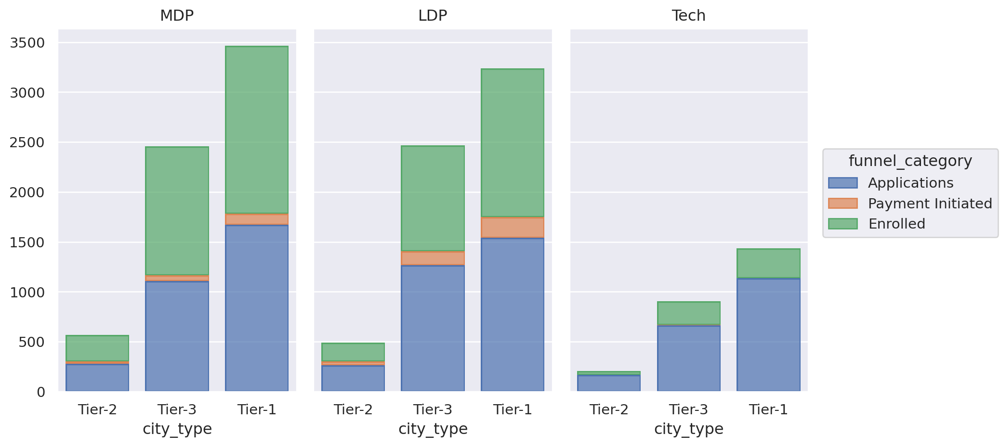

In [ ]:
'''
Business verticals:
MDP: Management Development Program
LDP: Leadership Development Program
Tech: Technology
'''

p = so.Plot(df[(df['target_sales'] == '2') | (df['target_sales'] == '3')], x="city_type",
            color="funnel_category").add(so.Bar(), so.Hist(), so.Stack())#.label(y='Enrolled')
p.facet("business_vertical").layout(size=(9, 5))

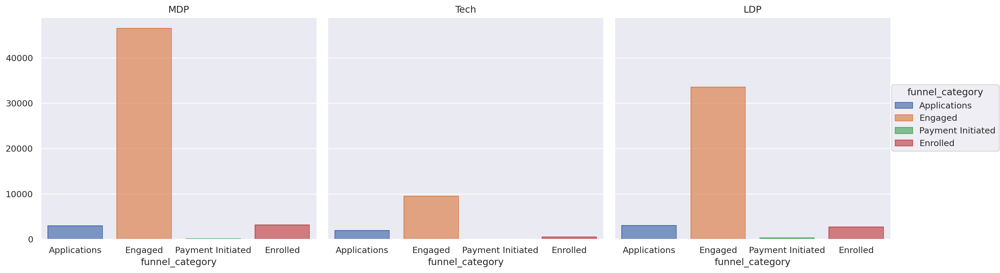

In [ ]:
p = so.Plot(df[df['funnel_category'] != 'Wasted_leads'], x="funnel_category",
            color="funnel_category").add(so.Bar(), so.Hist(), so.Stack())#.label(y='Enrolled')
p.facet("business_vertical").layout(size=(16, 5))

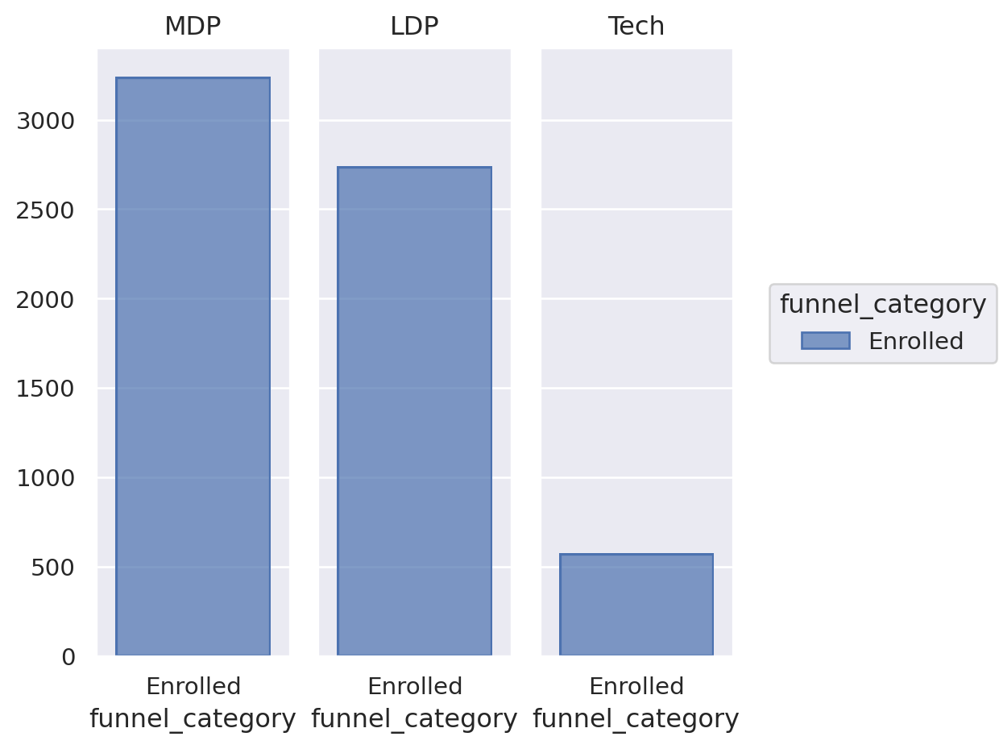

In [ ]:
p = so.Plot(df[df['funnel_category'] == 'Enrolled'], x="funnel_category",
            color="funnel_category").add(so.Bar(), so.Hist(), so.Stack())#.label(y='Enrolled')
p.facet("business_vertical").layout(size=(5, 5))

- MDP programs are more popular, followed by LDP and then Tech programs. This probably has to do with pay-hikes, ease of access to executive management programs offered through the business, as opposed to the more traditional programs, whose entry is through clearing exams like CAT/GMAT which typically have a low-acceptance rate.

- This also gives the business a clear signal, that increased partnerships with premier MBA/Management institutes will maximise revenue.

**Looks like MDP is the most popular business vertical.**

In [ ]:
# For Marketing and Revenue Analysis
df_hat = df.groupby(['business_vertical', 'program_code_renewed', 'target_sales']).\
agg({'funnel_category':'count',
     'total_program_fee':'median',
     'competitor_program_feehigh':'median',
     'competitor_program_feelow':'median'})

display(df_hat[:15])
del(df_hat)

funnel_category  \
business_vertical program_code_renewed target_sales                    
LDP               IIM I-ECPSLP         0                         260   
                                       1                         103   
                                       2                         113   
                  IIM I-EPAMM          0                           7   
                                       1                         165   
                                       2                          56   
                  IIM Kashipur - EPSL  0                           8   
                                       1                         318   
                                       2                          68   
                  IIM Raipur-SMP       0                        4248   
                                       1                        1097   
                                       2                         208   
                  IIMBG-ECPBM          0                        2978   
                                       1                        1010   
                                       2                          53   

                                                     total_program_fee  \
business_vertical program_code_renewed target_sales                      
LDP               IIM I-ECPSLP         0                    307390.000   
                                       1                    307390.000   
                                       2                    307390.000   
                  IIM I-EPAMM          0                    240130.000   
                                       1                    240130.000   
                                       2                    240130.000   
                  IIM Kashipur - EPSL  0                    236000.000   
                                       1                    236000.000   
                                       2                    236000.000   
                  IIM Raipur-SMP       0                    312700.000   
                                       1                    312700.000   
                                       2                    312700.000   
                  IIMBG-ECPBM          0                    160000.000   
                                       1                    160000.000   
                                       2                    160000.000   

                                                     competitor_program_feehigh  \
business_vertical program_code_renewed target_sales                               
LDP               IIM I-ECPSLP         0                             461085.000   
                                       1                             461085.000   
                                       2                             461085.000   
                  IIM I-EPAMM          0                             360195.000   
                                       1                             360195.000   
                                       2                             360195.000   
                  IIM Kashipur - EPSL  0                             354000.000   
                                       1                             354000.000   
                                       2                             354000.000   
                  IIM Raipur-SMP       0                             469050.000   
                                       1                             469050.000   
                                       2                             469050.000   
                  IIMBG-ECPBM          0                             240000.000   
                                       1                             240000.000   
                                       2                             240000.000   

                                                     competitor_program_feelow  
business_vertical program_code_renewed target_sales                         

**Popularity checks for Institutes across Business Verticals**

In [ ]:
df_hat = df.groupby(['business_vertical', 'institute']).\
agg({'institute':'count'}).\
unstack(0)['institute']

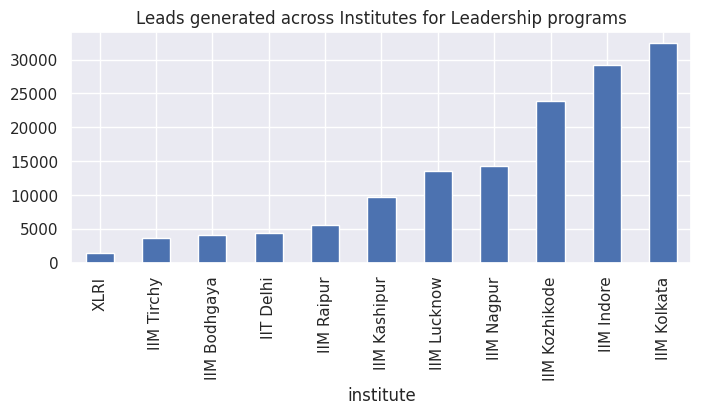

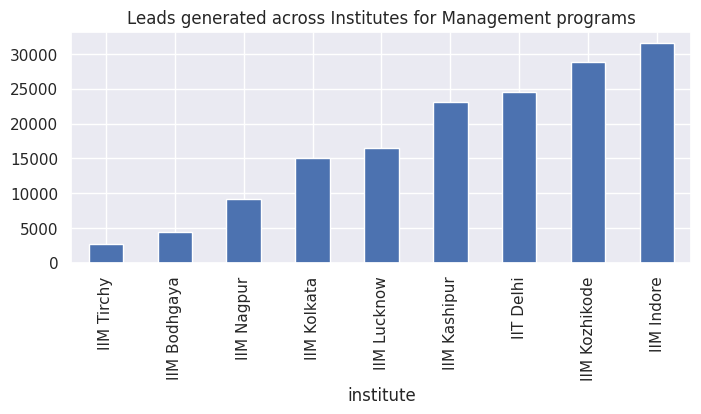

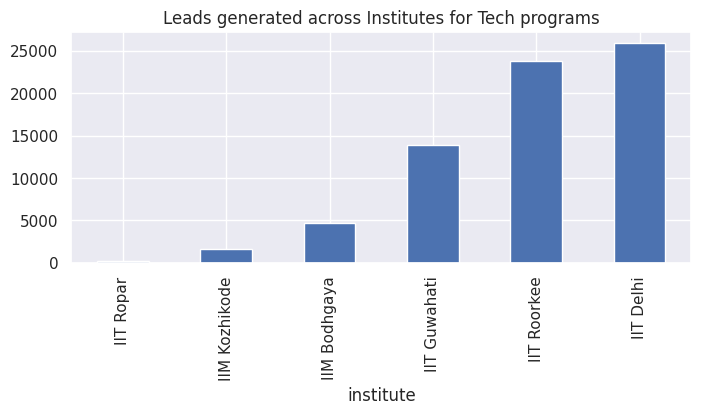

In [ ]:
# For Marketing
plt.figure(figsize = (8, 3))
plt.title('Leads generated across Institutes for Leadership programs')

df_hat['LDP'].sort_values().dropna().plot(kind = 'bar', orientation = 'vertical')

plt.savefig('Leads generated across Institutes for Leadership programs.jpg');

# For Marketing
plt.figure(figsize = (8, 3))
plt.title('Leads generated across Institutes for Management programs')

df_hat['MDP'].sort_values().dropna().plot(kind = 'bar', orientation = 'vertical')

plt.savefig('Leads generated across Institutes for Management programs.jpg');

# For Marketing
plt.figure(figsize = (8, 3))
plt.title('Leads generated across Institutes for Tech programs')

df_hat['Tech'].sort_values().dropna().plot(kind = 'bar', orientation = 'vertical')

plt.savefig('Leads generated across Institutes for Tech programs.jpg');

In [ ]:
del(df_hat)

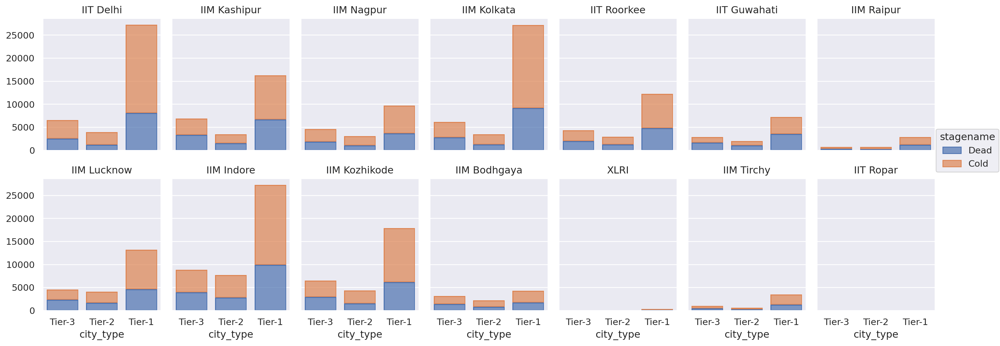

In [ ]:
p = so.Plot(df[(df['target_sales'] == '0')], x="city_type",
            color="stagename").add(so.Bar(), so.Hist(), so.Stack())
p_ = p.facet("institute", wrap = 7).layout(size=(16, 6))

p_

In [ ]:
display(df.shape)
display(df[df['funnel_category'] == 'Wasted_leads'].shape)

(368489, 89)

(263472, 89)

# 4. Correlation Analysis
Coorelation Analysis between some enginered features and original features are expected to show a high degree of correlation. My objective for coorelation analysis is to find out any unexpected correlations between the features and the target values. For this purpose alone, I will use one-hot encoded targets.

In [ ]:
%%capture
!pip install feature_engine

In [ ]:
import feature_engine.encoding

In [ ]:
onehot_enc = feature_engine.encoding.OneHotEncoder(variables = ['target_sales'])

df_hat = onehot_enc.fit_transform(df)
df_hat.head()

,opportunity_id,stagename,subsource,unanswered_call_counter,unserviced_age,ageing,source,opportunity_created_date,time_taken_for_allocation,no_of_calls,calldurationinseconds,funnel_category,city,city_type,workexp,workexp_min,workexp_max,laststagechangedate,is_serviced_c,sales_end_,sales_start_date,program_number,program_code_renewed,total_program_fee,category,business_vertical,budget,lastactivitydate,institute,cal_diff,call2_diff,call3_diff,call4_diff,opp_year,opp_month,opp_month_name,opp_week_of_year,opp_week_of_month,opp_day_of_year,opp_day_of_week,opp_day_name,age,agemin,agemax,competitor_program_feehigh,competitor_program_feelow,program_start_date_c,program_end_date_c,sales_working_day,time_of_lead,opp_hour,iscreatedinworking_hour,workex_reqd,is_session_working_day,session_start_day_inweek,weekly_sessionsdays_count,sessions_in_week,workes_reqd_by_min_workex,workex_reqd_by_workexpmax,workex_minworkexp_by_reqd,workex_max_by_reqd,workex_reqd_by_agemax,workex_reqd_by_agemin,target_operations,target_marketing,course_duration,opp_dt_to_sale_end_dt,opp_dt_to_program_start_dt,program_start_dt_to_sales_end_dt,course_duration_in_wks,total_sessions,program_start_month,program_start_weekofyear,program_start_quarter,program_start_dayofweek,program_start_weekofmonth,program_end_month,program_end_weekofyear,program_end_quarter,program_end_dayofweek,program_end_weekofmonth,opp2salesend_by_opp2progstart,days_to_stage,workexp_average,workexp_reqd_by_avg_workexp,avg_lead_age,city_type_num,session_start_day_inweek_num,target_sales_0,target_sales_2,target_sales_1
67749,0065j00000bnO2nAAE,Dead,organic,0,0.000,0,organic,2022-04-27 04:45:00,0.000,9,13.000,Wasted_leads,Plano,Tier-3,15-20 years,15,20,2022-05-15 07:11:00,1,2022-07-25,2022-04-15,P-00282,IITD-EMPSM,195000,Strategic Management,LDP,1972000,2022-05-15,IIT Delhi,0,0,0,0,2022,4,April,18,5,117,2,Wednesday,41-46 years,41,46,292500.000,130000.000,2022-08-07,2023-08-06,1,04:45:14,4,0,5,0,Sunday,1,1,0.333333333,0.250,3.000,4.000,0.109,0.122,0,0,364.000,88,101,13,52.000,52.000,8,31,3,6,1,8,31,3,6,1,0.871,18,17.500,0.286,43.500,0.333,6,1,0,0
67750,0065j00000fMGwpAAG,Dead,organic,0,0.000,9,organic,2022-05-31 14:05:00,0.000,4,0.000,Wasted_leads,Others,Tier-3,1-5 years,1,5,2022-06-15 05:46:00,1,2022-07-05,2022-04-04,P-00263,IIMKashipur-EPSL,225000,Leadership & Strategy,LDP,2160000,2022-06-15,IIM Kashipur,0,0,0,0,2022,5,May,23,6,151,1,Tuesday,22-27 years,22,27,337500.000,150000.000,2022-08-27,2023-07-31,1,14:05:55,14,1,5,0,Sunday,1,1,5,1.000,0.200,1.000,0.185,0.227,0,0,338.000,34,87,53,48.286,48.286,8,34,3,5,4,7,31,3,0,5,0.391,14,3.000,1.667,24.500,0.333,6,1,0,0
67751,0065j00000YI9qdAAD,Dead,direct,0,0.000,0,organic,2022-03-27 06:23:00,0.000,3,0.000,Wasted_leads,Ropar,Tier-3,1-5 years,1,5,2022-04-13 07:50:00,1,2022-07-02,2022-03-04,P-00236,IIMN-CSM,200000,Strategic Management,LDP,2217000,2022-04-13,IIM Nagpur,0,0,0,0,2022,3,March,13,4,86,6,Sunday,22-27 years,22,27,300000.000,133333.333,2022-07-16,2023-06-30,0,06:23:01,6,0,3,0,Saturday,1,1,3,0.600,0.333,1.667,0.111,0.136,0,0,349.000,96,110,14,49.857,49.857,7,28,3,5,3,6,26,2,4,5,0.873,17,3.000,1.000,24.500,0.333,5,1,0,0
67752,0065j00000Z7B5DAAV,Dead,direct,0,0.000,71,organic,2022-04-01 10:16:00,0.000,1,0.000,Wasted_leads,Uttar Pradesh,Tier-3,1-5 years,1,5,2022-04-01 10:33:00,1,2022-05-22,2022-02-22,P-00235,IIMC-SURGE,304440,Entrepreneurship,MDP,1457000,2022-04-01,IIM Kolkata,0,0,0,0,2022,4,April,14,1,91,4,Friday,22-27 years,22,27,456660.000,202960.000,2022-06-05,2023-03-30,1,10:16:17,10,1,1,0,Sunday,1,1,1,0.200,1.000,5.000,0.037,0.045,0,0,298.000,50,64,14,42.571,42.571,6,22,2,6,1,3,13,1,3,5,0.781,0,3.000,0.333,24.500,0.333,6,1,0,0
67753,0065j00000YCToXAAX,Dead,organic,0,0.000,0,organic,2022-03-26 02:26:00,0.000,2,100.000,Wasted_leads,Kashipur,Tier-3,10-15 years,10,15,2022-03-26 05:07:00,1,2022-05-25,2022-02-07,P-00208,IIMKashipur-ECPPM,75000,Project Management,MDP,1802000,2022-03-26,IIM Kashipur,0,0,0,0,2022,3,March,13,4,85,5,Saturday,34-40 years,34,40

In [ ]:
#choosing a unique value of 25 as the threshold for determining the discreteness of a feature
discrete_features = [features for features in df_hat.columns if len(df_hat[features].unique())<25] # and features not in year_features]
print(f'Discrete numerical features count:{len(discrete_features)} ')

non_discrete_features = [features for features in df_hat.columns if features not in discrete_features]
df_hat[non_discrete_features].head()

Discrete numerical features count:44 


,opportunity_id,subsource,unanswered_call_counter,unserviced_age,ageing,opportunity_created_date,time_taken_for_allocation,no_of_calls,calldurationinseconds,city,laststagechangedate,sales_end_,sales_start_date,program_number,program_code_renewed,total_program_fee,category,budget,lastactivitydate,cal_diff,call2_diff,call3_diff,call4_diff,opp_week_of_year,opp_day_of_year,competitor_program_feehigh,competitor_program_feelow,program_start_date_c,program_end_date_c,time_of_lead,workes_reqd_by_min_workex,workex_reqd_by_workexpmax,workex_minworkexp_by_reqd,workex_max_by_reqd,workex_reqd_by_agemax,workex_reqd_by_agemin,course_duration,opp_dt_to_sale_end_dt,opp_dt_to_program_start_dt,program_start_dt_to_sales_end_dt,course_duration_in_wks,total_sessions,program_start_weekofyear,program_end_weekofyear,opp2salesend_by_opp2progstart,days_to_stage,workexp_reqd_by_avg_workexp
67749,0065j00000bnO2nAAE,organic,0,0.000,0,2022-04-27 04:45:00,0.000,9,13.000,Plano,2022-05-15 07:11:00,2022-07-25,2022-04-15,P-00282,IITD-EMPSM,195000,Strategic Management,1972000,2022-05-15,0,0,0,0,18,117,292500.000,130000.000,2022-08-07,2023-08-06,04:45:14,0.333333333,0.250,3.000,4.000,0.109,0.122,364.000,88,101,13,52.000,52.000,31,31,0.871,18,0.286
67750,0065j00000fMGwpAAG,organic,0,0.000,9,2022-05-31 14:05:00,0.000,4,0.000,Others,2022-06-15 05:46:00,2022-07-05,2022-04-04,P-00263,IIMKashipur-EPSL,225000,Leadership & Strategy,2160000,2022-06-15,0,0,0,0,23,151,337500.000,150000.000,2022-08-27,2023-07-31,14:05:55,5,1.000,0.200,1.000,0.185,0.227,338.000,34,87,53,48.286,48.286,34,31,0.391,14,1.667
67751,0065j00000YI9qdAAD,direct,0,0.000,0,2022-03-27 06:23:00,0.000,3,0.000,Ropar,2022-04-13 07:50:00,2022-07-02,2022-03-04,P-00236,IIMN-CSM,200000,Strategic Management,2217000,2022-04-13,0,0,0,0,13,86,300000.000,133333.333,2022-07-16,2023-06-30,06:23:01,3,0.600,0.333,1.667,0.111,0.136,349.000,96,110,14,49.857,49.857,28,26,0.873,17,1.000
67752,0065j00000Z7B5DAAV,direct,0,0.000,71,2022-04-01 10:16:00,0.000,1,0.000,Uttar Pradesh,2022-04-01 10:33:00,2022-05-22,2022-02-22,P-00235,IIMC-SURGE,304440,Entrepreneurship,1457000,2022-04-01,0,0,0,0,14,91,456660.000,202960.000,2022-06-05,2023-03-30,10:16:17,1,0.200,1.000,5.000,0.037,0.045,298.000,50,64,14,42.571,42.571,22,13,0.781,0,0.333
67753,0065j00000YCToXAAX,organic,0,0.000,0,2022-03-26 02:26:00,0.000,2,100.000,Kashipur,2022-03-26 05:07:00,2022-05-25,2022-02-07,P-00208,IIMKashipur-ECPPM,75000,Project Management,1802000,2022-03-26,0,0,0,0,13,85,112500.000,50000.000,2022-05-22,2022-10-22,02:26:15,0.2,0.133,5.000,7.500,0.050,0.059,153.000,59,56,-3,21.857,21.857,20,42,1.054,0,0.160


In [ ]:
def corrmap(df = df, title='Correlation Heatmap', savefig_name='corr_map.jpg', method='spearman',
             numeric_only = True, tick_size = 10, annot_size=14, plot_size = [15, 10],
             annot_kws=8, cbar=False):

    plt.figure(figsize = plot_size)
    mask = np.triu(np.ones_like(df.corr(numeric_only=numeric_only), dtype=bool))

    heatmap = sns.heatmap(df.corr(method=method, numeric_only = numeric_only),
                          fmt = '.2f', cbar=cbar, annot = True,
                          annot_kws = {'size': annot_kws}, mask=mask, cmap='BrBG')

    plt.xticks(rotation=80, fontsize= tick_size)
    plt.yticks( fontsize= tick_size)

    heatmap.set_title(title, fontdict={'fontsize':annot_size}, pad=12)
    plt.tight_layout()
    plt.savefig(savefig_name)
    plt.show();

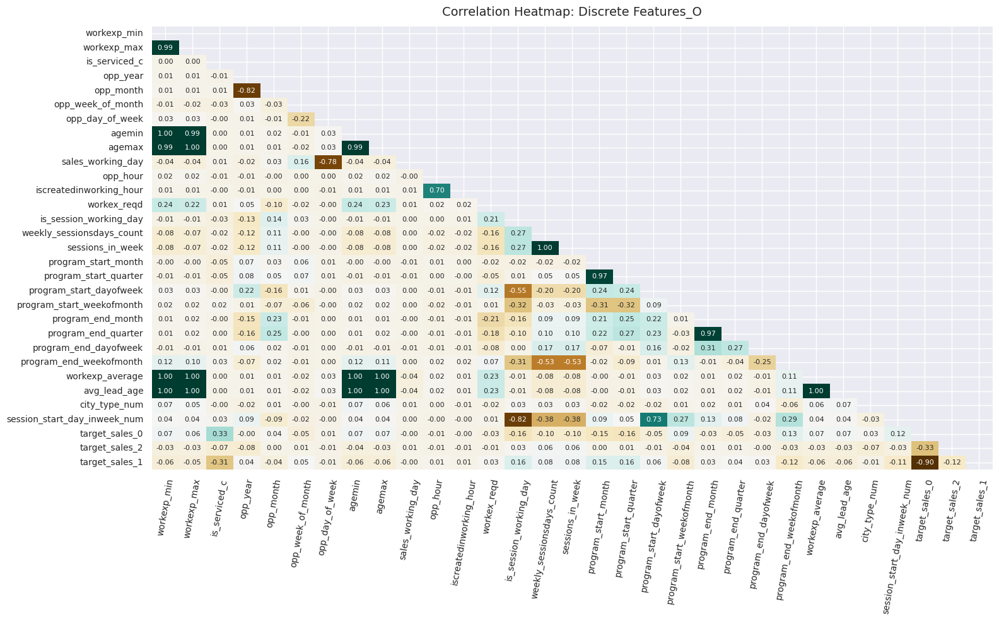

In [ ]:
corrmap(df_hat[discrete_features], method = 'pearson', plot_size = [16, 10],
        title = 'Correlation Heatmap: Discrete Features_O',
        savefig_name = 'correlation_discrete_feature_O.jpg')

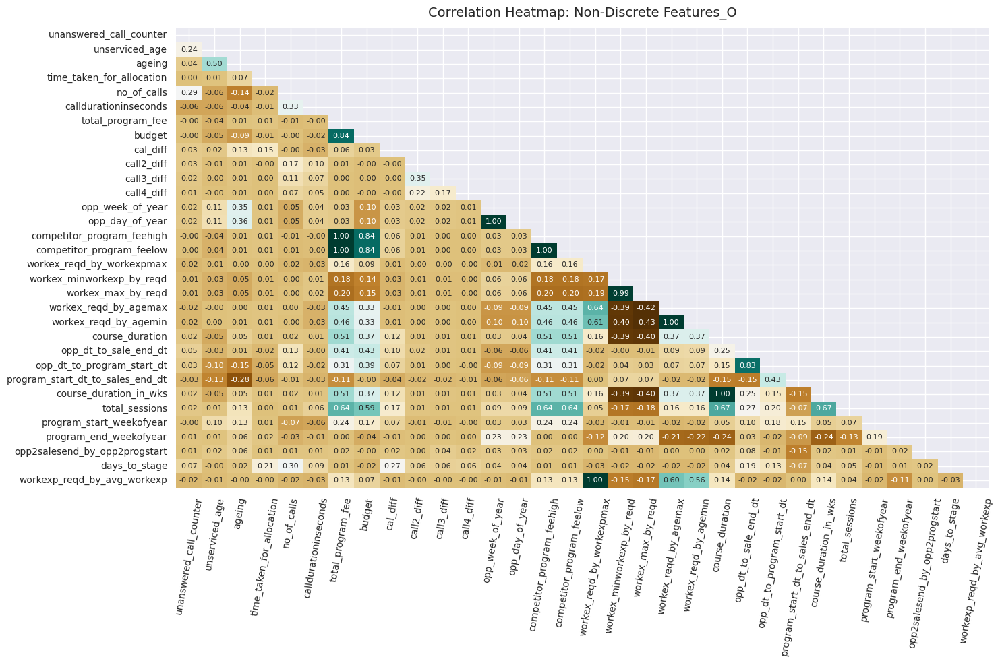

In [ ]:
corrmap(df_hat[non_discrete_features], method = 'pearson', plot_size = [15, 10],
        title = 'Correlation Heatmap: Non-Discrete Features_O',
        savefig_name = 'correlation_non_discrete_feature_O.jpg')

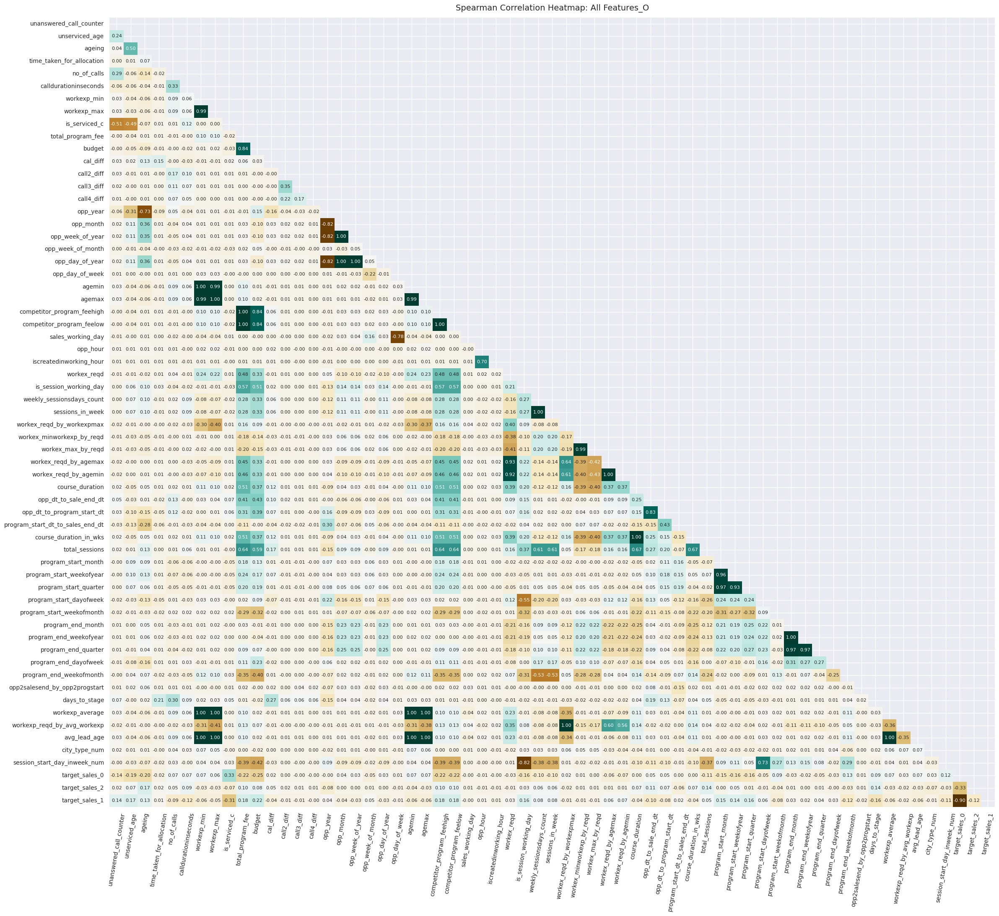

In [ ]:
corrmap(df_hat, method = 'pearson', plot_size = [24, 22],
        title = 'Spearman Correlation Heatmap: All Features_O',
        savefig_name = 'correlation_all_feature_O.jpg')

In [ ]:
del(df_hat)

In [ ]:
df.shape

(368489, 89)

In [ ]:
df.describe()

,unanswered_call_counter,unserviced_age,ageing,time_taken_for_allocation,no_of_calls,calldurationinseconds,workexp_min,workexp_max,is_serviced_c,total_program_fee,budget,cal_diff,call2_diff,call3_diff,call4_diff,opp_year,opp_month,opp_week_of_year,opp_week_of_month,opp_day_of_year,opp_day_of_week,agemin,agemax,competitor_program_feehigh,competitor_program_feelow,sales_working_day,opp_hour,iscreatedinworking_hour,workex_reqd,is_session_working_day,weekly_sessionsdays_count,sessions_in_week,workex_reqd_by_workexpmax,workex_minworkexp_by_reqd,workex_max_by_reqd,workex_reqd_by_agemax,workex_reqd_by_agemin,course_duration,opp_dt_to_sale_end_dt,opp_dt_to_program_start_dt,program_start_dt_to_sales_end_dt,course_duration_in_wks,total_sessions,program_start_month,program_start_weekofyear,program_start_quarter,program_start_dayofweek,program_start_weekofmonth,program_end_month,program_end_weekofyear,program_end_quarter,program_end_dayofweek,program_end_weekofmonth,opp2salesend_by_opp2progstart,days_to_stage,workexp_average,workexp_reqd_by_avg_workexp,avg_lead_age,city_type_num,session_start_day_inweek_num
count,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000,368489.000
mean,1.133,246.881,32.550,454.210,7.212,139.238,5.412,9.718,0.825,305250.176,2119024.917,4.249,0.021,0.020,0.021,2021.680,5.981,24.909,3.169,166.551,2.856,28.119,33.043,457875.264,203500.117,0.748,10.210,0.495,3.481,0.095,1.204,1.204,0.683,9.466,11.143,0.107,0.126,305.563,49.168,57.302,8.134,43.652,51.926,5.917,23.815,2.352,5.278,2.920,7.133,30.548,2.694,3.371,4.427,0.874,14.124,7.565,1.183,30.581,0.804,5.117
std,2.144,1090.378,70.063,13813.321,6.329,314.434,5.185,5.904,0.380,307158.898,1400007.068,19.981,0.472,0.646,0.967,0.496,3.366,14.685,1.332,103.178,1.967,6.960,7.421,460738.346,204772.598,0.434,5.330,0.500,2.790,0.294,0.403,0.403,1.353,26.036,25.826,0.086,0.100,90.664,32.912,35.983,20.343,12.952,24.259,3.270,13.933,1.029,0.971,1.224,3.642,15.665,1.116,2.089,1.143,2.210,23.950,5.529,2.719,7.178,0.276,0.922
min,0.000,0.000,0.000,0.000,1.000,0.000,0.000,1.000,0.000,70800.000,161000.000,0.000,0.000,0.000,0.000,2020.000,1.000,1.000,1.000,1.000,0.000,21.000,23.000,106200.000,47200.000,0.000,0.000,0.000,0.000,0.000,1.000,1.000,0.000,0.000,0.100,0.000,0.000,119.000,-911.000,-910.000,-144.000,17.000,17.000,1.000,1.000,1.000,0.000,1.000,1.000,1.000,1.000,0.000,1.000,-74.000,0.000,0.500,0.000,22.000,0.333,1.000
25%,0.000,0.000,1.000,0.000,3.000,1.000,1.000,5.000,1.000,150000.000,1585000.000,0.000,0.000,0.000,0.000,2021.000,4.000,15.000,2.000,96.000,1.000,22.000,27.000,225000.000,100000.000,0.000,6.000,0.000,2.000,0.000,1.000,1.000,0.200,0.500,1.667,0.061,0.071,237.000,27.000,33.000,1.000,33.857,44.143,3.000,12.000,1.000,5.000,2.000,4.000,18.000,2.000,1.000,4.000,0.682,0.000,3.000,0.240,24.500,0.667,5.000
50%,0.000,0.000,1.000,0.000,6.000,29.000,5.000,10.000,1.000,212500.000,1837000.000,0.000,0.000,0.000,0.000,2022.000,5.000,22.000,3.000,143.000,3.000,28.000,33.000,318750.000,141666.667,1.000,10.000,0.000,2.000,0.000,1.000,1.000,0.400,1.000,2.500,0.074,0.091,340.000,47.000,57.000,10.000,48.571,49.857,6.000,25.000,2.000,5.000,3.000,7.000,31.000,3.000,4.000,5.000,0.828,8.000,7.500,0.560,30.500,1.000,5.000
75%,1.000,0.000,37.000,0.000,10.000,102.000,10.000,15.000,1.000,306000.000,2112000.000,1.000,0.000,0.000,0.000,2022.000,9.000,40.000,4.000,271.000,5.000,34.000,40.000,459000.000,204000.000

In [ ]:
df.select_dtypes(include = ['int','float']).shape[1]

60

In [ ]:
df.to_csv('mlscoring_preprocessed.csv')

Correlation Analysis by itself holds little value since correlation coefficients are heavily influenced by the majority class which is 78% of the data.

As such, correlation-based feature filtering also would be meaningless, since it cannot adequately capture the feature importances for the minority class. No further useful inferences can  be drawn apart from the obvious.

# 5. Model Building

## Approach 1:
1. Perform feature encoding: One-hot and frequency
2. Perform target encoding
3. Perform cluster analysis and visualize to check for bouundary overlaps.
4. Check feature importance with XGBoost.
5. Undersample (with TomekLinks/EditedNearestNeighbours strategy) from the majority class if boundaries are overlapping too much.
6. Recheck feature importance on undersampled dataset and drop non-informative features.
7. Fit RobustScaler on train set, tansform on test and dev set to make the distributions immune to outliers.
8. Bayesian Optimization for fine-tuning + Refit ANN.
9. Evaluate model performance on test set.

## Approach 2: - Introducing time-complexity. Skipping this approach.
1. To ensure repeatability, I will use a Repeated Stratified K-folds to split the data into train-test and to run multiple experiments.
2. I will also use set up a dev-set split from the test-set to ensure the data distribution remains the same.
3. Since the feature selection is tricky, I will choose an algorithmic way to select features for model building.
4. To ensure feature consistency across different folds, I will use the feature engine library which provides a functionality to ignore unseen feature values during one-hot encoding.
5. For normalizing data, I will use Standard Scaling and Min-Max Scaling for different features. This is to ensure the model has more stability during learning the differences between features like salary, work-experience and ratio features.

In [ ]:
%%capture
!pip install -U keras_tuner feature_engine
!pip install hyperband scikit-hyperband imblearn

In [ ]:
%%capture

# Libraries for Bayesian Optimization and causal inference
import causalinference, hyperopt, eli5, shap, feature_engine, sklearn
from sklearn.model_selection import RandomizedSearchCV

# Libraries for filtering and feature selection
import feature_engine
import feature_engine.encoding
from scipy.stats import kendalltau, zscore

#Libraries for model evaluation
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.decomposition import PCA, TruncatedSVD

# Libraries for model fitting
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
import xgboost as xgb
from xgboost import XGBClassifier, plot_importance
import tensorflow as tf
from tensorflow import keras
import keras_tuner as kt
from keras import layers, preprocessing, Model, regularizers
from keras.models import Sequential
from keras.layers import Dense, Dropout
from keras.callbacks import EarlyStopping, ReduceLROnPlateau, Callback, LearningRateScheduler
from keras.optimizers import Adam, Adamax
from keras.regularizers import L2
import joblib

# Modules for model tuning
from keras.utils import plot_model, to_categorical
from keras_tuner import BayesianOptimization
from hyperopt import STATUS_OK, fmin, hp, tpe, Trials, space_eval
#from hyperband import HyperbandSearchCV
# For class balancing
import imblearn
from imblearn.under_sampling import EditedNearestNeighbours, TomekLinks, NeighbourhoodCleaningRule, RandomUnderSampler
from imblearn.over_sampling import ADASYN, SMOTE
# print the JS visualization code to the notebook
shap.initjs()


In [ ]:
df = df.reset_index(drop = True)

In [ ]:
one_hot_features.remove('program_code_renewed')
one_hot_features

['category', 'business_vertical', 'institute']

In [ ]:
print(df['target_sales'].value_counts())

0    263472
1     89782
2     15235
Name: target_sales, dtype: int64


In [ ]:
# Last_step, fit_transform() to be done, after splitting training, validation and test split'
onehot_enc = feature_engine.encoding.OneHotEncoder(variables = one_hot_features)
df = onehot_enc.fit_transform(df)

cf_enc = feature_engine.encoding.CountFrequencyEncoder(encoding_method='frequency',
                                                       unseen = 'encode',
                                                       variables = freq_encode_features)

In [ ]:

## program_number feature is an internal assignment and has no effect on the propensity to buy
df = df.drop(['program_number', 'time_of_lead'], axis = 1)
df = df.drop([ 'workex_reqd'], axis =1)
df = df.drop(['workes_reqd_by_min_workex'], axis =1)
df = df.drop(['weekly_sessionsdays_count'], axis =1)
#df.drop('opp_year', axis =1, inplace = True)


In [ ]:
# Setting up a train and test set
#X = df.drop('target', axis = 1)
#y = df['target']

# I am retaining the target in the split for an additional analysis
X_train, X_test, y_train_, y_test_ =  train_test_split(df, df['target_sales'],
                                                     test_size = 0.2,
                                                     shuffle = True,
                                                     stratify = df['target_sales'],
                                                     random_state = 42)

# Setting up a dev set. The dev set has to have the same distribution as the test set
X_val, X_test, y_val_, y_test_ = train_test_split(X_test, y_test_,
                                                     test_size = 0.2,
                                                     shuffle = True,
                                                     stratify = y_test_,
                                                     random_state = 42)

In [ ]:
X_train = cf_enc.fit_transform(X_train)
X_test = cf_enc.transform(X_test)
X_val = cf_enc.transform(X_val)

In [ ]:
X_train.shape,X_val.shape, X_test.shape

((294791, 124), (58958, 124), (14740, 124))

In [ ]:
y_train = to_categorical(y_train_, num_classes = 3)
y_test = to_categorical(y_test_, num_classes = 3)
y_val = to_categorical(y_val_, num_classes = 3)

In [ ]:
feature_list = X_train.drop(['target_sales', 'target_operations', 'target_marketing'], axis = 1).select_dtypes(include = ['int', 'float']).columns.tolist()
(len(feature_list))

# To add subplots of histograms to look for patterns in non-discrete features
non_bool_features = [feature for feature in feature_list if X_train[feature].nunique() > 2]
non_unique_features = [feature for feature in feature_list if X_train[feature].nunique() > 1]
(len(non_bool_features))
(len(non_unique_features))

104

In [ ]:
# Check feature variances for data subsets
# If the variances for a feature are similar for all three subsets, thefeature becomes non-informative for the model
from scipy.stats import f_oneway, zscore

X0 = X_train[X_train['target_sales'] == '0']
X1 = X_train[X_train['target_sales'] == '1']
X2 = X_train[X_train['target_sales'] == '2']
'''
X3 = X_train[X_train['target'] == '3']

X4 = X_train[X_train['target'] == '4']'''


f_statistic, p_values, constant, feature = [], [], [], []
for f in non_bool_features:
    '''
    transforming the series to zscores so that homoscedasticity is established
    across subsets as per the initial assumptions of ANOVA testing
    '''
    samples = [
               zscore(X0[f]),
               zscore(X1[f]),
               zscore(X2[f])
               #zscore(X3[f])
               ]
    statistic, p_val = f_oneway(*samples, axis=0)

    const = p_val < 0.05

    f_statistic.append(statistic)
    p_values.append(p_val)
    constant.append(const)
    feature.append(f)
    '''print(f, zscore(X0[f]).std(),
               zscore(X1[f]).std(),
               zscore(X2[f]).std(),
               zscore(X3[f]).std(),
               zscore(X4[f]).std())'''


results_df = pd.DataFrame({'Column':feature,
                          'F-statistic':f_statistic,
                          'P-value':p_values,
                          'Constant':constant})

results_df[results_df['Constant']]

,Column,F-statistic,P-value,Constant


So none of the features across the three target classes share a similar distribution.

In [ ]:
## Final feature for model building
X_train = X_train[feature_list]
X_test = X_test[feature_list]
X_val = X_val[feature_list]

In [ ]:
## Scales and centers only the values between 2.5th and 97.5th percentiles
scaler = RobustScaler(quantile_range=(2.5, 97.5))
X_train_rs = pd.DataFrame(scaler.fit_transform(X_train), columns = feature_list)
X_test_rs =  pd.DataFrame(scaler.transform(X_test), columns = feature_list)
X_val_rs = pd.DataFrame(scaler.transform(X_val), columns = feature_list)


In [ ]:
y_train_ = y_train_.astype('int')
y_test_ = y_test_.astype('int')
y_val_ =  y_val_.astype('int')

In [ ]:
'''fig = plt.figure(figsize=(16, 32))

for idx, feature in enumerate(feature_list):

    sub = fig.add_subplot(18,6,idx+1)
    sub.set_xlabel(feature)

    sns.violinplot( x=X_train_rs, y=y_train_)

plt.tight_layout()'''

'fig = plt.figure(figsize=(16, 32))\n\nfor idx, feature in enumerate(feature_list):\n\n    sub = fig.add_subplot(18,6,idx+1)\n    sub.set_xlabel(feature)\n\n    sns.violinplot( x=X_train_rs, y=y_train_)\n\nplt.tight_layout()'

A lot of these features are tail heavy, meaning there are quite a lot of outliers. We need to figure out a way to deal with these if we are going to use non-neural network methods for building models. Fortunately for us, neural-networks are usually resilient to outliers, and since we have already used RobustScaler to scale our data, we can safely go ahead with data modeling.

Lets check the variances of features across funnel categories for removing constant and quasi-constant features.

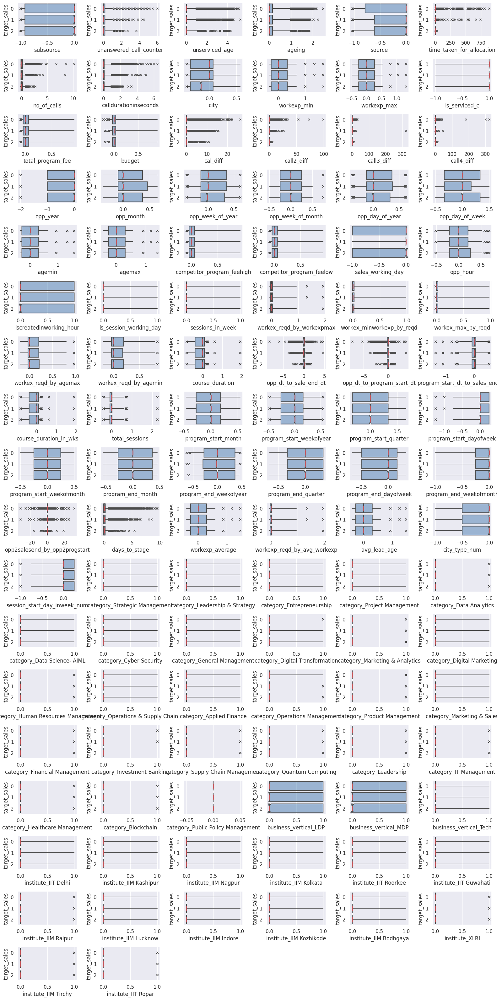

In [ ]:
fig = plt.figure(figsize=(16, 32))

for idx, feature in enumerate(feature_list):

    sub = fig.add_subplot(18,6,idx+1)
    sub.set_xlabel(feature)

    sns.boxplot(x = X_train_rs[feature],
                y = y_train_,
                order =  [0, 1, 2], orient = 'h',
                notch=True, showcaps=False,
                flierprops={"marker": "x"},
                boxprops={"facecolor": (.3, .5, .7, .5)},
                medianprops={"color": "r", "linewidth": 2},
                whis=[2.5, 97.5]
                )

plt.tight_layout()

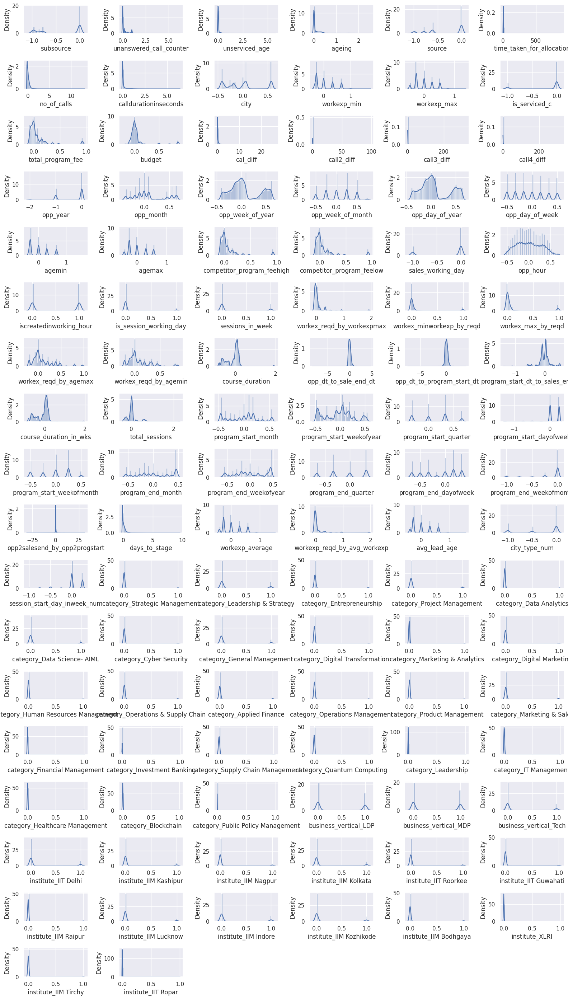

In [ ]:
# Lets see the distribution of our Scaled Data

fig = plt.figure(figsize=(16, 28))

for idx, feature in enumerate(feature_list):

    sub = fig.add_subplot(18,6,idx+1)
    sub.set_xlabel(feature)
    sns.distplot(X_train_rs[feature])

plt.tight_layout()


Lets define some helper functions to help analyze our model performance.

In [ ]:
y_val_.shape

(58958,)

In [ ]:
from google.colab import output

def SVD(train , test , val ,
        n_components = 3, seed = 42, chart = 'val', preds=False, preds_array=None):
    """
    Perform Truncated SVD dimensionality reduction and create a 3D scatter plot.

    Parameters:
    - train (list, optional): A list containing training data as [X_train, y_train].
    - test (list, optional): A list containing test data as [X_test, y_test].
    - val (list, optional): A list containing validation data as [X_val, y_val].
    - n_components (int, optional): Number of components for Truncated SVD.
    - seed (int, optional): Random seed for reproducibility.
    - chart (str, optional): Specifies the dataset to plot ('train', 'test', or 'val').
    - preds (bool, optional): If True, display predictions instead of actual labels (requires preds_array).
    - preds_array (array, optional): An array of predicted labels when preds is True.

    Usage:
    - SVD() displays a 3D scatter plot based on the specified dataset and chart choice.
    - When preds is True, preds_array must be provided to display predictions instead of actual labels.
    """

    output.enable_custom_widget_manager()
    %matplotlib widget

    tsvd = TruncatedSVD(n_components=n_components, random_state=seed)
    X_tr_rs =  tsvd.fit_transform(X = train[0])
    X_vl_rs = tsvd.transform(X = val[0])
    X_tst_rs  = tsvd.transform(X = test[0])

    fig = plt.figure()
    #ax = Axes3D(fig)

    ax = fig.add_subplot(111, projection='3d')
    colors = ['r', 'g', 'b']

    # Choose which data to display
    if chart == 'train':
        X = train[0]
        y = train[1]
        data = X_tr_rs
    elif chart == 'test':
        X = test[0]
        y = test[1]
        data = X_tst_rs
        if preds and preds_array is not None:
            assert test[1].shape == preds_array.shape
            chart = 'predictions'
            y = preds_array
    elif chart == 'val':
        X = val[0]
        y = val[1]
        data = X_vl_rs

    # TruncatedSVD components
    xs = data[:,0]
    ys = data[:,1]
    zs = data[:,2]

    for label in [0,1,2]:
        ax.scatter(xs[y == label], ys[y == label], zs[y == label], c=colors[label], label=f'Class {label}')
    #map = ax.scatter(xs = xs, ys = ys, zs = zs, color = y_train_)

    ax.set_title(f"3D {chart} data: Truncated SVD plot")
    ax.set_xlabel('x1')
    ax.set_ylabel('x2')
    ax.set_zlabel('x3')

    # displaying the plot
    plt.legend()
    plt.show();

In [ ]:

def cl_report(model, X_test = X_test, y_test = y_test, softmax_output = False):
    y_preds = model.predict(X_test)

    if softmax_output:
        y_pred_classes = np.argmax(y_preds, axis=1)
        #y_test_classes = np.argmax(y_test, axis =1)
    else:
        y_pred_classes = y_preds

    report = classification_report(y_test, y_pred_classes)
    confusion_mx = confusion_matrix(y_test, y_pred_classes)
    cm_norm = confusion_mx.astype('float') / confusion_mx.sum(axis=1)[:, np.newaxis]


    return report, confusion_mx, cm_norm, y_pred_classes

#### **Now lets try some ensemble algorithms with resampling to check feature importances.**
---
**Update:** So far, **sequence 5.3, Bayesian Optimized XGBoost Classifier on undersampled, feature eliminated data** provided the best predictions on the minority, revenue-generating class. ⚡⚡
- Re-run the Undersampling cells in sequences 5, 5.1 and all cells in sequence 5.3 to get the confusion matrix.

**1. Adaboost Classifier**

In [ ]:
ada = AdaBoostClassifier(n_estimators=200, random_state=42)
ada.fit(X_train_rs, y_train_)

In [ ]:
report, confusion_mx, cm_norm, _ = cl_report(ada, X_val_rs, y_val_)

In [ ]:
print(report)

              precision    recall  f1-score   support

           0       0.94      0.97      0.95     47426
           1       0.87      0.84      0.85     16160
           2       0.72      0.46      0.56      2742

    accuracy                           0.92     66328
   macro avg       0.84      0.76      0.79     66328
weighted avg       0.91      0.92      0.91     66328



In [ ]:
confusion_mx

array([[45956,  1268,   202],
       [ 2370, 13506,   284],
       [  749,   727,  1266]])

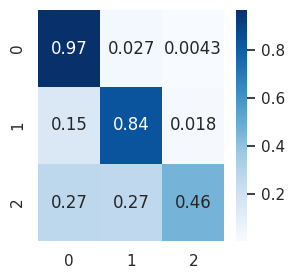

In [ ]:
plt.figure(figsize = (3,3))
sns.heatmap(cm_norm, annot=True, cmap='Blues');

**2. RandomForest Classifier**

In [ ]:
%%time
rf = RandomForestClassifier(n_estimators=200, max_depth=25 , random_state=42, verbose=1, n_jobs = -1)
rf.fit(X_train_rs, y_train_)
y_preds_rf = rf.predict(X_test_rs)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   56.5s
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:  4.2min finished
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    0.2s


CPU times: user 6min 43s, sys: 1.76 s, total: 6min 45s
Wall time: 4min 12s


[Parallel(n_jobs=2)]: Done 196 tasks      | elapsed:    1.1s
[Parallel(n_jobs=2)]: Done 200 out of 200 | elapsed:    1.1s finished


In [ ]:
report, confusion_mx, cm_norm, _ = cl_report(rf, X_val_rs, y_val_)

[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    2.7s
[Parallel(n_jobs=2)]: Done 196 tasks      | elapsed:   10.0s
[Parallel(n_jobs=2)]: Done 200 out of 200 | elapsed:   10.2s finished


In [ ]:
print(report)

              precision    recall  f1-score   support

           0       0.95      0.99      0.97     47426
           1       0.93      0.87      0.90     16160
           2       0.89      0.55      0.68      2742

    accuracy                           0.94     66328
   macro avg       0.92      0.80      0.85     66328
weighted avg       0.94      0.94      0.94     66328



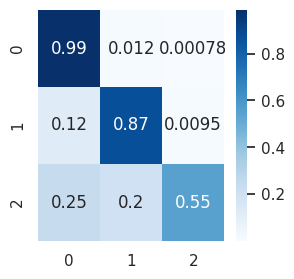

In [ ]:
plt.figure(figsize = (3,3))
sns.heatmap(cm_norm, annot=True, cmap='Blues');

In [ ]:
confusion_mx

array([[5207,   58,    4],
       [ 207, 1566,   23],
       [  68,   71,  166]])

The confusion matrix suggests that more than 50% of revenue-generating leads (class-2) are mis-classified into the neutral and negative class.

As a business, we would like to predict all class 2 and class 3 test samples correctly. We can afford to misclassify some class 0 and class 1 samples. It looks like over-representation of class 0 samples is responsible for the low predictive power of our model.

To achieve this, we would need to undersample from the majority class for our model-building.

**3. RandomForest Classifier fitted on ENN undersampled data**

In [ ]:
%%time
enn = EditedNearestNeighbours(sampling_strategy='majority', n_neighbors=8, kind_sel='mode', n_jobs = -1)
X_train_rs_enn, y_train_enn_ = enn.fit_resample(X_train_rs, y_train_)

CPU times: user 17min 45s, sys: 2.44 s, total: 17min 47s
Wall time: 11min 38s


In [ ]:
X_train_rs_enn.shape, X_train_rs.shape

((290225, 104), (294791, 104))

In [ ]:
%%time
rf_enn = RandomForestClassifier(n_estimators=200, max_depth=29 , random_state=42, verbose=1, n_jobs = -1)
rf_enn.fit(X_train_rs_enn, y_train_enn_)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   55.2s
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed:  3.7min


CPU times: user 6min 4s, sys: 2.28 s, total: 6min 6s
Wall time: 3min 47s


[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:  3.8min finished


RandomForestClassifier(max_depth=29, n_estimators=200, n_jobs=-1,
                       random_state=42, verbose=1)

In [ ]:
report, confusion_mx, cm_norm, _ = cl_report(rf_enn, X_val_rs, y_val_)

[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    1.0s
[Parallel(n_jobs=2)]: Done 196 tasks      | elapsed:    4.0s
[Parallel(n_jobs=2)]: Done 200 out of 200 | elapsed:    4.1s finished


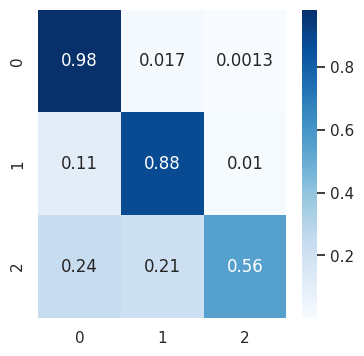

In [ ]:
plt.figure(figsize = (4,4))
sns.heatmap(cm_norm, annot=True, cmap='Blues');

**4. RandomForest Classifier fitted on Majority class NCR undersampled data**

In [ ]:
%%time
ncr = NeighbourhoodCleaningRule(sampling_strategy='majority', n_neighbors=8,kind_sel='mode', threshold_cleaning=0.00001, n_jobs=-1)
X_train_rs_ncr, y_train_ncr_ = ncr.fit_resample(X_train_rs, y_train_)

CPU times: user 18min 42s, sys: 2.71 s, total: 18min 45s
Wall time: 12min 27s


In [ ]:
X_train_rs_ncr.shape, X_train_rs.shape

((261643, 104), (294791, 104))

In [ ]:
%%time
rf_ncr = RandomForestClassifier(n_estimators=300, max_depth=120 , random_state=42, verbose=1, n_jobs=-1)
rf_ncr.fit(X_train_rs_ncr, y_train_ncr_)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   46.9s
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed:  3.3min


CPU times: user 7min 55s, sys: 3.01 s, total: 7min 58s
Wall time: 4min 59s


[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  5.0min finished


RandomForestClassifier(max_depth=120, n_estimators=300, n_jobs=-1,
                       random_state=42, verbose=1)

In [ ]:
report, confusion_mx, cm_norm, _ = cl_report(rf_ncr, X_val_rs, y_val_)

[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    1.7s
[Parallel(n_jobs=2)]: Done 196 tasks      | elapsed:    5.5s
[Parallel(n_jobs=2)]: Done 300 out of 300 | elapsed:    7.8s finished


In [ ]:
confusion_mx

array([[46258,   999,   169],
       [ 1642, 14356,   162],
       [  550,   581,  1611]])

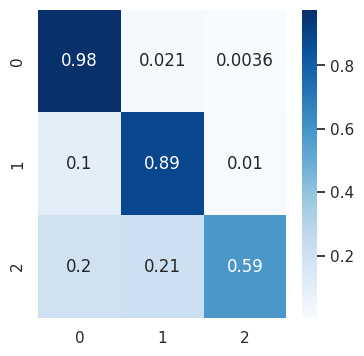

In [ ]:
plt.figure(figsize = (4,4))
sns.heatmap(cm_norm, annot=True, cmap='Blues');

**5. RandomForest Classifier fitted on Non-Minority classes NCR + Random undersampled data**

In [ ]:
%%time
## Undersampling: Run this cell before running sequence 5.1 a few cells below
ncr2 = NeighbourhoodCleaningRule(sampling_strategy ='not minority', n_neighbors=8, kind_sel='mode', threshold_cleaning=0.00001, n_jobs=-1)
X_train_rs_ncr2, y_train_ncr2_ = ncr2.fit_resample(X_train_rs, y_train_)

CPU times: user 17min 31s, sys: 1.68 s, total: 17min 32s
Wall time: 11min 28s


In [ ]:
%%time
sampling_dict = {}
sampling_dict[0], sampling_dict[1], sampling_dict[2] =int(y_train_ncr2_.value_counts()[0]//5.8), y_train_ncr2_.value_counts()[1], y_train_ncr2_.value_counts()[2]
display(sampling_dict)

rus = RandomUnderSampler(sampling_strategy = sampling_dict, random_state = 42)
X_train_rs_ncr2_rus, y_train_ncr2_rus_ = rus.fit_resample(X_train_rs_ncr2, y_train_ncr2_)

{0: 30625, 1: 31158, 2: 12188}

CPU times: user 194 ms, sys: 23.8 ms, total: 218 ms
Wall time: 238 ms


In [ ]:
X_train_rs_ncr2.shape, X_train_rs_ncr2_rus.shape, X_train_rs.shape, y_train_ncr2_rus_.value_counts()

((220975, 104),
 (73971, 104),
 (294791, 104),
 1    31158
 0    30625
 2    12188
 Name: target_sales, dtype: int64)

In [ ]:
%%time
rf = RandomForestClassifier(random_state=42, verbose = 1, n_jobs = -1)
skf = StratifiedKFold(shuffle=True, random_state=42, n_splits = 5)

param_space = {
    'n_estimators': [115, 119, 125],
    'max_depth': [ 19, 25]
}

rf_gridcv = GridSearchCV(
    rf,
    param_grid=param_space,
    n_jobs=-1,
    cv = skf,
    scoring='recall',
    verbose = 1
)
rf_gridcv.fit(X_train_rs_ncr2_rus, y_train_ncr2_rus_ )

Fitting 5 folds for each of 6 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    6.8s


CPU times: user 41.2 s, sys: 3.3 s, total: 44.5 s
Wall time: 9min 24s


[Parallel(n_jobs=-1)]: Done 115 out of 115 | elapsed:   20.0s finished


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
             estimator=RandomForestClassifier(n_jobs=-1, random_state=42,
                                              verbose=1),
             n_jobs=-1,
             param_grid={'max_depth': [19, 25],
                         'n_estimators': [115, 119, 125]},
             scoring='recall', verbose=1)

In [ ]:
best_params_ = rf_gridcv.best_params_
display(best_params_)

{'max_depth': 19, 'n_estimators': 115}

In [ ]:
rf_gridcv.best_estimator_

RandomForestClassifier(max_depth=19, n_estimators=115, n_jobs=-1,
                       random_state=42, verbose=1)

In [ ]:
report, confusion_mx, cm_norm, _ = cl_report(rf_gridcv.best_estimator_, X_val_rs, y_val_)

[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    1.9s
[Parallel(n_jobs=2)]: Done 115 out of 115 | elapsed:    4.6s finished


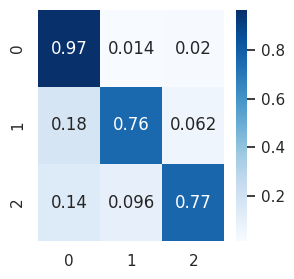

In [ ]:
plt.figure(figsize = (3,3))
sns.heatmap(cm_norm, annot=True, cmap='Blues');

In [ ]:
confusion_mx

array([[45829,   667,   930],
       [ 2858, 12300,  1002],
       [  379,   262,  2101]])

In [ ]:
print(report)

              precision    recall  f1-score   support

           0       0.93      0.97      0.95     47426
           1       0.93      0.76      0.84     16160
           2       0.52      0.77      0.62      2742

    accuracy                           0.91     66328
   macro avg       0.79      0.83      0.80     66328
weighted avg       0.92      0.91      0.91     66328



We will momentarily pause iterating over models and examine the feature importances of the best performing model so far, in order to further fine-tune it.

In [ ]:
f_imp = {}
for f, imp in zip(rf_gridcv.best_estimator_.feature_names_in_, rf_gridcv.best_estimator_.feature_importances_):
    f_imp[f] = imp

# Sort the dictionary by descending order of values
sorted_f_imp = sorted(f_imp.items(), key=lambda x: x[1], reverse=True)
sorted_f_imp

[('days_to_stage', 0.12031362408584503),
 ('unanswered_call_counter', 0.11074891819773881),
 ('ageing', 0.06407115555417574),
 ('is_serviced_c', 0.05305644128103419),
 ('source', 0.04809835032529799),
 ('unserviced_age', 0.04486637801882752),
 ('calldurationinseconds', 0.03802080580005035),
 ('subsource', 0.03159012183008698),
 ('no_of_calls', 0.031084877305678313),
 ('opp_dt_to_sale_end_dt', 0.02636617250467761),
 ('opp_day_of_year', 0.025295499282312325),
 ('program_start_weekofyear', 0.021558956693414042),
 ('opp_dt_to_program_start_dt', 0.02070320213272605),
 ('opp2salesend_by_opp2progstart', 0.01915332516151606),
 ('opp_week_of_year', 0.018463240146896917),
 ('cal_diff', 0.017988718375752617),
 ('budget', 0.016334876341696457),
 ('total_program_fee', 0.015541482379870722),
 ('competitor_program_feehigh', 0.014455844614478465),
 ('competitor_program_feelow', 0.014331633910771009),
 ('opp_month', 0.01327926228803776),
 ('total_sessions', 0.01321463777414395),
 ('workex_reqd_by_agemi

Among the non-onehot encoded features, the below features have the least feature importances, in ascending order
- call3_diff
- call2_diff
- call4_diff
- is_session_working_day
- sessions_in_week
- session_start_day_inweek_num
- program_end_weekofmonth
- program_start_dayofweek
- program_end_quarter
- sales_working_day
- agemax
- agemin
- avg_lead_age
- program_start_weekofmonth
- workexp_min
- workexp_max
- workexp_average
- program_end_dayofweek
- program_start_quarter
- program_end_month
- workex_reqd_by_workexpmax


**5.1 RandomForest Classifier fitted on Majority class TomekLinks undersampled data, with feature elimination**
- Run undersampling cell in sequence 5 before running the cells in this section

In [ ]:
feature_droplist = ['call3_diff', 'call2_diff', 'call4_diff', 'is_session_working_day', 'sessions_in_week', 'session_start_day_inweek_num',
 'program_end_weekofmonth', 'program_start_dayofweek', 'program_end_quarter', 'sales_working_day',
 'agemax', 'agemin', 'avg_lead_age', 'program_start_weekofmonth', 'workexp_min', 'workexp_max', 'workexp_average',
  'program_end_dayofweek', 'program_start_quarter', 'program_end_month', 'workex_reqd_by_workexpmax']


feature_droplist2 = ['agemax', 'workexp_average', 'workexp_min', 'time_taken_for_allocation', 'sales_working_day', 'sessions_in_week',
                     'call3_diff', 'call2_diff', 'call4_diff']

feature_droplist3 = ['program_end_quarter', 'sales_working_day', 'sessions_in_week',  'call2_diff', 'call3_diff', 'call4_diff']

X_train_rs_rus_fdrop = X_train_rs_ncr2_rus.drop(feature_droplist3, axis = 1)

X_test_rs_fdrop = X_test_rs.drop(feature_droplist3, axis = 1)
X_val_rs_fdrop = X_val_rs.drop(feature_droplist3, axis = 1)

#X_train_rs_ncr2_fdrop = X_train_rs_ncr2.drop(feature_droplist3, axis = 1) #, y_train_ncr2_

In [ ]:
%%time
tomek_2 = TomekLinks(sampling_strategy='not minority', n_jobs=-1)
X_train_rs_tomek2, y_train_tomek2_ = tomek_2.fit_resample(X_train_rs_rus_fdrop, y_train_ncr2_rus_)

CPU times: user 1min 3s, sys: 90.4 ms, total: 1min 3s
Wall time: 37.8 s


In [ ]:
adasyn = ADASYN(sampling_strategy='minority', random_state=42, n_neighbors = 5, n_jobs=-1)
X_train_rs_tomek2_ada, y_train_tomek2_ada_  = adasyn.fit_resample(X_train_rs_tomek2, y_train_tomek2_ )

In [ ]:
y_train_tomek2_ada_.value_counts()

2    31743
1    30820
0    30087
Name: target_sales, dtype: int64

In [ ]:
%%time
rf = RandomForestClassifier(random_state=42, verbose = 1, n_jobs = -1)
skf = StratifiedKFold(shuffle=True, random_state=42, n_splits = 5)

param_space = {
    'n_estimators': [115, 120, 125, 130, 135, 140, 145, 150, 175, 200, 225],
    'max_depth': [ 19, 20, 25, 30, 35, 40, 45]
}

rf_gridcv_tomek2 = GridSearchCV(
    rf,
    param_grid=param_space,
    n_jobs=-1,
    cv = skf,
    scoring='recall',
    verbose = 1
)
rf_gridcv_tomek2.fit(X_train_rs_tomek2_ada, y_train_tomek2_ada_ )

Fitting 5 folds for each of 77 candidates, totalling 385 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    6.7s


CPU times: user 1min 15s, sys: 8.31 s, total: 1min 24s
Wall time: 2h 9min 48s


[Parallel(n_jobs=-1)]: Done 115 out of 115 | elapsed:   17.3s finished


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
             estimator=RandomForestClassifier(n_jobs=-1, random_state=42,
                                              verbose=1),
             n_jobs=-1,
             param_grid={'max_depth': [19, 20, 25, 30, 35, 40, 45],
                         'n_estimators': [115, 120, 125, 130, 135, 140, 145,
                                          150, 175, 200, 225]},
             scoring='recall', verbose=1)

In [ ]:
rf_gridcv_tomek2.best_params_

{'max_depth': 19, 'n_estimators': 115}

[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    0.7s
[Parallel(n_jobs=2)]: Done 115 out of 115 | elapsed:    1.7s finished


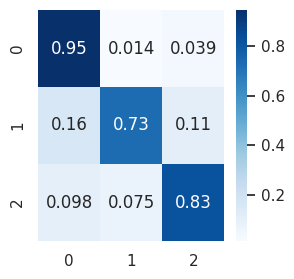

In [ ]:
rf_gridcv_tomek2_best = rf_gridcv_tomek2.best_estimator_
report_tomek2, confusion_mx_tomek2, cm_norm_tomek2, _ = cl_report(rf_gridcv_tomek2_best, X_val_rs_fdrop, y_val_)

plt.figure(figsize = (3,3))
sns.heatmap(cm_norm_tomek2, annot=True, cmap='Blues');

In [ ]:
%%time
rf_tomek2 = RandomForestClassifier(n_estimators=115, max_depth=19 , random_state=42, verbose=1, n_jobs = -1)
rf_tomek2.fit(X_train_rs_tomek2_ada, y_train_tomek2_ada_)#fit(X_train_rs_tomek2, y_train_tomek2_)
y_preds_rf_tomek2 = rf_tomek2.predict(X_val_rs_fdrop)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    8.0s
[Parallel(n_jobs=-1)]: Done 115 out of 115 | elapsed:   19.3s finished
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    0.4s


CPU times: user 32.1 s, sys: 135 ms, total: 32.3 s
Wall time: 20.3 s


[Parallel(n_jobs=2)]: Done 115 out of 115 | elapsed:    0.9s finished


In [ ]:
X_train_rs_tomek2_ada.shape, X_val_rs_fdrop.shape

((92650, 98), (58958, 98))

In [ ]:
report, confusion_mx, cm_norm, _ = cl_report(rf_tomek2, X_val_rs_fdrop, y_val_)

[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    0.4s
[Parallel(n_jobs=2)]: Done 115 out of 115 | elapsed:    0.9s finished


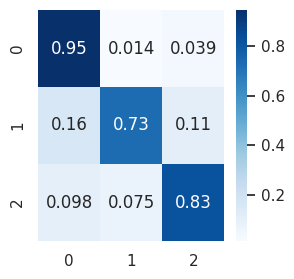

In [ ]:
plt.figure(figsize = (3,3))
sns.heatmap(cm_norm, annot=True, cmap='Blues');

In [ ]:
print(report)

              precision    recall  f1-score   support

           0       0.94      0.95      0.94     42156
           1       0.93      0.73      0.82     14365
           2       0.38      0.83      0.52      2437

    accuracy                           0.89     58958
   macro avg       0.75      0.83      0.76     58958
weighted avg       0.91      0.89      0.90     58958



In [ ]:
confusion_mx

array([[39928,   587,  1641],
       [ 2315, 10469,  1581],
       [  240,   183,  2014]])

In [ ]:
import joblib
joblib.dump(rf_tomek2, 'rf_tomek2_seq_5.1.pkl')

['rf_tomek2_seq_5.1.pkl']

**5.2 Bayesian Optimization with XGBoostClassifier on Not-Minority class TomekLinks undersampled data, with feature elimination**

In [ ]:
# Deleting in-memory variables
del(X_train_rs)
del(y_train_)
del(X_train_rs_ncr2_rus)
del(y_train_ncr2_rus_)
del(X_train_rs_rus_fdrop)
del(X_train_rs_tomek2)
del(y_train_tomek2_)

In [ ]:
X_train_rs_tomek2_ada.shape, X_val_rs_fdrop.shape,X_test_rs_fdrop.shape

((92650, 98), (58958, 98), (14740, 98))

In [ ]:
from sklearn.metrics import accuracy_score, log_loss
from xgboost import cv, DMatrix

# Define the objective function for Bayesian optimization
def xgb_cv(params):

    max_depth = int(params['max_depth'])
    n_estimators = int(params['n_estimators'])
    learning_rate = params['learning_rate']
    gamma = params['gamma']
    min_child_weight = params['min_child_weight']
    subsample = params['subsample']
    colsample_bytree = params['colsample_bytree']
    reg_lambda =  params['reg_lambda']
    reg_alpha = params['reg_alpha']

    clf = XGBClassifier(
        max_depth=max_depth,
        n_estimators=n_estimators,
        learning_rate=learning_rate,
        gamma=gamma,
        min_child_weight=min_child_weight,
        subsample=subsample,
        colsample_bytree=colsample_bytree,
        reg_lambda = reg_lambda,
        reg_alpha = reg_alpha,
        objective='multi:softprob',
        num_class=4,
        seed = 42
    )

    clf.fit(X_train_rs_tomek2_ada, y_train_tomek2_ada_)
    y_prob = clf.predict_proba(X_val_rs_fdrop)

    accuracy = accuracy_score(y_val_, np.argmax(y_prob, axis=1))
    loss = log_loss(y_val_, y_prob)

    # Combine accuracy and negative log loss for optimization
    score = -loss #

    return {'loss': -score, 'params':params, 'status': STATUS_OK}

# Define the search space for hyperparameters
space = {
    'max_depth': hp.quniform('max_depth', 5, 1200, 1),
    'n_estimators': hp.quniform('n_estimators', 30, 1800, 10),
    'learning_rate': hp.uniform('learning_rate', 1e-8, 0.5),
    'gamma': hp.uniform('gamma', 0, 1000),
    'min_child_weight': hp.uniform('min_child_weight', 0, 1000),
    'subsample': hp.uniform('subsample', 0.1, 1),
    'colsample_bytree': hp.uniform('colsample_bytree', 0.1, 1),
    'reg_lambda': hp.uniform('reg_lambda', 0, 1000),
    'reg_alpha': hp.uniform('reg_alpha', 0, 1000),
}

ic("Parameter space is defined...")
ic("Classifier initialized, objective function defined...")

ic| 'Parameter space is defined...'
ic| 'Classifier initialized, objective function defined...'


'Classifier initialized, objective function defined...'

In [ ]:
# Perform Bayesian optimization using hyperopt
trials = Trials()
best = fmin(fn=xgb_cv, space=space, algo=tpe.suggest, max_evals=50, trials=trials)

100%|██████████| 50/50 [48:15<00:00, 57.90s/trial, best loss: 0.31573332633656204]


In [ ]:
# Print the best hyperparameters and corresponding accuracy and loss
display("Best Hyperparameters:", best)
best_params = space_eval(space, best)
best_loss = -trials.best_trial['result']['loss'] # Revert negation
display("Best Score (Val Acc):", best_loss)

'Best Hyperparameters:'

{'colsample_bytree': 0.5965894771985133,
 'gamma': 7.815841538764744,
 'learning_rate': 0.4011135569116187,
 'max_depth': 1046.0,
 'min_child_weight': 965.478732442725,
 'n_estimators': 1600.0,
 'reg_alpha': 1.384634322120803,
 'reg_lambda': 97.49357570464684,
 'subsample': 0.8933993880850252}

'Best Score (Val Acc):'

-0.31573332633656204

In [ ]:
best_params

{'colsample_bytree': 0.5965894771985133,
 'gamma': 7.815841538764744,
 'learning_rate': 0.4011135569116187,
 'max_depth': 1046.0,
 'min_child_weight': 965.478732442725,
 'n_estimators': 1600.0,
 'reg_alpha': 1.384634322120803,
 'reg_lambda': 97.49357570464684,
 'subsample': 0.8933993880850252}

**5.3 Refitting XGBoost Classifier with the best hyperparameters and re-evaluating**

In [ ]:
'''
train = pd.concat((X_train_rs_tomek2, y_train_tomek2_), axis = 1)
val = pd.concat((X_val_rs_fdrop, y_val_), axis = 1)
test = pd.concat((X_test_rs_fdrop, y_test_), axis = 1)

train.to_csv('seq_5.3_train.csv')
val.to_csv('seq_5.3_val.csv')
test.to_csv('seq_5.3_test.csv')

from google.colab import files
files.download('seq_5.3_train.csv')
files.download('seq_5.3_val.csv')
files.download('seq_5.3_test.csv')

'''

In [ ]:
# Best parameters for different sets of parameter space and objective functions

# Optimized to minimize loss
best_params_loss = {'colsample_bytree': 0.6646203565022286,
 'gamma': 0.4106678066692626,
 'learning_rate': 0.1458386340131344,
 'max_depth': 60,
 'min_child_weight': 28.096715926177684,
 'n_estimators': 340,
 'reg_alpha': 65.3825572222225,
 'reg_lambda': 44.49585242261955,
 'subsample': 0.9167685875947618}

best_params_loss2 = {'colsample_bytree': 0.6938881718908119,
           'gamma': 5.798129399101947,
           'learning_rate': 0.03748659229108325,
           'max_depth': 15,
           'min_child_weight': 4.8519176050558555,
           'n_estimators': 560,
           'reg_alpha': 36.38081831560322,
           'reg_lambda': 258.43195794466374,
           'subsample': 0.6928236684703111}

best_params_loss3 = {'colsample_bytree': 0.21985657395735825,
 'gamma': 4.72815284270267,
 'learning_rate': 0.4978969414816197,
 'max_depth': 182,
 'min_child_weight': 26.589626828074294,
 'n_estimators': 1560,
 'reg_alpha': 24.253837167582432,
 'reg_lambda': 19.512832653488488,
 'subsample': 0.8464382828518309}

best_params_loss4 = {'colsample_bytree': 0.8460861879479679,
           'gamma': 0.9895001489812181,
           'learning_rate': 0.49961152747498777,
           'max_depth': 207,
           'min_child_weight': 278.58609195366176,
           'n_estimators': 730,
           'reg_alpha': 2.540525354562803,
           'reg_lambda': 249.77819321895348,
           'subsample': 0.5402680192521272}
best_params_loss5 = {'colsample_bytree': 0.9781518520806447,
 'gamma': 12.5148038634929,
 'learning_rate': 0.21387964131550682,
 'max_depth': 1192,
 'min_child_weight': 774.1372451434486,
 'n_estimators': 610,
 'reg_alpha': 6.649385171338999,
 'reg_lambda': 549.3537899423669,
 'subsample': 0.7486242901062343}

best_params_loss6 = {'colsample_bytree': 0.6857096982017185,
 'gamma': 0.7195150563990893,
 'learning_rate': 0.3353420093093012,
 'max_depth': 1152,
 'min_child_weight': 756.541008753593,
 'n_estimators': 1640,
 'reg_alpha': 2.401735443760799,
 'reg_lambda': 159.31162068958247,
 'subsample': 0.7298542325142391}

best_params_loss7 = {'colsample_bytree': 0.6937937341745267,
 'gamma': 2.2707432967339187,
 'learning_rate': 0.403160299806411,
 'max_depth': 202,
 'min_child_weight': 430.04685612716844,
 'n_estimators': 1590,
 'reg_alpha': 561.9507284520455,
 'reg_lambda': 132.79038993708355,
 'subsample': 0.8489830786409146}

best_params_loss8 = {'colsample_bytree': 0.5965894771985133,
 'gamma': 7.815841538764744,
 'learning_rate': 0.4011135569116187,
 'max_depth': 1046,
 'min_child_weight': 965.478732442725,
 'n_estimators': 1600,
 'reg_alpha': 1.384634322120803,
 'reg_lambda': 97.49357570464684,
 'subsample': 0.8933993880850252}

# Optimize to maximize validation accuracy
best_params_acc = {'colsample_bytree': 0.898229828495429,
 'gamma': 0.11578514867504808,
 'learning_rate': 0.08053834574147835,
 'max_depth': 88,
 'min_child_weight': 185.82598648375006,
 'n_estimators': 1000,
 'reg_alpha': 347.7775146604022,
 'reg_lambda': 173.0124473244319,
 'subsample': 0.9162122374640492}

# Optimized to maximize the diffecence bw Val acc and val loss
best_params_acc_loss = {'colsample_bytree': 0.9881686324905117,
 'gamma': 0.9325320163251614,
 'learning_rate': 0.20551319042274457,
 'max_depth': 124,
 'min_child_weight': 14.211988908246,
 'n_estimators': 260,
 'reg_alpha': 75.08348501092378,
 'reg_lambda': 73.11787976372189,
 'subsample': 0.8536271835001615}

In [ ]:
%%time
xgb_refit = XGBClassifier(**best_params_loss,
                          objective='multi:softprob',
                          num_class=3,
                          seed = 42)

xgb_refit.fit(X_train_rs_tomek2_ada, y_train_tomek2_ada_)

y_prob = xgb_refit.predict_proba(X_test_rs_fdrop)
report, cmx, cm_norm, ypred = cl_report(xgb_refit, X_test_rs_fdrop, y_test_)
cmx

CPU times: user 43.7 s, sys: 98.8 ms, total: 43.8 s
Wall time: 31.6 s


array([[10023,   139,   377],
       [  431,  2840,   320],
       [   45,    56,   509]])

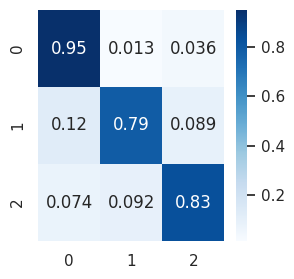

In [ ]:
plt.figure(figsize = (3,3))
sns.heatmap(cm_norm, annot=True, cmap='Blues');

In [ ]:
%%capture
!pip install joblib

In [ ]:
xgb_best = joblib.load('XGBClf_Bayesian_seq_5.3.pkl')
xgb_best

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.5965894771985133, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=7.815841538764744,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.4011135569116187,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=1046, max_leaves=None,
              min_child_weight=965.478732442725, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=1600,
              n_jobs=None, num_class=3, num_parallel_tree=None, ...)

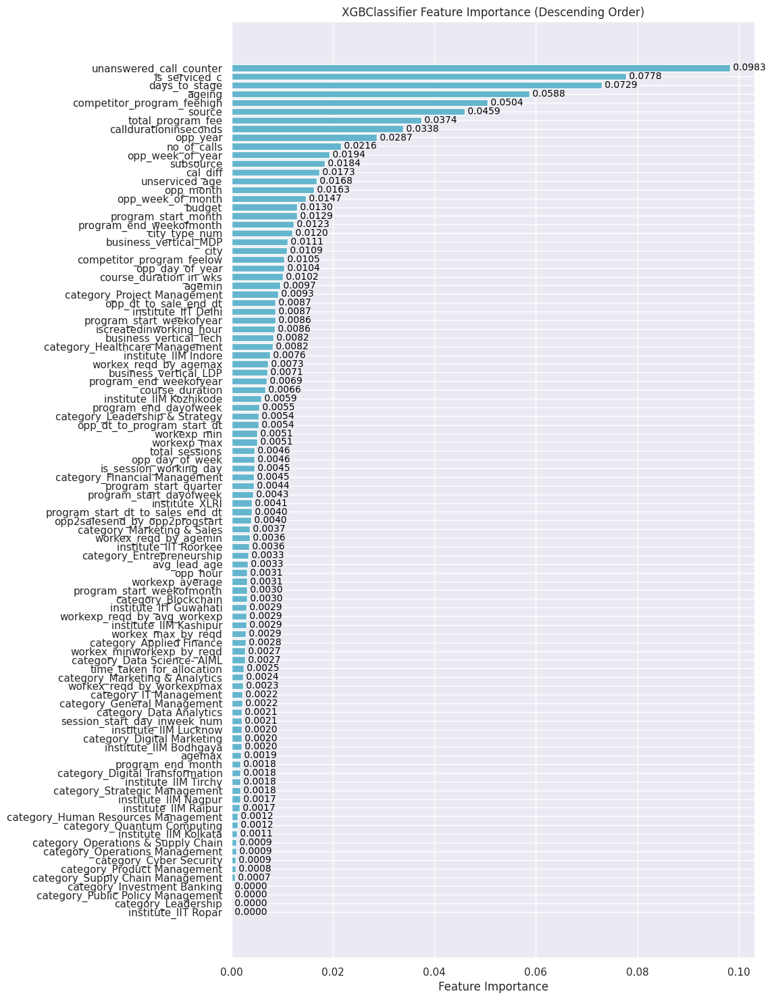

In [ ]:
importance = xgb_refit.feature_importances_
features = X_train_rs_tomek2_ada.columns


# Sort features and importance values in descending order
sorted_idx = importance.argsort()[::-1]
sorted_features = [features[i] for i in sorted_idx]
sorted_importance = [importance[i] for i in sorted_idx]

# Create a horizontal bar chart for feature importance
plt.figure(figsize=(10, 18))
plt.barh(sorted_features, sorted_importance, color='c')
plt.xlabel('Feature Importance')
plt.title('XGBClassifier Feature Importance (Descending Order)')
plt.gca().invert_yaxis()

for i, v in enumerate(sorted_importance):
    plt.text(v, i, f' {v:.4f}', va='center', fontsize=10, color='black')
plt.show();

In [ ]:
sorted_features

['unanswered_call_counter',
 'is_serviced_c',
 'days_to_stage',
 'ageing',
 'competitor_program_feehigh',
 'source',
 'total_program_fee',
 'calldurationinseconds',
 'opp_year',
 'no_of_calls',
 'opp_week_of_year',
 'subsource',
 'cal_diff',
 'unserviced_age',
 'opp_month',
 'opp_week_of_month',
 'budget',
 'program_start_month',
 'program_end_weekofmonth',
 'city_type_num',
 'business_vertical_MDP',
 'city',
 'competitor_program_feelow',
 'opp_day_of_year',
 'course_duration_in_wks',
 'agemin',
 'category_Project Management',
 'opp_dt_to_sale_end_dt',
 'institute_IIT Delhi',
 'program_start_weekofyear',
 'iscreatedinworking_hour',
 'business_vertical_Tech',
 'category_Healthcare Management',
 'institute_IIM Indore',
 'workex_reqd_by_agemax',
 'business_vertical_LDP',
 'program_end_weekofyear',
 'course_duration',
 'institute_IIM Kozhikode',
 'program_end_dayofweek',
 'category_Leadership & Strategy',
 'opp_dt_to_program_start_dt',
 'workexp_min',
 'workexp_max',
 'total_sessions',
 'o

In [ ]:
least_fimp_0 = ['workexp_average',  'avg_lead_age',  'agemax', 'avg_lead_age',
              'call2_diff', 'call3_diff', 'call4_diff']
least_fimp = ['is_session_working_day',
 'competitor_program_feelow',
 'agemin',
 'call4_diff',
 'call3_diff',
 'call2_diff',
 'institute_IIT Ropar',
 'program_start_quarter',
 'workexp_average',
 'avg_lead_age',
 'session_start_day_inweek_num',
 'program_end_quarter']

least_fimp1 = ['opp_hour',
 'institute_IIM Lucknow',
 'workexp_reqd_by_avg_workexp',
 'program_start_dayofweek',
 'institute_IIM Kashipur',
 'institute_IIM Indore',
 'category_Marketing & Sales',
 'workex_max_by_reqd',
 'workex_reqd_by_workexpmax',
 'institute_IIM Kolkata',
 'institute_IIM Kozhikode',
 'category_Data Science- AIML',
 'city_type_num',
 'sessions_in_week',
 'iscreatedinworking_hour',
 'sales_working_day',
 'agemin',
 'call4_diff',
 'call3_diff',
 'call2_diff',
 'workexp_max',
 'institute_IIT Ropar',
 'workex_reqd_by_agemax',
 'program_start_weekofmonth',
 'category_Investment Banking',
 'category_Supply Chain Management',
 'category_Quantum Computing',
 'category_Leadership',
 'category_IT Management',
 'category_Healthcare Management',
 'category_Blockchain',
 'category_Public Policy Management',
 'business_vertical_LDP',
 'institute_IIM Nagpur',
 'institute_IIT Roorkee',
 'institute_IIT Guwahati',
 'institute_IIM Raipur',
 'institute_IIM Bodhgaya',
 'institute_XLRI',
 'category_Financial Management',
 'category_Product Management',
 'category_Operations Management',
 'category_Data Analytics',
 'program_end_month',
 'institute_IIM Tirchy',
 'workexp_average',
 'avg_lead_age',
 'session_start_day_inweek_num',
 'category_Strategic Management',
 'category_Cyber Security',
 'category_Applied Finance',
 'category_General Management',
 'category_Digital Transformation',
 'category_Marketing & Analytics',
 'category_Digital Marketing',
 'category_Human Resources Management',
 'category_Operations & Supply Chain',
 'program_end_quarter']

least_fimp2 =  [ 'institute_IIT Delhi',
 'opp_year',
 'course_duration',
 'time_taken_for_allocation',
 'is_session_working_day',
 'category_Project Management',
 'program_end_dayofweek',
 'category_Entrepreneurship',
 'workexp_min',
 'opp2salesend_by_opp2progstart',
 'program_start_weekofyear',
 'course_duration_in_wks',
 'business_vertical_MDP',
 'program_start_dt_to_sales_end_dt',
 'workex_minworkexp_by_reqd',
 'opp_day_of_week',
 'competitor_program_feelow',
 'program_start_month',
 'program_start_quarter',
 'opp_dt_to_program_start_dt',
 'opp_week_of_month',
 'opp_dt_to_sale_end_dt',
 'category_Leadership & Strategy',
 'opp_hour',
 'institute_IIM Lucknow',
 'workexp_reqd_by_avg_workexp',
 'program_start_dayofweek',
 'institute_IIM Kashipur',
 'institute_IIM Indore',
 'category_Marketing & Sales',
 'workex_max_by_reqd',
 'workex_reqd_by_workexpmax',
 'institute_IIM Kolkata',
 'institute_IIM Kozhikode',
 'category_Data Science- AIML',
 'city_type_num',
 'sessions_in_week',
 'iscreatedinworking_hour',
 'sales_working_day',
 'agemin',
 'call4_diff',
 'call3_diff',
 'call2_diff',
 'workexp_max',
 'institute_IIT Ropar',
 'workex_reqd_by_agemax',
 'program_start_weekofmonth',
 'category_Investment Banking',
 'category_Supply Chain Management',
 'category_Quantum Computing',
 'category_Leadership',
 'category_IT Management',
 'category_Healthcare Management',
 'category_Blockchain',
 'category_Public Policy Management',
 'business_vertical_LDP',
 'institute_IIM Nagpur',
 'institute_IIT Roorkee',
 'institute_IIT Guwahati',
 'institute_IIM Raipur',
 'institute_IIM Bodhgaya',
 'institute_XLRI',
 'category_Financial Management',
 'category_Product Management',
 'category_Operations Management',
 'category_Data Analytics',
 'program_end_month',
 'institute_IIM Tirchy',
 'workexp_average',
 'avg_lead_age',
 'session_start_day_inweek_num',
 'category_Strategic Management',
 'category_Cyber Security',
 'category_Applied Finance',
 'category_General Management',
 'category_Digital Transformation',
 'category_Marketing & Analytics',
 'category_Digital Marketing',
 'category_Human Resources Management',
 'category_Operations & Supply Chain',
 'program_end_quarter']

least_fimp3 = [  'institute_IIM Bodhgaya',
 'institute_XLRI',
 'institute_IIT Guwahati',
 'institute_IIM Lucknow',
 'category_Blockchain',
 'category_Public Policy Management',
 'institute_IIM Raipur',
 'institute_IIM Nagpur',
 'institute_IIM Kolkata',
 'institute_IIT Roorkee',
 'category_Operations & Supply Chain',
 'category_Leadership',
 'category_Healthcare Management',
 'category_Strategic Management',
 'category_Digital Marketing',
 'category_Marketing & Analytics',
 'category_Digital Transformation',
 'category_Applied Finance',
 'category_Cyber Security',
 'category_Data Science- AIML',
 'category_Data Analytics',
 'category_Project Management',
 'category_Entrepreneurship',
 'session_start_day_inweek_num',
 'category_IT Management',
 'category_Operations Management',
 'institute_IIM Tirchy',
 'category_Product Management',
 'category_Marketing & Sales',
 'category_Financial Management',
 'category_Investment Banking',
 'category_Supply Chain Management',
 'category_Quantum Computing',
 'category_Human Resources Management',
 'institute_IIT Ropar']

**Examine Feature Contributions and Feature Interactions visually.**
- Three plots for each of the target class, each plot representing a one-vs-all approach.

How to work with these plots?
- The y-axis has the prdict_proba value as f(x) and the X-axis represents each of the test-samples.
- The boundary between red and blue areas joins the f(x) values.
- For each sample along X, the features in blue area represent negative contributions and those in red represent positive contributions for predictions.
> - Select an effect along the y-axis dropdown menu and select a feature on the X-axis menu (at the top of each plot) to understand feature interaction and feature contributions to predictions.


In [ ]:
%%capture
!pip install eli5 ipympl
import eli5 ipympl

In [ ]:
X = X_train_rs_tomek2_ada.loc[:100]
y = y_train_tomek2_ada_.loc[:100]

eli5_explanation = eli5.explain_weights(xgb_refit, feature_names=X.columns.tolist())
eli5_explanation

Weight,Feature
0.0983,unanswered_call_counter
0.0778,is_serviced_c
0.0729,days_to_stage
0.0588,ageing
0.0504,competitor_program_feehigh
0.0459,source
0.0374,total_program_fee
0.0338,calldurationinseconds
0.0287,opp_year
0.0216,no_of_calls


In [ ]:
shap.initjs()
explainer = shap.TreeExplainer(xgb_refit)
shap_values = explainer.shap_values(X_test_rs_fdrop[:50])
for class_index in [0,1,2]:
    display(shap.force_plot(explainer.expected_value[class_index], shap_values[class_index], X))

In [ ]:
SVD(train = [X_train_rs_tomek2_ada, y_train_tomek2_ada_],
    test = [X_test_rs_fdrop, y_test_],
    val = [X_val_rs_fdrop, y_val_], n_components = 3, seed = 42, chart = 'train')
SVD(train = [X_train_rs_tomek2_ada, y_train_tomek2_ada_],
    test = [X_test_rs_fdrop, y_test_],
    val = [X_val_rs_fdrop, y_val_], n_components = 3, seed = 42, chart = 'val')
SVD(train = [X_train_rs_tomek2_ada, y_train_tomek2_ada_],
    test = [X_test_rs_fdrop, y_test_],
    val = [X_val_rs_fdrop, y_val_], n_components = 3, seed = 42, chart = 'test')
SVD(train = [X_train_rs_tomek2_ada, y_train_tomek2_ada_],
    test = [X_test_rs_fdrop, y_test_],
    val = [X_val_rs_fdrop, y_val_], n_components = 3, seed = 42, chart = 'test', preds = True, preds_array = ypred)

In [ ]:
%matplotlib inline

**6. RandomForest Classifier fitted on Majority class TomekLinks undersampled data**

In [ ]:
%%time
tomek = TomekLinks(sampling_strategy='majority', n_jobs=-1)
X_train_rs_tomek, y_train_tomek_ = tomek.fit_resample(X_train_rs, y_train_)

CPU times: user 24min 9s, sys: 2.79 s, total: 24min 11s
Wall time: 15min 5s


In [ ]:
%%time
rf_tomek = RandomForestClassifier(n_estimators=300, max_depth=120 , random_state=42, verbose=1, n_jobs = -1)
rf_tomek.fit(X_train_rs_tomek, y_train_tomek_)
y_preds_rf_tomek = rf_tomek.predict(X_test_rs)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   41.7s
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  4.9min finished
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    0.2s
[Parallel(n_jobs=2)]: Done 196 tasks      | elapsed:    1.0s


CPU times: user 7min 57s, sys: 3.43 s, total: 8min
Wall time: 4min 53s


[Parallel(n_jobs=2)]: Done 300 out of 300 | elapsed:    1.4s finished


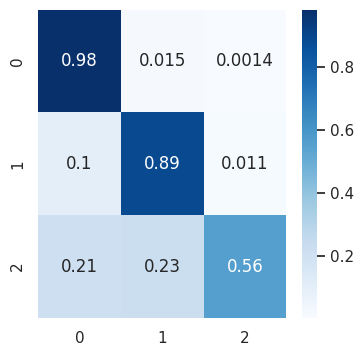

In [ ]:
cm = confusion_matrix(y_test_.astype('int'), y_preds_rf_tomek.astype('int'))
cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
plt.figure(figsize = (4,4))
sns.heatmap(cmn, annot=True, cmap='Blues');

In [ ]:
cm

array([[10363,   161,    15],
       [  358,  3194,    39],
       [  130,   138,   342]])

**7.  RandomForest Classifier fitted on Non-Minority class NCR undersampled data, with feature elimination**

In [ ]:
%%time
ncr2 = NeighbourhoodCleaningRule(sampling_strategy ='not minority', n_neighbors=8, kind_sel='mode', threshold_cleaning=0.0000001, n_jobs=-1)
X_train_rs_ncr2_fdrop, y_train_ncr2_fdrop_ = ncr2.fit_resample(X_train_rs_fdrop, y_train_)

CPU times: user 39min 21s, sys: 4.3 s, total: 39min 25s
Wall time: 25min 10s


In [ ]:
X_train_rs_ncr2_fdrop.shape, X_train_rs_fdrop.shape

((323263, 83), (396761, 83))

In [ ]:
%%time
rf_ncr2_fdrop = RandomForestClassifier(n_estimators=300, max_depth=120 , random_state=42, verbose=1, n_jobs = -1)
rf_ncr2_fdrop.fit(X_train_rs_ncr2_fdrop, y_train_ncr2_fdrop_)
y_preds_rf_ncr2_fdrop = rf_ncr2_fdrop.predict(X_test_rs_fdrop)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   51.8s
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  5.7min finished
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    0.5s
[Parallel(n_jobs=2)]: Done 196 tasks      | elapsed:    2.0s


CPU times: user 9min 30s, sys: 2.57 s, total: 9min 32s
Wall time: 5min 47s


[Parallel(n_jobs=2)]: Done 300 out of 300 | elapsed:    3.7s finished


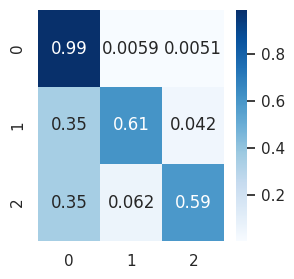

In [ ]:
cm = confusion_matrix(y_test_.astype('int'), y_preds_rf_ncr2_fdrop.astype('int'))
cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
plt.figure(figsize = (4,4))
sns.heatmap(cmn, annot=True, cmap='Blues');

**8. Artificial Neural Networks**

I will use the data fitted for the best performing model so far (XGBClassifier) and drop a few more features.

In [ ]:
from keras_tuner import HyperModel
from keras_tuner.tuners import RandomSearch, Hyperband
import IPython

In [ ]:
def plot_performance(history,
                     xlims_loss = False, ylims_loss = False,
                     xlims_acc = False, ylims_acc = False,
                     loss_incr = 0.1, acc_incr=0.1,
                     xticks_loss = list(), yticks_loss = list(),
                     xticks_acc = list(), yticks_acc = list()
                    ):
    training_loss = history.history['loss']
    val_loss = history.history['val_loss']
    training_acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']

    plt.figure(figsize=(12, 4))

    plt.subplot(1,2,1)
    plt.plot(training_loss,'b-', label = 'Training Loss')
    plt.plot(val_loss, 'r-', label = 'Validation Loss')

    if xlims_loss:
        plt.xticks(np.arange(*xticks_loss, loss_incr))
    if ylims_loss:
        plt.yticks(np.arange(*yticks_loss, loss_incr))

    plt.legend()
    plt.title('Loss')

    plt.subplot(1,2,2)
    plt.plot(training_acc,'b-', label = 'Training Accuracy')
    plt.plot(val_acc, 'r-', label = 'Validation Accuracy')

    if xlims_acc:
        plt.xticks(np.arange(*xticks_acc, acc_incr))
    if ylims_acc:
        plt.yticks(np.arange(*yticks_acc, acc_incr))

    plt.legend()
    plt.title('Accuracy')

    plt.tight_layout()
    plt.show();

In [ ]:
X_train, y_train = X_train_rs_tomek2_ada.drop(least_fimp3, axis =1), to_categorical(y_train_tomek2_ada_) #X_train_rs_tomek2_ada, y_train_tomek2_ada_
X_val,  y_val = X_val_rs_fdrop.drop(least_fimp3, axis =1), to_categorical(y_val_)
X_test, y_test = X_test_rs_fdrop.drop(least_fimp3, axis =1), y_test_

**8.1. Baseline Model**

In [ ]:
def model_zero(X_train = X_train):

    model = Sequential()
    model.add(Dense(450, activation = 'relu', input_shape = (X_train.shape[1],) , kernel_regularizer = L2(2e-3)) )
    model.add(Dropout(0.3))
    model.add(Dense(300, activation = 'relu' , kernel_regularizer = L2(2e-3)))
    model.add(Dropout(0.3))
    model.add(Dense(220, activation = 'relu' , kernel_regularizer = L2(2e-3)))
    model.add(Dropout(0.3))
    model.add(Dense(128, activation = 'relu' , kernel_regularizer = L2(4e-3)))
    model.add(Dropout(0.4))
    #model.add(Dense(64, activation = 'relu' , kernel_regularizer = L2(4e-3)))
    #model.add(Dropout(0.4))
    model.add(Dense(3, activation = 'softmax'))
    model.compile(optimizer=Adam(3e-3, global_clipnorm = 1), loss='categorical_crossentropy', metrics=['accuracy'])

    return model
model_baseline = model_zero()
model_baseline.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 450)               28350     
                                                                 
 dropout (Dropout)           (None, 450)               0         
                                                                 
 dense_1 (Dense)             (None, 300)               135300    
                                                                 
 dropout_1 (Dropout)         (None, 300)               0         
                                                                 
 dense_2 (Dense)             (None, 220)               66220     
                                                                 
 dropout_2 (Dropout)         (None, 220)               0         
                                                                 
 dense_3 (Dense)             (None, 128)               2

In [ ]:
# Make large updates initially, then gradually become more precise with updates
def scheduler(epoch, lr):
    if epoch < 10:
        return lr* tf.math.exp(-0.001)
    elif epoch >= 10 and epoch < 15:
        return lr  * tf.math.exp(-0.04)
    elif epoch ==15:
        return lr * tf.math.exp(-0.04)
    elif epoch >15 and epoch < 20:
        return lr  * tf.math.exp(-0.02)
    elif epoch ==20:
        return lr * tf.math.exp(-0.1)
    elif epoch >20 and epoch < 30:
        return lr  * tf.math.exp(-0.02)
    elif epoch==30:
        return lr * tf.math.exp(-0.05)
    elif epoch==40:
        return lr * tf.math.exp(-0.2)
    elif epoch>40 and epoch<45:
        return lr * tf.math.exp(-0.05)
    elif epoch>=50 and epoch<55:
        return lr * tf.math.exp(-0.1)
    else:
        return lr* tf.math.exp(-0.1)

lr_scheduler = tf.keras.callbacks.LearningRateScheduler(scheduler)
early_stopping = EarlyStopping(monitor='val_loss',
                               patience=4,
                               restore_best_weights=True,
                               start_from_epoch = 5)

reduce_lr = ReduceLROnPlateau(patience = 3, cooldown = 3, min_lr = 1e-9)

history_baseline = model_baseline.fit(X_train, y_train, validation_data = (X_val, y_val),
                                      validation_steps = 5, callbacks = [lr_scheduler, early_stopping, reduce_lr],
                                      epochs = 220)

joblib.dump(model_baseline, 'model_baseline.pkl')
joblib.dump(history_baseline, 'history_baseline.pkl')

Epoch 1/220
2896/2896 [==============================] - 46s 15ms/step - loss: 0.7786 - accuracy: 0.7760 - val_loss: 0.8787 - val_accuracy: 0.7111 - lr: 0.0030
Epoch 2/220
2896/2896 [==============================] - 29s 10ms/step - loss: 0.6713 - accuracy: 0.8021 - val_loss: 0.7137 - val_accuracy: 0.7971 - lr: 0.0030
Epoch 3/220
2896/2896 [==============================] - 31s 11ms/step - loss: 0.6572 - accuracy: 0.8068 - val_loss: 0.6071 - val_accuracy: 0.8465 - lr: 0.0030
Epoch 4/220
2896/2896 [==============================] - 29s 10ms/step - loss: 0.6493 - accuracy: 0.8084 - val_loss: 0.8981 - val_accuracy: 0.7180 - lr: 0.0030
Epoch 5/220
2896/2896 [==============================] - 33s 12ms/step - loss: 0.6508 - accuracy: 0.8076 - val_loss: 0.6699 - val_accuracy: 0.8402 - lr: 0.0030
Epoch 6/220
2896/2896 [==============================] - 28s 10ms/step - loss: 0.6406 - accuracy: 0.8104 - val_loss: 0.7369 - val_accuracy: 0.7763 - lr: 0.0030
Epoch 7/220
2896/2896 [=================

['history_baseline.pkl']

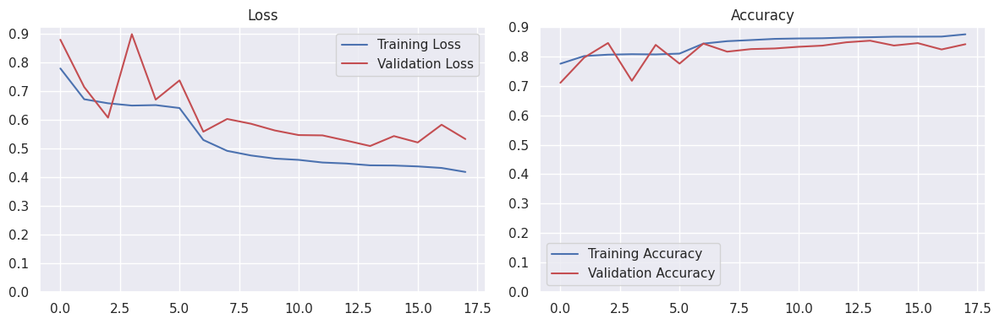

461/461 [==============================] - 1s 2ms/step


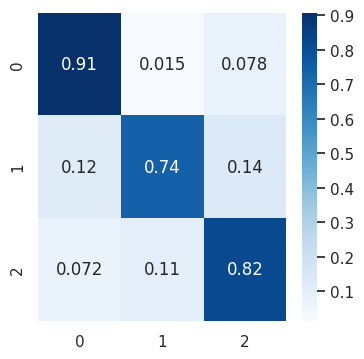

In [ ]:
plot_performance(history_baseline, ylims_loss=True, yticks_loss = [0,1], ylims_acc = True, yticks_acc = [0,1])
report, c_mx, cm_norm, _ = cl_report(model_baseline, X_test = X_test, y_test = y_test, softmax_output = True)
plt.figure(figsize = (4,4))
sns.heatmap(cm_norm, annot=True, cmap='Blues');

In [ ]:
c_mx

array([[9558,  156,  825],
       [ 441, 2652,  498],
       [  44,   65,  501]])

**Observations:**
1. Overfitting observed, from looking at the diverging loss curves.
2. The validation loss is moving upwards, which means model is not converging.
3. The kinks observed in the val loss curve indicate that the updates are oscillating.
3. Regularization, dropout and earlystopping is required along with reducing the learning rate as the epochs increase.

**8.2. ANN with Bayesian Optimization**

In [ ]:
def model_Bayesian_tuned(hp):
    units_1 = hp.Choice('UNITS_1', (np.linspace(381, 800, 271)//1).tolist())
    l2_1 = hp.Float('L2_1', min_value=1e-5, max_value=1e-2, sampling='log')
    dropouts_1 = hp.Choice('DROPOUTS_1',np.linspace(0.1, 0.6, 25).tolist())


    units_2 = hp.Choice('UNITS_2', (np.linspace(281,380, 271)//1).tolist())
    l2_2 = hp.Float('L2_2', min_value=1e-5, max_value=1e-2, sampling='log')
    dropouts_2 = hp.Choice('DROPOUTS_2',np.linspace(0.1, 0.6, 25).tolist())


    units_3 = hp.Choice('UNITS_3', (np.linspace(181, 280, 271)//1).tolist())
    l2_3 = hp.Float('L2_3', min_value=1e-5, max_value=1e-2, sampling='log')
    dropouts_3 = hp.Choice('DROPOUTS_3',np.linspace(0.1, 0.6, 25).tolist())

    units_4 = hp.Choice('UNITS_4', (np.linspace(25, 180, 271)//1).tolist())
    l2_4 = hp.Float('L2_4', min_value=1e-5, max_value=1e-2, sampling='log')
    dropouts_4 = hp.Choice('DROPOUTS_4',np.linspace(0.1, 0.6, 25).tolist())


    model = Sequential()
    model.add(Dense(units_1, activation = 'relu', input_shape = (X_train.shape[1],), kernel_regularizer = L2(l2_1)))
    model.add(Dropout(dropouts_1))

    model.add(Dense(units_2, activation = 'relu' , kernel_regularizer = L2(l2_2)))
    model.add(Dropout(dropouts_2))

    model.add(Dense(units_3, activation = 'relu' , kernel_regularizer = L2(l2_3)))
    model.add(Dropout(dropouts_3))

    model.add(Dense(units_4, activation = 'relu' , kernel_regularizer = L2(l2_4)))
    model.add(Dropout(dropouts_4))

    model.add(Dense(3, activation = 'softmax'))


    learning_rate = hp.Float('learning_rate', min_value=1e-5, max_value=1e-2, sampling='log')
    optimizer_choice = hp.Choice('optimizer', ['adam', 'adamax']) #

    if optimizer_choice == 'adam':
        optimizer = Adam(learning_rate=learning_rate, global_clipnorm = 1)
    elif optimizer_choice == 'adamax':
        optimizer = Adamax(learning_rate=learning_rate, global_clipnorm = 1)


    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'] )

    return model

In [ ]:
class myCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs={}):
        if logs.get('accuracy') == 0.95:
            print("\nReached 95% Training Accuracy so cancelling training!")

            # Stop training once the above condition is met
            self.model.stop_training = True
# Make large updates initially, then gradually become more precise with updates
def scheduler(epoch, lr):
    if epoch < 10:
        return lr* tf.math.exp(-0.001)
    elif epoch >= 10 and epoch < 15:
        return lr  * tf.math.exp(-0.04)
    elif epoch ==15:
        return lr * tf.math.exp(-0.04)
    elif epoch >15 and epoch < 20:
        return lr  * tf.math.exp(-0.02)
    elif epoch ==20:
        return lr * tf.math.exp(-0.1)
    elif epoch >20 and epoch < 30:
        return lr  * tf.math.exp(-0.02)
    elif epoch==30:
        return lr * tf.math.exp(-0.05)
    elif epoch==40:
        return lr * tf.math.exp(-0.2)
    elif epoch>40 and epoch<45:
        return lr * tf.math.exp(-0.05)
    elif epoch>=50 and epoch<55:
        return lr * tf.math.exp(-0.1)
    else:
        return lr* tf.math.exp(-0.1)

lr_scheduler = tf.keras.callbacks.LearningRateScheduler(scheduler)
callback = myCallback()
earlystopping = EarlyStopping(monitor='val_loss',
                               patience=5,
                               restore_best_weights=True,
                               start_from_epoch = 5)
reduce_lr = ReduceLROnPlateau(patience = 3, cooldown = 5, min_lr = 1e-8)

In [ ]:
%%time

# Define the path to the tuner file
tuner_file_path = 'keras_tuner_results/model_Bayesian_tuned_shallowNN/tuner0.json'

# Check if the file exists before attempting to delete it
if os.path.exists(tuner_file_path):
    # Delete the tuner file
    os.remove(tuner_file_path)
    print(f"The file {tuner_file_path} has been deleted.")
else:
    print(f"The file {tuner_file_path} does not exist.")

tuner = BayesianOptimization(model_Bayesian_tuned,
                             objective='val_accuracy',
                             max_trials=10,
                             num_initial_points=5,
                             directory='keras_tuner_results',
                             project_name='model_Bayesian_tuned_shallowNN')

'''
tuner.search(X_train, y_train,
             epochs=220,
             validation_steps = 5,
             validation_data = (X_val, y_val),
             callbacks=[earlystopping, lr_scheduler, callback, reduce_lr])'''

The file keras_tuner_results/model_Bayesian_tuned_shallowNN/tuner0.json does not exist.
CPU times: user 178 ms, sys: 2.99 ms, total: 181 ms
Wall time: 799 ms


'\ntuner.search(X_train, y_train,\n             epochs=220,\n             validation_steps = 5,\n             validation_data = (X_val, y_val),\n             callbacks=[earlystopping, lr_scheduler, callback, reduce_lr])'

In [ ]:
'''best_model = tuner.get_best_models(num_models=1)[0]
best_hyperparameters = tuner.get_best_hyperparameters(num_trials=1)[0]'''

In [ ]:
#joblib.dump(best_model, 'ANN_Bayesian_seq_8.2.pkl')

**8.3 Refitting tuned model**

In [ ]:
def ann_refit(X_train = X_train):
    model = Sequential()
    model.add(Dense(462, activation = 'relu', input_shape = (X_train.shape[1],) , kernel_regularizer = L2(0.00018134)) )
    model.add(Dropout(0.39083 ))
    model.add(Dense(266, activation = 'relu' , kernel_regularizer = L2(0.001712)))
    model.add(Dropout(0.32917 ))
    model.add(Dense(157, activation = 'relu' , kernel_regularizer = L2(8.7844e-05)))
    model.add(Dropout(0.5375))
    model.add(Dense(53, activation = 'relu' , kernel_regularizer = L2(0.0020418)))
    model.add(Dropout(0.475))
    model.add(Dense(3, activation = 'softmax'))
    model.compile(optimizer=Adamax(0.0013123 , global_clipnorm = 1), loss='categorical_crossentropy', metrics=['accuracy'])

    return model
ann_refit = ann_refit()
ann_refit.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_30 (Dense)            (None, 462)               45738     
                                                                 
 dropout_24 (Dropout)        (None, 462)               0         
                                                                 
 dense_31 (Dense)            (None, 266)               123158    
                                                                 
 dropout_25 (Dropout)        (None, 266)               0         
                                                                 
 dense_32 (Dense)            (None, 157)               41919     
                                                                 
 dropout_26 (Dropout)        (None, 157)               0         
                                                                 
 dense_33 (Dense)            (None, 53)               

In [ ]:
class myCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs={}):
        if logs.get('accuracy') == 0.95:
            print("\nReached 95% Training Accuracy so cancelling training!")

            # Stop training once the above condition is met
            self.model.stop_training = True
# Make large updates initially, then gradually become more precise with updates
def scheduler(epoch, lr):
    if epoch < 10:
        return lr* tf.math.exp(-0.01)
    elif epoch >= 10 and epoch < 15:
        return lr  * tf.math.exp(-0.06)
    elif epoch ==15:
        return lr * tf.math.exp(-0.04)
    elif epoch >15 and epoch < 20:
        return lr  * tf.math.exp(-0.1)
    elif epoch ==20:
        return lr * tf.math.exp(-0.3)
    elif epoch >20 and epoch < 30:
        return lr  * tf.math.exp(-0.02)
    elif epoch==30:
        return lr * tf.math.exp(-0.05)
    elif epoch==40:
        return lr * tf.math.exp(-0.02)
    elif epoch>40 and epoch<45:
        return lr * tf.math.exp(-0.05)
    elif epoch>=50 and epoch<55:
        return lr * tf.math.exp(-0.001)
    else:
        return lr

lr_scheduler = tf.keras.callbacks.LearningRateScheduler(scheduler)
callback = myCallback()
earlystopping = EarlyStopping(monitor='val_loss',
                               patience=5,
                               restore_best_weights=True,
                               start_from_epoch = 10)
reduce_lr = ReduceLROnPlateau(patience = 3, cooldown = 5, min_lr = 1e-8)

history_ann_refit = ann_refit.fit(X_train, y_train, validation_data = (X_val, y_val),
                                      validation_steps = 10, callbacks = [lr_scheduler, earlystopping, reduce_lr, callback],
                                      epochs = 220)



Epoch 1/220
2259/2259 [==============================] - 53s 23ms/step - loss: 0.9899 - accuracy: 0.7988 - val_loss: 0.7493 - val_accuracy: 0.8289 - lr: 0.0013
Epoch 2/220
2259/2259 [==============================] - 28s 12ms/step - loss: 0.5449 - accuracy: 0.8786 - val_loss: 0.5323 - val_accuracy: 0.8806 - lr: 0.0013
Epoch 3/220
2259/2259 [==============================] - 27s 12ms/step - loss: 0.4236 - accuracy: 0.8936 - val_loss: 0.5239 - val_accuracy: 0.8679 - lr: 0.0013
Epoch 4/220
2259/2259 [==============================] - 25s 11ms/step - loss: 0.3789 - accuracy: 0.9013 - val_loss: 0.5148 - val_accuracy: 0.8704 - lr: 0.0013
Epoch 5/220
2259/2259 [==============================] - 27s 12ms/step - loss: 0.3526 - accuracy: 0.9070 - val_loss: 0.4949 - val_accuracy: 0.8710 - lr: 0.0012
Epoch 6/220
2259/2259 [==============================] - 26s 12ms/step - loss: 0.3357 - accuracy: 0.9097 - val_loss: 0.4866 - val_accuracy: 0.8812 - lr: 0.0012
Epoch 7/220
2259/2259 [=================

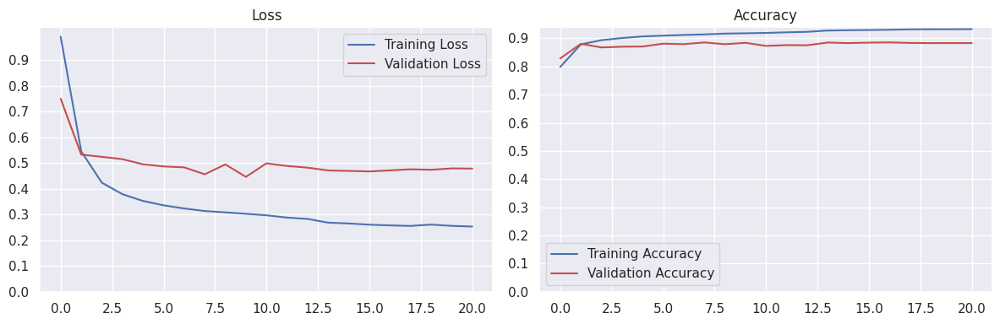

461/461 [==============================] - 3s 7ms/step


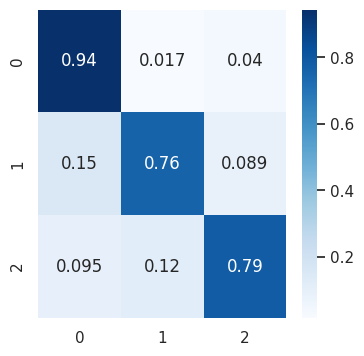

In [ ]:
plot_performance(history_ann_refit, ylims_loss=True, yticks_loss = [0,1], ylims_acc = True, yticks_acc = [0,1])
report, c_mx, cm_norm, ypreds = cl_report(ann_refit, X_test = X_test, y_test = y_test, softmax_output = True)
plt.figure(figsize = (4,4))
sns.heatmap(cm_norm, annot=True, cmap='Blues');

In [ ]:
joblib.dump(ann_refit, 'ann_refit.pkl')
joblib.dump(history_ann_refit, 'ann_refit.pkl')

['ann_refit.pkl']

**8.4 ANN with HyperBand**

In [ ]:
from keras_tuner import HyperModel
from keras_tuner.tuners import RandomSearch, Hyperband
from keras.layers import InputLayer

In [ ]:
class ANNhypermodel(HyperModel):

    def __init__(self, input_shape):
        self.input_shape = input_shape

    def build(self, hp):
        model = Sequential()

        model.add(InputLayer(input_shape=self.input_shape))

        #hidden_layers = hp.Choice('hidden_layers', [3,4,5,6])


        for i in range(hp.Int('num_layers', 3, 5)):
            model.add(Dense(
                units=hp.Choice('units_' + str(i+1), (np.linspace(10, 800, 271) // 1).tolist()),
                activation='relu',
                kernel_regularizer=L2(hp.Float('L2_' + str(i+1), min_value=1e-5, max_value=1e-2, sampling='log'))
            ))
            model.add(Dropout(hp.Choice('dropout_' + str(i+1), np.linspace(0.1, 0.6, 25).tolist())))

        model.add(Dense(3, activation='softmax'))

        learning_rate = hp.Float('learning_rate', min_value=1e-5, max_value=1e-2, sampling='log')
        optimizer_choice = hp.Choice('optimizer', ['adam', 'adamax'])

        if optimizer_choice == 'adam':
            optimizer = Adam(learning_rate=learning_rate, global_clipnorm=1)
        elif optimizer_choice == 'adamax':
            optimizer = Adamax(learning_rate=learning_rate, global_clipnorm=1)

        model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

        return model

hypermodel = ANNhypermodel(input_shape=[len(X_train.keys())])


In [ ]:
class myCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs={}):
        if logs.get('accuracy') == 0.95:
            print("\nReached 95% Training Accuracy so cancelling training!")

            # Stop training once the above condition is met
            self.model.stop_training = True
# Make large updates initially, then gradually become more precise with updates
def scheduler(epoch, lr):
    if epoch < 10:
        return lr* tf.math.exp(-0.01)
    elif epoch >= 10 and epoch < 15:
        return lr  * tf.math.exp(-0.06)
    elif epoch ==15:
        return lr * tf.math.exp(-0.04)
    elif epoch >15 and epoch < 20:
        return lr  * tf.math.exp(-0.1)
    elif epoch ==20:
        return lr * tf.math.exp(-0.3)
    elif epoch >20 and epoch < 30:
        return lr  * tf.math.exp(-0.02)
    elif epoch==30:
        return lr * tf.math.exp(-0.05)
    elif epoch==40:
        return lr * tf.math.exp(-0.02)
    elif epoch>40 and epoch<45:
        return lr * tf.math.exp(-0.05)
    elif epoch>=50 and epoch<55:
        return lr * tf.math.exp(-0.001)
    else:
        return lr

lr_scheduler = tf.keras.callbacks.LearningRateScheduler(scheduler)
callback = myCallback()
earlystopping = EarlyStopping(monitor='val_loss',
                               patience=5,
                               restore_best_weights=True,
                               start_from_epoch = 10)
reduce_lr = ReduceLROnPlateau(patience = 3, cooldown = 5, min_lr = 1e-8)

In [ ]:
%%time

print('searching for the best params!')
tuner= Hyperband(hypermodel,
                 objective= 'val_loss',
                 max_epochs=220,
                 executions_per_trial=1,
                 directory= 'hyperband_results',
                 project_name='model_hyperbandcv_tuned_shallowNN',
                 overwrite=True,
                 factor = 3,
                 seed = 42)

tuner.search(X_train, y_train,
             epochs=220,
             validation_steps = 10,
             validation_data = (X_val, y_val),
             verbose=1,
             callbacks = [lr_scheduler, earlystopping, reduce_lr, callback]
            )

# Retreive the optimal hyperparameters
best_hps= tuner.get_best_hyperparameters(num_trials=1)[0]

# Retrieve the best model
best_model = tuner.get_best_models(num_models=1)[0]

In [ ]:
plot_performance(best_model, ylims_loss=True, yticks_loss = [0,1], ylims_acc = True, yticks_acc = [0,1])
report, c_mx, cm_norm, ypreds = cl_report(best_model, X_test = X_test, y_test = y_test, softmax_output = True)
plt.figure(figsize = (4,4))
sns.heatmap(cm_norm, annot=True, cmap='Blues');

**8.5 ANN model explanation**

Examine Feature Contributions and Feature Interactions visually.
- Three plots for each of the target class, each plot representing a one-vs-all approach.

How to work with these plots?
- The y-axis has the prdict_proba value as f(x) and the X-axis represents each of the test-samples.
- The boundary between red and blue areas joins the f(x) values.
- For each sample along X, the features in blue area represent negative contributions and those in red represent positive contributions for predictions.
> - Select an effect along the y-axis dropdown menu and select a feature on the X-axis menu (at the top of each plot) to understand feature interaction and feature contributions to predictions.


In [ ]:
X_ann = X_train[:50]
y_ann = y_train[:50]

In [ ]:

# Create an explainer for your model
shap.initjs()
explainer = shap.KernelExplainer(ann_refit, X_ann)
shap_values = explainer.shap_values(X_test[:50])
for class_index in [0,1,2]:
    display(shap.force_plot(explainer.expected_value[class_index], shap_values[class_index], X_ann))

  0%|          | 0/50 [00:00<?, ?it/s]

**Summary and Conclusions**

The models were built and **optimized for maximizing True Positive (recall) predictions for class 2.** Class 2 predictions are where the money is, for the business. This decision was based on extensive discussions with the stakeholders and the an understanding that a business of this scale is expected to have a sales-team, which is equipped to absorb the impact of mispredictions in classes 0 and 1, in terms of man-hours spent chasing leads.

As such, the **goal is to not only maximize TP in class 2 but minimize mispredictions to show up in class 0.** Class 0 represents cold and wasted leads, and hence it is not desirable for sales team to miss out on potentially revenue-generating leads.

Keeping the above objectives in mind, I have feature engineered, built and iterated ~160 different models, and saved the best-performing models in this notebook. Of these, two high-performing models were developed with the help of Bayesian Optimization.

**1. XGBoost Classifier with Bayesian Optimization,** currently the best model, accurately captures 82% of class 2, with an overwhelming majority of mispredictions showing up in class 1, allowing Sales Team to still engage with the leads.

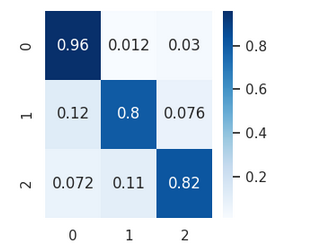

**2. Artificial Neural Network with Bayesian Optimization**, is the 2nd best model, with accurate capture of 79% of class 2 in test data. Further, the most of the mispredictions in class 2 showed up in class 1, as observed in the plot below.

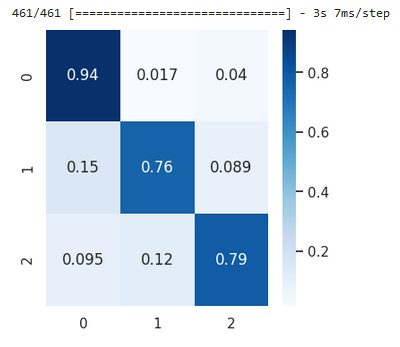

---


**SHAP and ELI5 Model explanations**

An additional feature of this notebook, for improving client confidence in the best performing models has also been provided, along with a guide for interpreting the force plots.

In [ ]:
#%reset